This notebook presents the reader codes for most of the plots and analyses in the paper entitled **"On the discovery of stars, quasars, and galaxies in the Southern Hemisphere with S-PLUS DR1"** from Nakazono et al. 2021. This file is organized by the paper sections.

Notes:

- Some parts require specific files. In these cases, I specify how to get them in the beginning of the section under "<font color='red'>**REQUIREMENTS:**</font>"

If you have any questions please contact lilianne.nakazono at usp dot br

# Libraries

In [438]:
import time
import copy
import warnings
import itertools
import pickle
import math
import scipy.stats as sts
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as stats
import seaborn as sns
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn.distributions as sd
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy.utils.exceptions import AstropyWarning
from matplotlib.gridspec import GridSpec
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from matplotlib.legend import Legend
from matplotlib import ticker
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FormatStrFormatter
from sklearn import metrics
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from astropy.stats import sigma_clip, mad_std
from seaborn.palettes import color_palette, blend_palette
from cycler import cycler
from six import string_types

from paths import * 

# paths.py contains directories's paths that will be called throughout this file
# such as img_path, data_path, match_path
# the reader may want to create your own paths.py file or simply update this notebook
# with your own paths before running it. 

In [297]:
# Settings and others

%matplotlib notebook
plt.rcParams.update({'font.size': 18})
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_columns', 20)
blue = (0, 0.48, 0.70)
orange = (230/255,159/255, 0)
yellow = (0.94, 0.89, 0.26)
pink = (0.8, 0.47, 0.65)
plt.rcParams['axes.prop_cycle'] = cycler('color', [pink, blue, yellow])

warnings.simplefilter('ignore', category=AstropyWarning)

morph = ['FWHM_n', 'A', 'B', 'KRON_RADIUS']

scoring = {
    'Precision_QSO': make_scorer(precision_score, average=None, labels=[0]),
    'Recall_QSO': make_scorer(recall_score, average=None, labels=[0]),
    'f1_QSO': make_scorer(f1_score, average=None, labels=[0]),
    'Precision_STAR': make_scorer(precision_score, average=None, labels=[1]),
    'Recall_STAR': make_scorer(recall_score, average=None, labels=[1]),
    'f1_STAR': make_scorer(f1_score, average=None, labels=[1]),
    'Precision_GAL': make_scorer(precision_score, average=None, labels=[2]),
    'Recall_GAL': make_scorer(recall_score, average=None, labels=[2]),
    'f1_GAL': make_scorer(f1_score, average=None, labels=[2]),
    'f1_macro': make_scorer(f1_score, average='macro')
}

mag = "iso"
feat3 = ['U_', 'G_', 'R_', 'I_', 'Z_']
feat2 = ['U_', 'G_', 'R_',
         'I_', 'Z_', 'w1mpro', 'w2mpro']
feat1 = ['U_', 'F378_', 'F395_', 'F410_', 'F430_',
         'G_', 'F515_', 'R_', 'F660_', 'I_', 'F861_', 'Z_']
feat0 = ['U_', 'F378_', 'F395_', 'F410_', 'F430_', 'G_',
         'F515_', 'R_', 'F660_', 'I_', 'F861_', 'Z_', 'w1mpro', 'w2mpro']

feat1 = [item+mag for item in feat1 if '_' in item]
feat0 = copy.deepcopy(feat1)
feat0.append('w1mpro')
feat0.append('w2mpro')

feat3 = [item+mag for item in feat3 if '_' in item]
feat2 = copy.deepcopy(feat3)
feat2.append('w1mpro')
feat2.append('w2mpro')
list_feat = [feat0, feat1, feat2, feat3]

# Functions

In [161]:
def classification(data, prob = True, append = False, merge=False):
    '''
    Create classifications for sources with or without counterpart

    Keywords arguments:
    data -- full dataset
    append --  if true, append results on data
    prob -- if true, estimates the probabilities for each class
	wise -- if true, adds second classification that takes into consideration the with WISE features

    returns a dataframe with classes (and probabilities)
    '''

    model = pickle.load(open("/Volumes/GoogleDrive/My Drive/Research/STAR_QSO/SQGTool_iDR3_eval/codes/iDR3n4_RF_12S4M", 'rb'))
    model_wise = pickle.load(open("/Volumes/GoogleDrive/My Drive/Research/STAR_QSO/SQGTool_iDR3_eval/codes/iDR3n4_RF_12S2W4M", 'rb'))

    morph = ['FWHM_n', 'A', 'B', 'KRON_RADIUS']

    feat = ['U_iso',
     'F378_iso',
     'F395_iso',
     'F410_iso',
     'F430_iso',
     'G_iso',
     'F515_iso',
     'R_iso',
     'F660_iso',
     'I_iso',
     'F861_iso',
     'Z_iso']

    feat_wise = ['w1mpro',
 'w2mpro']

    error_wise = ['w1snr_2',
 'w2snr_2',
 'w1sigmpro',
 'w2sigmpro']

    results = pd.DataFrame()

    data_wise = get_wise(data, feat_wise+error_wise)
    
    data_nowise = data.drop(data_wise.index)
    
    y_pred = pd.DataFrame(model.predict(data[morph+feat]))
    y_pred = y_pred.astype("float64")
    y_pred.index = data.index
    
    
    ypred_wise = pd.DataFrame(model_wise.predict(data_wise[morph+feat+feat_wise])) #classify sources with WISE
    ypred_wise.index = data_wise.index

    if prob:
        prob_df = pd.DataFrame(model.predict_proba(data[morph+feat]))
        prob_wise_df = pd.DataFrame(model_wise.predict_proba(data_wise[morph+feat+feat_wise]))
        prob_df.index = data.index
        prob_wise_df.index = data_wise.index
        
        if merge:
            y_pred = y_pred.drop(data_wise.index)
            prob_df = prob_df.drop(data_wise.index)
            y_pred["model_flag"] = "1" #S-PLUS
            ypred_wise["model_flag"] = "0" #S-PLUS + WISE
            results = pd.concat([y_pred,ypred_wise], axis=0)
            results.columns = ["CLASS", "model_flag"]
            prob_results = pd.concat([prob_df, prob_wise_df], axis=0)
            results = pd.concat([results, prob_results], axis=1)
            results.columns = ["CLASS", "model_flag", "PROB_QSO", "PROB_STAR", "PROB_GAL"]
        else:
            results = pd.concat([y_pred, prob_df, ypred_wise, prob_wise_df], axis=1)
            results.columns = ["CLASS", "PROB_QSO", "PROB_STAR", "PROB_GAL",
                                    "CLASS_WISE", "PROB_QSO_WISE", "PROB_STAR_WISE", "PROB_GAL_WISE"]
    else:
        if merge:
            y_pred["model_flag"] = "1" #S-PLUS
            ypred_wise["model_flag"] = "0" #S-PLUS + WISE
            results = pd.concat([y_pred,ypred_wise], axis=0)
            results.columns = ["CLASS", "model_flag"]
        else:

            results = pd.concat([y_pred,ypred_wise], axis=1)
            results.columns = ["CLASS", "CLASS_WISE"]
            
    if append:
        data = pd.concat([data,results], axis=1)
        return data
    else:
        return results

In [458]:
# Useful functions

def get_wise(data, list_names):
    '''
    Deletes objects without WISE counterpart from data 
    
    Keywords arguments:
    data -- full dataset
    list_names --  names of the columns corresponding to W1 and W2 magnitudes from WISE
    
    returns a copy of a subset from data with objects that have WISE counterpart
    '''
    copy = data.copy(deep=True)
    for feat in list_names:
        copy = copy[pd.isnull(copy[feat]) == False]
    return copy

def apply_sigma_clip(data, mag_splus, mag_sdss, sigma_value=4):
    '''
    Apply n-sigma clipping on the S-PLUS and SDSS magnitude difference per 
    magnitude (from S-PLUS) bin of size 0.5 
    
    Keywords arguments:
    data -- full dataset
    mag_splus -- magnitude from S-PLUS
    mag_sdss -- magnitude from SDSS
    sigma_value -- value of n (default: 4)
    create_plot -- determine if plot of mag_sdss - mag_splus x mag_splus is created
    
    returns a subset from data that pass through n-sigma clipping
    '''
    aux2 = data
    final_data = pd.DataFrame([])
    for i in np.arange(np.floor(np.min(data.query(mag_splus+'!=99 and '+mag_splus+'!=-99')[mag_splus])), np.ceil(np.max(data.query(mag_splus+'!=99 and '+mag_splus+'!=-99')[mag_splus])), 0.5):
        aux = aux2[(aux2[mag_splus] > i) & (aux2[mag_splus] <= i+0.5)].query(mag_sdss+'< 90 and '+mag_sdss+"> -90 and "+mag_splus+" <90")
        filtered_data = sigma_clip(
            aux[mag_sdss]-aux[mag_splus], sigma=sigma_value, maxiters=5, stdfunc=mad_std, return_bounds=True)
        if len(filtered_data) != 0:
            final_data = pd.concat(
                [final_data, aux[filtered_data[0].mask == False]], axis=0)

    return final_data


def get_rej(data, name, mag_splus, mag_sdss, cond='', verbose=False):
    '''
    Filter data using apply_sigma_clip and other conditions. 
    Quasars with mag_sdss = NaN are kept after n-sigma clipping.
    
    Keywords arguments:
    data -- dictionary containing dataframes for each class
    name -- states which class is data from. Entry can be: "qso", "star" or "gal". 
            If data was created with data_wise function, name has to include "wise" (e.g. "qso_wise")
    mag_splus -- magnitude from S-PLUS for the n-sigma clipping
    mag_sdss -- magnitude from SDSS for the n-sigma clipping
    cond -- any extra condition to subset data. Must be .query() readable
    verbose -- print outputs (default: False)
    
    Returns data with extra dictionary keys. Keys that end with "_filt" represents the filtered data.
    Keys that end with "_rej" represents a subset that was excluded from the data. 
    '''
    
    if 'qso' in name:
        param = "qso"
    elif 'star' in name:
        param = "star"
    else:
        param="gal"
    if 'wise' in name:
        param = param+"_wise"
        
    total = len(data[name])
    if verbose:
        print('The original ', name, ' dataset has: ', total, 'objects.')
    
    data_rej = data[name]
    data[name+"_filt"] = data[name].query(cond)
    rej1 = total - len(data[name+"_filt"])
    if verbose:
        print('# Rejected after '+cond+' '+str(rej1))
    if 'qso' in name:
        aux = data[name+"_filt"][np.isnan(data[name+"_filt"][mag_sdss])==True]
        data[name+"_filt"] = data[name+"_filt"][np.isnan(data[name+"_filt"][mag_sdss])==False]
    data[name+"_filt"] = apply_sigma_clip(data[name+"_filt"], mag_splus, mag_sdss)
    idx = data[name+"_filt"].index
    data_rej = data_rej.drop(idx)
    if 'qso' in name:
        data[name+"_filt"] = pd.concat([data[name+"_filt"],aux])
    rej2 = total - rej1 - len(data[name+"_filt"])
    if verbose:
        print('# Rejected after sigma-clipping: ', rej2)
        print('Total rejected: ', rej1+rej2)
        print('Total in the final sample: ', len(data[name+"_filt"]))
        print('-------------')
    data[param+"_rej"] = data_rej
    
    return


def print_metrics(results):
    '''
    Print metrics in percentage
    
    Keywords arguments:
    results -- output from cross_validate
    
    '''
    print("Fit time:", np.round(np.mean(results['fit_time']), 4), 
          '$\pm$', np.round(np.std(results['fit_time']), 4))
    print("P_QSO:", np.round(np.mean(results['test_Precision_QSO'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_Precision_QSO'])*100, 2))
    print("R_QSO:", np.round(np.mean(results['test_Recall_QSO'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_Recall_QSO'])*100, 2))
    print("F1_QSO:", np.round(np.mean(results['test_f1_QSO'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_f1_QSO'])*100, 2))
    print("P_STAR:", np.round(np.mean(results['test_Precision_STAR'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_Precision_STAR'])*100, 2))
    print("R_STAR:", np.round(np.mean(results['test_Recall_STAR'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_Recall_STAR'])*100, 2))
    print("F1_STAR:", np.round(np.mean(results['test_f1_STAR'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_f1_STAR'])*100, 2))
    print("P_GAL:", np.round(np.mean(results['test_Precision_GAL'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_Precision_GAL'])*100, 2))
    print("R_GAL:", np.round(np.mean(results['test_Recall_GAL'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_Recall_GAL'])*100,2))
    print("F1_GAL:", np.round(np.mean(results['test_f1_GAL'])*100, 2), r'$\pm$',
      np.round(np.std(results['test_f1_GAL'])*100, 2))
    print("Macro-averaged F-measure:", np.round(np.mean(results['test_f1_macro'])*100, 2), r'$\pm$',
          np.round(np.std(results['test_f1_macro'])*100, 2))

        
def print_stats(y_test, y_pred):
    '''
    Print total counts for missing objects and contamination per class
    
    Keywords arguments:
    y_test -- true values, dataframe with column name "target_test"
    y_pred -- predicted values, dataframe with column name "target_pred"
    
    '''
    print('accuracy:', np.round(accuracy_score(y_test, y_pred, normalize=True),4))
    print('P_QSO: ', np.round(precision_score(y_test, y_pred, average=None, labels=[0]),4))
    print('R_QSO: ', np.round(recall_score(y_test, y_pred, average=None, labels=[0]),4))
    print('F1_QSO: ', np.round(f1_score(y_test, y_pred, average=None, labels=[0]),4))
    print('P_STAR: ', np.round(precision_score(y_test, y_pred, average=None, labels=[1]),4))
    print('R_STAR: ', np.round(recall_score(y_test, y_pred, average=None, labels=[1]),4))
    print('F1_STAR: ', np.round(f1_score(y_test, y_pred, average=None, labels=[1]),4))
    print('P_GAL: ', np.round(precision_score(y_test, y_pred, average=None, labels=[2]),4))
    print('R_GAL: ', np.round(recall_score(y_test, y_pred, average=None, labels=[2]),4))
    print('F1_GAL: ', np.round(f1_score(y_test, y_pred, average=None, labels=[2]),4))
    print('F: ', np.round(f1_score(y_test, y_pred, average='macro'),4))

    final_y = y_test[(y_test['target_test']==1) | (y_test['target_test']==2)]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
    
    y = pd.concat([y_test, y_pred], axis=1)
    print('# of QSOs misclassifications:', len(ids))
    assert len(ids) == len(y.query('target_test!=0 and target_pred==0')), "There is something wrong with the dataframe indexes. Check if there is no duplicate index."

    final_y = y_test[y_test['target_test']==0]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]!=0].index].index
    print('# of QSOs being misclassified:',len(ids))

    final_y = y_test[y_test['target_test']==0]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==1].index].index
    print('# of QSOs being misclassified as stars:',len(ids))

    final_y = y_test[y_test['target_test']==0]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==2].index].index
    print('# of QSOs being misclassified as galaxies:',len(ids))

    final_y = y_test[(y_test['target_test']==0) | (y_test['target_test']==1)]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==2].index].index
    print('# of galaxies misclassifications:',len(ids))

    final_y = y_test[y_test['target_test']==2]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]!=2].index].index
    print('# of galaxies being misclassified:',len(ids))

    final_y = y_test[y_test['target_test']==2]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==1].index].index
    print('# of galaxies being misclassified as stars:',len(ids))

    final_y = y_test[y_test['target_test']==2]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
    print('# of galaxies being misclassified as quasars:',len(ids))

    final_y = y_test[(y_test['target_test']==0) | (y_test['target_test']==2)]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==1].index].index
    print('# of star misclassifications:',len(ids))

    final_y = y_test[y_test['target_test']==1]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]!=1].index].index
    print('# of stars being misclassified:',len(ids))

    final_y = y_test[y_test['target_test']==1]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==2].index].index
    print('# of stars being misclassified as galaxies:',len(ids))

    final_y = y_test[y_test['target_test']==1]
    final_ypred = y_pred.loc[final_y.index]
    ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
    print('# of stars being misclassified as quasars:',len(ids))

def print_table_results(results, algorithm):
    '''
    Print latex table code
    
    Keywords arguments:
    results -- output from cross_validate
    algorithm -- "SVM" for Support Vector Machines and "RF" for Random Forest
    
    '''
    print(r'\multirow{3}{*}', algorithm,r' & \multirow{3}{*}{', np.round(np.mean(results['fit_time']), 2),
      '$\pm$', np.round(
          np.std(results['fit_time']), 2), r'} & \multirow{3}{*}{', np.round(np.mean(results['score_time']), 2),
          '$\pm$', np.round(np.std(results['score_time']), 2),
          r'} & \multirow{3}{*}{', np.round(np.mean(results['test_f1_macro']*100), 2), r'$\pm$',
      np.round(np.std(results['test_f1_macro']*100), 2), '} & QSO &',
      np.round(np.mean(results['test_Precision_QSO']*100), 2), r'$\pm$',
      np.round(np.std(results['test_Precision_QSO']*100), 2), r'&', np.round(
          np.mean(results['test_Recall_QSO']*100), 2), r'$\pm$',
      np.round(np.std(results['test_Recall_QSO']*100), 2), r'&', np.round(
          np.mean(results['test_f1_QSO']*100), 2), r'$\pm$',
      np.round(np.std(results['test_f1_QSO']*100), 2), r'\\')
    print(r'&&&& STAR &', np.round(np.mean(results['test_Precision_STAR']*100), 2), r'$\pm$',
          np.round(np.std(results['test_Precision_STAR']*100), 2), r'&', np.round(
              np.mean(results['test_Recall_STAR']*100), 2), r'$\pm$',
          np.round(np.std(results['test_Recall_STAR']*100), 2), r'&', np.round(
              np.mean(results['test_f1_STAR']*100), 2), r'$\pm$',
          np.round(np.std(results['test_f1_STAR']*100), 2), r'\\')
    print(r'&&&& GAL &', np.round(np.mean(results['test_Precision_GAL']*100), 2), r'$\pm$',
          np.round(np.std(results['test_Precision_GAL']*100), 2), r'&', np.round(
              np.mean(results['test_Recall_GAL']*100), 2), r'$\pm$',
          np.round(np.std(results['test_Recall_GAL']*100), 2), r'&', np.round(
              np.mean(results['test_f1_GAL']*100), 2), r'$\pm$',
          np.round(np.std(results['test_f1_GAL']*100), 2), r'\\')

    
def calc_contamination(y_p, y_test, X_test):
    '''
    Calculate contamination rate per class and per magnitude
    
    Keywords arguments:
    y_p -- predicted values, dataframe with column name "target_pred"
    y_test -- true values, dataframe with column name "target_test"
    X_test -- dataframe containing information of 'R_iso' for the test sample
    
    '''
    cont_qso = []
    cont_star = []
    cont_gal = []
    y_p.columns=['target_pred']
    n_qso_class = len(y_p.query('target_pred == 0'))
    n_star_class = len(y_p.query('target_pred == 1'))
    n_gal_class = len(y_p.query('target_pred==2'))
    
    final_y = y_test[(y_test['target_test']==1) | (y_test['target_test']==2)]
    final_ypred = y_p.loc[final_y.index]
    b = final_ypred[final_ypred.iloc[:,0]==0].index

    for mag in r_mag:
        a = X_test[X_test['R_iso']<=mag].index
        i = np.intersect1d(a,b)
        cont_qso.append(len(i))
    final_y = y_test[(y_test['target_test']==0) | (y_test['target_test']==2)]
    final_ypred = y_p.loc[final_y.index]
    b = final_ypred[final_ypred.iloc[:,0]==1].index    
    for mag in r_mag:
        a = X_test[X_test['R_iso']<=mag].index
        i = np.intersect1d(a,b)
        cont_star.append(len(i))

    final_y = y_test[(y_test['target_test']==0) | (y_test['target_test']==1)]
    final_ypred = y_p.loc[final_y.index]
    b = final_ypred[final_ypred.iloc[:,0]==2].index    
    for mag in r_mag:
        a = X_test[X_test['R_iso']<=mag].index
        i = np.intersect1d(a,b)
        cont_gal.append(len(i))
    return cont_qso, cont_star, cont_gal, n_qso_class, n_star_class, n_gal_class

def calc_fnr(y_p, y_t, X_t):
    '''
    Calculate miss rate per class and per magnitude
    
    Keywords arguments:
    y_p -- predicted values, dataframe with column name "target_pred"
    y_t -- true values, dataframe with column name "target_test"
    X_t -- dataframe containing information of 'R_iso' for the test sample
    
    '''
    mis_qso = []
    mis_star = []
    mis_gal = []
    n_qso_test = len(y_t.query('target_test == 0'))
    n_star_test = len(y_t.query('target_test == 1'))
    n_gal_test = len(y_t.query('target_test == 2'))

    y_pred.columns=['target_pred']

    final_ypred = y_p[(y_p['target_pred']==1) | (y_p['target_pred']==2)]
    final_y = y_t.loc[final_ypred.index]
    b = final_y[final_y.iloc[:,0]==0].index

    for mag in r_mag:
        a = X_t[X_t['R_iso']<=mag].index
        i = np.intersect1d(a,b)
        mis_qso.append(len(i))

    final_ypred = y_p[(y_p['target_pred']==0) | (y_p['target_pred']==2)]
    final_y = y_t.loc[final_ypred.index]
    b = final_y[final_y.iloc[:,0]==1].index    
    for mag in r_mag:
        a = X_t[X_t['R_iso']<=mag].index
        i = np.intersect1d(a,b)
        mis_star.append(len(i))

    final_ypred = y_p[(y_p['target_pred']==0) | (y_p['target_pred']==1)]
    final_y = y_t.loc[final_ypred.index]
    b = final_y[final_y.iloc[:,0]==2].index    
    for mag in r_mag:
        a = X_t[X_t['R_iso']<=mag].index
        i = np.intersect1d(a,b)
        mis_gal.append(len(i))
    
    return mis_qso, mis_star, mis_gal, n_qso_test, n_star_test, n_gal_test



# [Section 1] Introduction

## [Figure 1b] and some extra

<font color='red'> **REQUIREMENTS:**</font>

- For this figure, we need the transmission curve of all S-PLUS narrow-band filters. The transmission curves are available for download in
<a href="http://www.splus.iag.usp.br/instrumentation/">this link</a>. 

In [5]:
# Initializing variables
minimos = np.zeros(7)
maximos = np.zeros(7)
i = 0

# Restframe wavelength of some main QSO emission lines
restframe = {
    "Halpha": 6564.61,
    "Hbeta": 4862.68,
    "Hgamma": 4341.68,
    "Lya": 1215.24,
    "MgII": 2799.117,
    "CIII": 1908.734,
    "CIV": 1549.48
}

# Creating array of redshifts from 0 to 7
redshifts = np.linspace(0, 7, 1000)
lambda_obs = {
    "Halpha": [],
    "Hbeta": [],
    "Hgamma": [],
    "Lya": [],
    "MgII": [],
    "CIII": [],
    "CIV": []
}

for z in redshifts:
    for w in sorted(restframe, key=restframe.get, reverse=True):
        lambda_obs[w].append(z*restframe[w]+restframe[w])

# List containing the filenames of each transmission curve
lists = ['F0378', 'F0395', 'F0410', 'F0430', 'F0515', 'F0660', 'F0861']

# Getting minimum and maximum of each filter
for name in lists:
    data = pd.read_table(filter_path+name, delim_whitespace=True, header=None)
    data.columns = ['wav', 'res']
    data = data.query('res>0.1')
    minimos[i] = np.min(data.wav)*10
    maximos[i] = np.max(data.wav)*10
    i = i+1

<IPython.core.display.Javascript object>


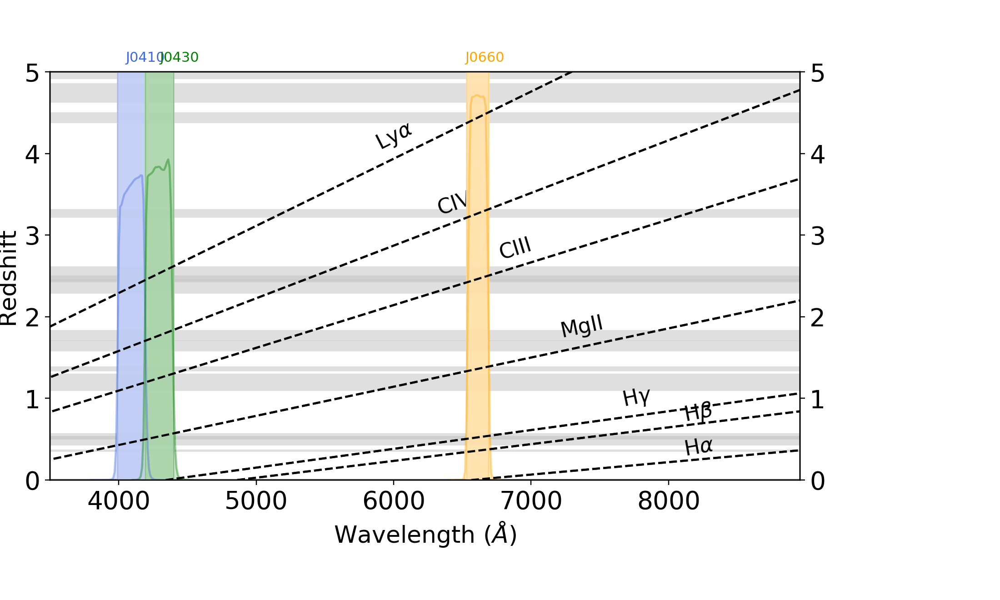

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:66: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


In [6]:
# Figure 1b

# Setting the color scheme and other plot properties
custom_cycler = (
    cycler(color=['blueviolet', 'b', 'royalblue', 'green', 'y', 'orange', 'red']))
plt.rcParams['axes.prop_cycle'] = custom_cycler
colors = ['blueviolet', 'b', 'royalblue', 'green', 'y', 'orange', 'red']

fig, ax2 = plt.subplots(figsize=(10, 6))
plt.subplots_adjust(left=0.05, right=0.8, bottom=0.2)

labels = [r'H$\alpha$', r'H$\beta$', r'H$\gamma$',
          r'MgII', r'CIII', r'CIV', r'Ly$\alpha$']
color = ['slateblue', ]

# PLOTTING THE REDSHIFT BANDS

y = [0.3, 0.72, 0.9, 1.75, 2.7, 3.25, 4.05]  # [hard-coded]
x = 8100  # [hard-coded]
rotation = [10, 11, 12, 12, 17, 19, 27]  # [hard-coded]

for w, key, label, y, rot in zip(sorted(restframe, key=restframe.get, reverse=True), list(lambda_obs.keys()), labels, y, rotation):
    ax2.plot(lambda_obs[w], (redshifts), linestyle='--', label=label,
             color="black", alpha=0.8, zorder=0)
    plt.text(x, y, label, size=15, rotation=rot)
    ax2.set_xlim(3500, 8956)  # [hard-coded]
    z1, z2 = 0, 0
    for value1, value2 in zip(minimos, maximos):
        z1 = (value1 - restframe[w])/restframe[w]
        z2 = (value2 - restframe[w])/restframe[w]
        if z1 < 0 and z2 < 0:
            continue
        else:
            ax2.axhspan(z1, z2, facecolor="silver", alpha=0.5, zorder=0)
    if y != 0.3:  # [hard-coded]
        x = x-450  # [hard-coded]

ax2.set_ylim(0, 5)  # [hard-coded]
ax2.set_ylabel('Redshift', size=17)
ax2.set_xlabel(r'Wavelength ($\AA{}$)', size=17)

# PLOTTING THE TRANSMISSION CURVES
lists = ['F0378', 'F0395', 'F0410', 'F0430', 'F0515', 'F0660', 'F0861']
ax = ax2.twinx()
for path in lists:
    data = pd.read_table(filter_path+path, header=None, delim_whitespace=True)
    ax.plot(data.loc[:, 0]*10, data.loc[:, 1], linestyle='-',  alpha=0.4)
    ax.fill_between(data.loc[:, 0]*10, data.loc[:, 1], alpha=0.2, zorder=0)
ax.get_yaxis().set_visible(False)
ax.set_ylim(0, 0.8)  # [hard-coded]

lists = ['J0378', 'J0395', 'J0410', 'J0430', 'J0515', 'J0660', 'J0861']

offsets = [160, 80, -60, -110, 10, 10, -50]  # [hard-coded]
y = [0.3, 0.72, 0.9, 1.75, 2.7, 3.25, 4.05]  # [hard-coded]
x = 8100  # [hard-coded]
rotation = [10, 11, 12, 12, 17, 19, 27]  # [hard-coded]

for value1, value2, c, name, offset in zip(minimos, maximos, colors, lists, offsets):
    ax.fill_between(np.array([value1, value2]), np.array(
        [5, 5]), color="white", alpha=0.9)
    ax.fill_between(np.array([value1, value2]),
                    np.array([5, 5]), color=c, alpha=0.3)
    ax.text(value1-offset, 0.82, name, size=10, color=c)

plt.tight_layout()

ax3 = ax2.twinx()
for w, key, label, y, rot in zip(sorted(restframe, key=restframe.get, reverse=True), list(lambda_obs.keys()), labels, y, rotation):
    ax3.plot(lambda_obs[w], (redshifts), linestyle='--',
             label=label, color="black", alpha=1, zorder=10)
ax3.set_ylim(0, 5)  # [hard-coded]

# To save the figure, uncomment below
# plt.savefig(img_path+'/redshift_filter_poster_new.png')

plt.show()

Uncomment and run the cell below to see the exact redshift intervals for which each emission line would be detected in each S-PLUS narrow-band filter.


In [5]:
# for w in sorted(restframe, key=restframe.get, reverse=True):
#     print(w)
#     for value1,value2 in zip(minimos,maximos):
#         z1 = round((value1 - restframe[w])/restframe[w], 2)
#         z2 = round((value2 - restframe[w])/restframe[w], 2)
#         if z1 < 0:
#             z1 = '-'
#         if z2 < 0:
#             z2 = '-'
#         print (value1, '-',  value2, ':','[',z1,',',z2,']')

Halpha
3690.0 - 3850.0 : [ - , - ]
3880.0 - 4000.0 : [ - , - ]
3990.0 - 4200.0 : [ - , - ]
4190.0 - 4400.0 : [ - , - ]
5030.0 - 5240.0 : [ - , - ]
6530.0 - 6690.0 : [ - , 0.02 ]
8390.0 - 8840.0 : [ 0.28 , 0.35 ]
Hbeta
3690.0 - 3850.0 : [ - , - ]
3880.0 - 4000.0 : [ - , - ]
3990.0 - 4200.0 : [ - , - ]
4190.0 - 4400.0 : [ - , - ]
5030.0 - 5240.0 : [ 0.03 , 0.08 ]
6530.0 - 6690.0 : [ 0.34 , 0.38 ]
8390.0 - 8840.0 : [ 0.73 , 0.82 ]
Hgamma
3690.0 - 3850.0 : [ - , - ]
3880.0 - 4000.0 : [ - , - ]
3990.0 - 4200.0 : [ - , - ]
4190.0 - 4400.0 : [ - , 0.01 ]
5030.0 - 5240.0 : [ 0.16 , 0.21 ]
6530.0 - 6690.0 : [ 0.5 , 0.54 ]
8390.0 - 8840.0 : [ 0.93 , 1.04 ]
MgII
3690.0 - 3850.0 : [ 0.32 , 0.38 ]
3880.0 - 4000.0 : [ 0.39 , 0.43 ]
3990.0 - 4200.0 : [ 0.43 , 0.5 ]
4190.0 - 4400.0 : [ 0.5 , 0.57 ]
5030.0 - 5240.0 : [ 0.8 , 0.87 ]
6530.0 - 6690.0 : [ 1.33 , 1.39 ]
8390.0 - 8840.0 : [ 2.0 , 2.16 ]
CIII
3690.0 - 3850.0 : [ 0.93 , 1.02 ]
3880.0 - 4000.0 : [ 1.03 , 1.1 ]
3990.0 - 4200.0 : [ 1.09 , 1.2 ]
4

# [Section 2] Surveys

<font color='red'> **REQUIREMENTS:**</font>

For this section and beyond one needs to download the S-PLUS dataset and do the cross-match with ALLWISE (2") and SDSS DR16/DR14Q (1"). 


- To download the S-PLUS DR2 dataset for the Stripe 82 region, go to <a href="https://splus.cloud/query">S-PLUS CLOUD</a> (one has to create a login) and run the following ADQL query:
```
select det.id, det.ra, det.dec, det.A, det. B, det. FWHM_n, det.KRON_RADIUS, det.nDet_iso, r.PhotoFlag_r,
		u.u_iso, z.z_iso, g.g_iso, r.r_iso, i.i_iso,
        j0378.j0378_iso, j0395.j0395_iso, j0410.j0410_iso, 
        j0430.j0430_iso, j0515.j0515_iso,  j0660.j0660_iso, 
        j0861.j0861_iso from dr2.detection_image as det join
        dr2.g_band as g on g.id = det.id join
        dr2.z_band as z on z.id = det.id join
        dr2.r_band as r on r.id = det.id join
        dr2.i_band as i on i.id = det.id join
        dr2.u_band as u on u.id = det.id join
        dr2.j0378_band as j0378 on j0378.id = det.id join
        dr2.j0395_band as j0395 on j0395.id = det.id join
        dr2.j0410_band as j0410 on j0410.id = det.id join
        dr2.j0430_band as j0430 on j0430.id = det.id join
        dr2.j0515_band as j0515 on j0515.id = det.id join
        dr2.j0660_band as j0660 on j0660.id = det.id join
        dr2.j0861_band as j0861 on j0861.id = det.id 
 where det.dec <=1.26 and det.dec > = -1.26 and (det.ra > 295 or det.ra <62) and r.r_iso <= 22
```
One can also download https://splus.cloud/files/Spectroscopic_sample.csv that was built within this code, containing information of which sources were used for training/testing and for each cross-validation training/testing step. However, this notebook was not prepared for the Spectroscopic_sample.csv file, therefore one would have to modify the codes for such.


- Link to download SDSS DR14Q: <a href="https://www.sdss.org/dr14/algorithms/qso_catalog/">DR14Q_v4_4.fits</a>
- To download the SDSS DR16, go to <a href="https://skyserver.sdss.org/casjobs/">CASJobs</a> and run the following ADQL queries:

```
SELECT spec.SpecObjid, spec.targetObjID, spec.sciencePrimary, spec.objID, spec.mjd, spec.plate, spec.tile, spec.fiberID, spec.ra, spec.dec,spec.z, spec.zErr, spec.class, spec.subClass, spec.zWarning, spec.survey, spec.programname, spec.sourceType, spec.mode, spec.type, spec.flags, spec.modelmag_u, spec.modelmag_g, spec.modelmag_r, spec.modelmag_i, spec.modelmag_z, spec.modelMagErr_u, spec.modelMagErr_g, spec.modelMagErr_r, spec.modelMagErr_i, spec.modelMagErr_z
INTO MyDB.SDSS_fullS82_specobj_DR16_23
FROM SpecPhoto as spec
WHERE spec.dec <= 1.26 AND spec.dec >= -1.26 AND
  (spec.ra > 295. OR spec.ra < 62.) AND
  spec.modelmag_r < 23
  
SELECT objID, type, probPSF, modelMag_r, ra, dec
INTO [myscratch:default].SDSS_fullS82_photoobj_DR16_23_new
FROM PhotoObj as spec
WHERE spec.dec <= 1.26 AND spec.dec >= -1.26 AND
  (spec.ra > 295. OR spec.ra < 62.) AND
  spec.modelmag_r < 23.
```

- To download the ALLWISE catalogue, go to <a href="https://datalab.noao.edu/query.php">NOAO Datalab</a> and run the following SQL query:

```
SELECT ra, dec, w1mpro, w1sigmpro, w1snr, w1sat, w2mpro, w2sigmpro, w2snr, w2sat, ext_flg, cc_flags, var_flg, ph_equal FROM allwise.source WHERE (dec<=1.25 AND dec>=-1.25) AND (ra > 295 OR ra < 60)
```

We cross-matched our catalogues using the astronomical software TOPCAT with "Best match, symmetric" option.



## Reading dataset

Read galaxies, stars and quasars data from DR2, which are previously cross-matched with SDSS DR16 (1"), SDSS DR14Q (1") and ALLWISE catalogues (2"). 

In [365]:
gal = Table.read(os.path.join(spec_path,"GALAXY_S82_iDR3n4.fits"), format="fits")
star = Table.read(os.path.join(spec_path,"STAR_S82_iDR3n4.fits"), format="fits")
qso = Table.read(os.path.join(spec_path,"QSO_S82_iDR3n4.fits"), format="fits")

In [366]:
# fits to pandas dataframe
names = [name for name in gal.colnames if len(gal[name].shape) <= 1]
gal = gal[names].to_pandas()
names = [name for name in star.colnames if len(star[name].shape) <= 1]
star = star[names].to_pandas()
names = [name for name in qso.colnames if len(qso[name].shape) <= 1]
qso = qso[names].to_pandas()

for col_name in gal.columns:
    if gal[col_name].dtype == "object":
        gal[col_name] = gal[col_name].str.decode('utf-8')
        
for col_name in star.columns:
    if star[col_name].dtype == "object":
        star[col_name] = star[col_name].str.decode('utf-8')      
        
for col_name in qso.columns:
    if qso[col_name].dtype == "object":
        qso[col_name] = qso[col_name].str.decode('utf-8')

/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3437: TableReplaceWarning: converted column 'THING_ID' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3437: TableReplaceWarning: converted column 'PLATE_1' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3437: TableReplaceWarning: converted column 'MJD_1' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3437: TableReplaceWarning: converted column 'FIBERID_1' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)
/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.

In [367]:
# For quasars, we use the WISE information included in SDSS DR14Q (which is also from ALLWISE)
# This cell replaces the columns names from SDSS DR14Q to the corresponding column names from ALLWISE 

list_sg = ["w1mpro", "w2mpro", "w1snr_2", "w2snr_2", "w1sigmpro", "w2sigmpro"] #hard-coded
list_q = ["W1MAG","W2MAG",  "W1SNR_1","W2SNR_1", "ERR_W1MAG", "ERR_W2MAG",] #hard-coded

qso.drop(columns=list_sg, inplace=True)
for i,j in zip(list_sg, list_q):
    qso.rename(columns={j:i}, inplace=True)

In [368]:
# Creating new column "target"
qso = qso.assign(target=0)
star = star.assign(target=1)
gal = gal.assign(target=2)

# Creating dictionary 
data = {"qso": qso, "star":star, "gal":gal}

In [369]:
# Filtering criteria
cond_gal = 'PhotoFlag_R == 0 and zWarning_2==0 and R_iso<=22'
cond_star = 'R_iso>13 and PhotoFlag_R == 0 and R_iso<=22'
cond_qso = 'PhotoFlag_R == 0 and R_iso<=22'

# Magnitudes for n-sigma clipping
mag_splus = 'R_iso'
mag_sdss = 'modelmag_r'

In [370]:
# Filtering data using the criteria from last cell and 4-sigma clipping
n = len(list(data))
for key in range(n):
    if "qso" in list(data)[key]:
        cond = cond_qso
    elif "star" in list(data)[key]:
        cond = cond_star
    else:
        cond = cond_gal
    if "rej" or "filt" not in list(data)[key]:
        get_rej(data,list(data)[key], mag_splus, mag_sdss, cond=cond,verbose=True)

The original  qso  dataset has:  28275 objects.
# Rejected after PhotoFlag_R == 0 and R_iso<=22 9217
# Rejected after sigma-clipping:  69
Total rejected:  9286
Total in the final sample:  18989
-------------
The original  star  dataset has:  78217 objects.
# Rejected after R_iso>13 and PhotoFlag_R == 0 and R_iso<=22 22464
# Rejected after sigma-clipping:  1702
Total rejected:  24166
Total in the final sample:  54051
-------------
The original  gal  dataset has:  154529 objects.
# Rejected after PhotoFlag_R == 0 and zWarning_2==0 and R_iso<=22 87966
# Rejected after sigma-clipping:  951
Total rejected:  88917
Total in the final sample:  65612
-------------


In [371]:
# Getting WISE subsets (with_WISE)
qso_wise = get_wise(qso, list_sg)
star_wise = get_wise(star, list_sg)
gal_wise = get_wise(gal, list_sg)


In [372]:
# Subset data with WISE counterpart (with_WISE)
data["qso_wise_filt"] = get_wise(data["qso_filt"], list_sg)
data["star_wise_filt"] = get_wise(data["star_filt"], list_sg)
data["gal_wise_filt"] = get_wise(data["gal_filt"], list_sg)

# Subset data without WISE counterpart (no_WISE)
data["qso_filt"].drop(data["qso_wise_filt"].index, inplace=True)
data["star_filt"].drop(data["star_wise_filt"].index, inplace=True)
data["gal_filt"].drop(data["gal_wise_filt"].index, inplace=True)



<IPython.core.display.Javascript object>


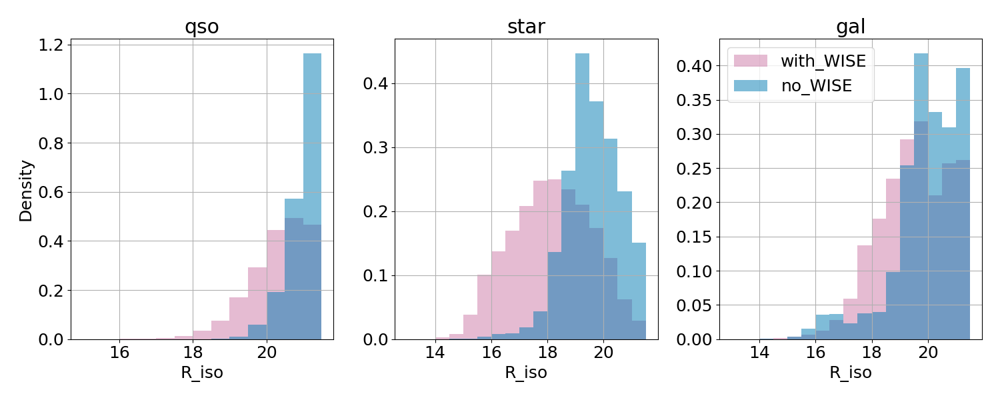

<IPython.core.display.Javascript object>


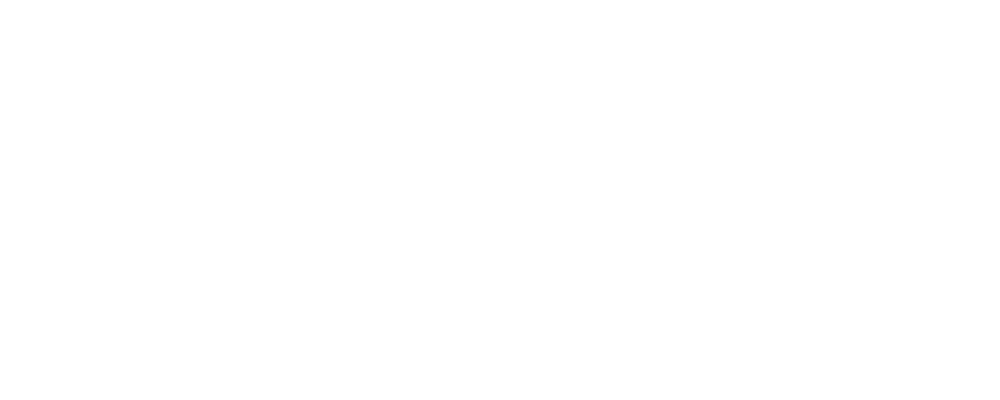

In [394]:
plt.close()

def plot_dist_classes(var, cond, step, alpha,density=True):
    fig, ax = plt.subplots(1,3, figsize=(15,6))
    classes = ["qso","star","gal"]
    for obj,t in zip(classes,[0,1,2]):
        vmin = np.floor(np.min([*data[obj+"_wise_filt"][var],*data[obj+"_filt"][var]]))
        vmax = np.ceil(np.max([*data[obj+"_wise_filt"].query(cond)[var],*data[obj+"_filt"].query(cond)[var]]))
        ax[t].hist(data[obj+"_wise_filt"][var], bins=np.arange(vmin,vmax,step), alpha=alpha, density=density, label="with_WISE")
        ax[t].hist(data[obj+"_filt"][var], bins=np.arange(vmin,vmax,step), alpha=alpha, density=density, label="no_WISE")
        ax[t].set_title(obj)
        ax[t].set_xlabel(var)
    
    ax[0].set_ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.show()
var="R_iso"
cond=var+"!=99"
alpha=0.5
density=True
plot_dist_classes(var,cond, 0.5, alpha)

var="FWHM_n"
cond=var+">0"
plot_dist_classes(var,cond, 0.5, alpha)

plt.close()

<IPython.core.display.Javascript object>


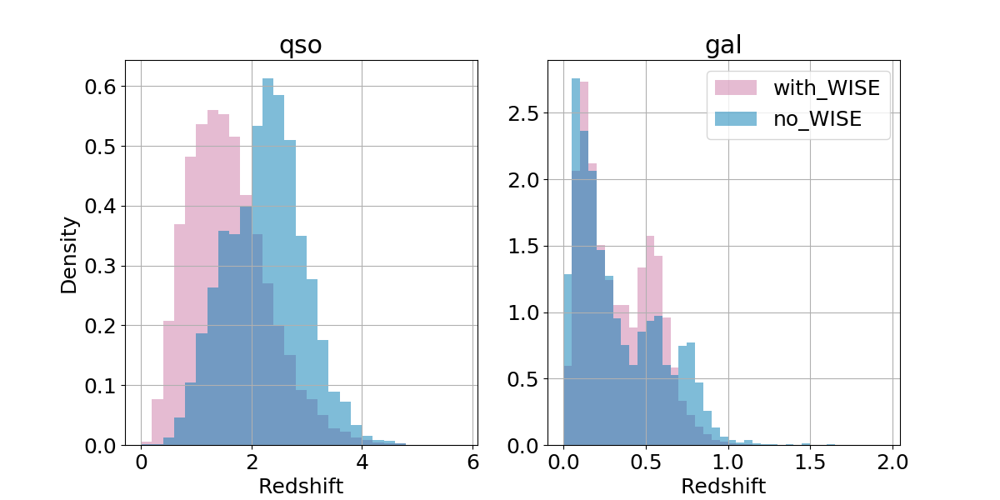

In [385]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
obj="qso"
var="Z_1"
step=.2
t=0
vmin = np.floor(np.min([*data[obj+"_wise_filt"][var],*data[obj+"_filt"][var]]))
vmax = np.ceil(np.max([*data[obj+"_wise_filt"][var],*data[obj+"_filt"][var]]))
ax[t].hist(data[obj+"_wise_filt"][var], bins=np.arange(vmin,vmax,step), alpha=alpha, density=density, label="with_WISE")
ax[t].hist(data[obj+"_filt"][var], bins=np.arange(vmin,vmax,step), alpha=alpha, density=density, label="no_WISE")
ax[t].set_title(obj)
ax[t].set_xlabel("Redshift")
ax[0].set_ylabel("Density")

obj="gal"
var="z_2"
cond = var+">0"
step=.05
t=1
vmin = np.floor(np.min([*data[obj+"_wise_filt"].query(cond)[var],*data[obj+"_filt"].query(cond)[var]]))
vmax = np.ceil(np.max([*data[obj+"_wise_filt"][var],*data[obj+"_filt"][var]]))
ax[t].hist(data[obj+"_wise_filt"][var], bins=np.arange(vmin,vmax,step), alpha=alpha, density=density, label="with_WISE")
ax[t].hist(data[obj+"_filt"][var], bins=np.arange(vmin,vmax,step), alpha=alpha, density=density, label="no_WISE")
ax[t].set_title(obj)
ax[t].set_xlabel("Redshift")   

plt.legend()
plt.close()


In [380]:
# Dataframe containing data without WISE counterpart (all classes)
data_nowise = pd.concat([data["qso_filt"], data["star_filt"], data["gal_filt"]], ignore_index=True)

# Dataframe containing data with WISE counterpart (all classes)
data_wise = pd.concat([data["qso_wise_filt"], data["star_wise_filt"], data["gal_wise_filt"]], ignore_index=True)

# If one wants to convert WISE vega magnitudes to AB magnitudes:
# data_wise['w1mpro'] = data_wise['w1mpro'] + 2.699 
# data_wise['w2mpro'] = data_wise['w2mpro'] + 3.339

# Master dataframe 
all_data = pd.concat([data_wise, data_nowise], ignore_index=True)
    

In [396]:
print("with_WISE sample / ", "no_WISE sample / ", "final sample")
print(len(data["qso_wise_filt"]),len(data["qso_filt"]), len(data["qso_filt"])+len(data["qso_wise_filt"]))
print(len(data["star_wise_filt"]),len(data["star_filt"]),len(data["star_filt"])+len(data["star_wise_filt"]))
print(len(data["gal_wise_filt"]),len(data["gal_filt"]),len(data["gal_filt"])+len(data["gal_wise_filt"]))

with_WISE sample /  no_WISE sample /  final sample
15538 3451 18989
39595 14456 54051
60059 5553 65612


# [Section 3] Description of the spectroscopic samples

## Star types

In [193]:
data["star_filt"].subClass.str.get(0).value_counts(normalize=True)*100

F    39.388489
K    17.176259
A    16.519092
M     8.536248
G     7.567792
W     4.807692
B     1.646375
C     1.611787
T     0.920033
L     0.913116
O     0.677919
s     0.235196
Name: subClass, dtype: float64

In [194]:
data["star_wise_filt"].subClass.str.get(0).value_counts(normalize=True)*100

M    37.656270
K    27.627226
F    24.702614
G     7.268595
A     2.217452
C     0.133855
L     0.118702
W     0.108600
T     0.078293
B     0.050511
O     0.030307
s     0.007577
Name: subClass, dtype: float64

In [94]:
data["star_filt"][data["star_filt"].subClass.str.startswith(('C'))].subClass.value_counts()

CV                       162
CalciumWD                 37
Carbon                    18
CarbonWD                   9
Carbon_lines               7
Name: subClass, dtype: int64

## [Figure 2]

In [397]:
prop_df = (data_wise['nDet_iso']
           .groupby(data_wise['target'],sort=False)
           .value_counts(normalize=True)
           .rename('Prop')
           .reset_index())
prop_df['Prop']=np.round(prop_df['Prop']*100,2)

prop_df2 = (data_nowise['nDet_iso']
           .groupby(data_nowise['target'],sort=False)
           .value_counts(normalize=True)
           .rename('Prop')
           .reset_index())
prop_df2['Prop']=np.round(prop_df2['Prop']*100,2)

In [398]:
prop_df2

,target,nDet_iso,Prop
0,0,12.0,68.62
1,0,11.0,19.88
2,0,10.0,7.82
3,0,9.0,2.78
4,0,8.0,0.72
5,0,7.0,0.12
6,0,6.0,0.06
7,1,12.0,79.37
8,1,11.0,10.78
9,1,10.0,5.94


In [399]:
prop_df['nDet_iso'] = prop_df['nDet_iso'].astype(int)
prop_df2['nDet_iso'] = prop_df2['nDet_iso'].astype(int)

In [400]:
prop_df.target.replace(0, 'QSO', inplace=True)
prop_df.target.replace(1, 'STAR', inplace=True)
prop_df.target.replace(2, 'GALAXY', inplace=True)
prop_df2.target.replace(0, 'QSO', inplace=True)
prop_df2.target.replace(1, 'STAR', inplace=True)
prop_df2.target.replace(2, 'GALAXY', inplace=True)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


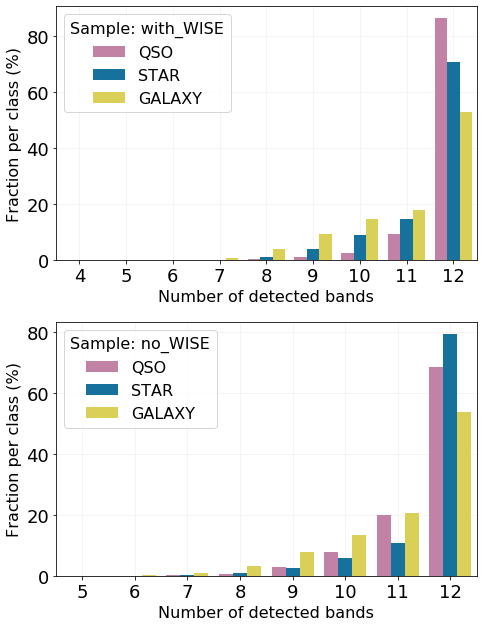

In [99]:
fig, (ax0,ax1) = plt.subplots(figsize=(7,9), nrows=2)

sns.barplot(x='nDet_iso', y= 'Prop', zorder=2, hue='target', data=prop_df, ax=ax0)
sns.barplot(x='nDet_iso', y= 'Prop', zorder=2, hue='target', data=prop_df2, ax=ax1)

ax1.set_ylabel('Fraction per class (%)')
ax1.set_xlabel('Number of detected bands')
ax0.set_ylabel('Fraction per class (%)')
ax0.set_xlabel('Number of detected bands')
ax0.legend(loc = 'upper left', title ="Sample: with_WISE")
ax1.legend(loc = 'upper left', title ="Sample: no_WISE")
ax0.grid(True, color='222222', zorder = 0)
ax1.grid(True, color='222222', zorder = 0)
plt.tight_layout()


# Uncomment to save figure
# plt.savefig(img_path+'/nDet_auto_new.png')
# plt.savefig(img_path+'/nDet_auto_new.eps', format='eps', dpi=500)

## [Figure 3]

In [100]:
def _bivariate_kdeplot(x, y, filled, fill_lowest,
                       kernel, bw, gridsize, cut, clip,
                       axlabel, cbar, cbar_ax, cbar_kws, ax, **kwargs):
    """Plot a joint KDE estimate as a bivariate contour plot."""
    """Code taken from https://stackoverflow.com/questions/33169093/how-to-label-a-seaborn-contour-plot?rq=1"""
    # Determine the clipping
    if clip is None:
        clip = [(-np.inf, np.inf), (-np.inf, np.inf)]
    elif np.ndim(clip) == 1:
        clip = [clip, clip]

    # Calculate the KDE
    if sd._has_statsmodels:
        xx, yy, z = sd._statsmodels_bivariate_kde(x, y, bw, gridsize, cut, clip)
    else:
        xx, yy, z = sd._scipy_bivariate_kde(x, y, bw, gridsize, cut, clip)

    # Plot the contours
    n_levels = kwargs.pop("n_levels", 10)
    cmap = kwargs.get("cmap", "BuGn" if filled else "BuGn_d")
    if isinstance(cmap, string_types):
        if cmap.endswith("_d"):
            pal = ["#333333"]
            pal.extend(color_palette(cmap.replace("_d", "_r"), 2))
            cmap = blend_palette(pal, as_cmap=True)
        else:
            cmap = plt.cm.get_cmap(cmap)

    kwargs["cmap"] = cmap
    contour_func = ax.contourf if filled else ax.contour
    cset = contour_func(xx, yy, z, n_levels, **kwargs)
    if filled and not fill_lowest:
        cset.collections[0].set_alpha(0)
    kwargs["n_levels"] = n_levels

    if cbar:
        cbar_kws = {} if cbar_kws is None else cbar_kws
        ax.figure.colorbar(cset, cbar_ax, ax, **cbar_kws)

    # Label the axes
    if hasattr(x, "name") and axlabel:
        ax.set_xlabel(x.name)
    if hasattr(y, "name") and axlabel:
        ax.set_ylabel(y.name)

    return ax, cset


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:93: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


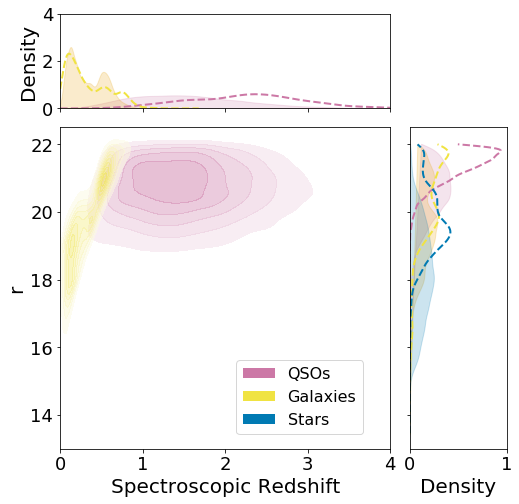

In [101]:
# Defining variables
mag_splus = "R_iso"
z_qso = "Z_1"
z_gal = "z_2"

# Start plotting...
plt.close()
sd._bivariate_kdeplot = _bivariate_kdeplot
sns.distributions._has_statsmodels = False

mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 

fig = plt.figure(figsize=(8,8))
gs = GridSpec(4,4)

# Joint countours
ax_joint = fig.add_subplot(gs[1:4,0:3])
cmap = mpl.colors.LinearSegmentedColormap.from_list("",["white",pink])
_,  cs = sns.kdeplot(data["qso_wise_filt"][z_qso],data["qso_wise_filt"][mag_splus], alpha=0.5, linestyles="--", cmap=cmap, cut=2, n_levels=6, shade=True, shade_lowest=False)
cmap = mpl.colors.LinearSegmentedColormap.from_list("",["white",yellow])
_, cs = sns.kdeplot(data["gal_wise_filt"][z_gal],data["gal_wise_filt"][mag_splus], alpha=0.5, cut=2,  shade=True,  cmap= cmap, shade_lowest=False)

# Marginal distributions - Redshift
ax_marg_x = fig.add_subplot(gs[0,0:3])
ax_marg_y = fig.add_subplot(gs[1:4,3])
bins = np.arange(np.trunc(0),np.ceil(np.max(data["qso_wise_filt"][z_qso]))+0.1,0.1)

x = np.linspace(0, np.max(data["qso_wise_filt"][z_qso]), 1000)
kde = sts.gaussian_kde(data["qso_wise_filt"][z_qso])
ax_marg_x.fill_between(x,kde.pdf(x), color=pink, alpha=0.2)

x = np.linspace(0, np.max(data["qso_filt"][z_qso]), 1000)
kde = sts.gaussian_kde(data["qso_filt"][z_qso])
ax_marg_x.plot(x, kde.pdf(x), lw=2, linestyle='--',color=pink)

x = np.linspace(0, np.max(data["gal_wise_filt"][z_gal]), 1000)
kde = sts.gaussian_kde(data["gal_wise_filt"][z_gal])
ax_marg_x.fill_between(x,kde.pdf(x), color=orange, alpha=0.2)

kde = sts.gaussian_kde(data["gal_filt"][z_gal])
ax_marg_x.plot(x, kde.pdf(x), lw=2,linestyle='--', color=yellow )

# Marginal distributions - magnitude
bins = np.arange(np.trunc(np.min(data["qso_wise_filt"][mag_splus])),np.ceil(np.max(data["qso_wise_filt"][mag_splus]))+0.25,0.25)
x = np.linspace(np.min(data["qso_wise_filt"][mag_splus]), np.max(data["qso_wise_filt"][mag_splus]), 1000)
kde = sts.gaussian_kde(data["qso_wise_filt"][mag_splus])
ax_marg_y.fill(kde.pdf(x),x, color=pink, alpha=0.2)

kde = sts.gaussian_kde(data["qso_filt"][mag_splus])
ax_marg_y.plot(kde.pdf(x),x, lw=2,linestyle='--', label='QSOs', color=pink)

x = np.linspace(np.min(data["gal_wise_filt"][mag_splus]), np.max(data["gal_wise_filt"][mag_splus]), 1000)
kde = sts.gaussian_kde(data["gal_wise_filt"][mag_splus])
ax_marg_y.fill(kde.pdf(x),x, color=orange, alpha=0.2)

kde = sts.gaussian_kde(data["gal_filt"][mag_splus])
ax_marg_y.plot(kde.pdf(x),x, lw=2,linestyle='--', label='Galaxies', color=yellow)

x = np.linspace(np.min(data["star_wise_filt"][mag_splus]), np.max(data["star_wise_filt"][mag_splus]),1000)
kde = sts.gaussian_kde(data["star_wise_filt"][mag_splus])
ax_marg_y.fill(kde.pdf(x),x, color=blue, alpha=0.2)

kde = sts.gaussian_kde(data["star_filt"][mag_splus])
ax_marg_y.plot(kde.pdf(x),x , lw=2, linestyle='--',  label='Stars', color=blue)

# Turn off tick labels on marginals

plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# Set labels on joint
ax_joint.set_xlabel('Spectroscopic Redshift', fontsize=20)
ax_joint.set_ylabel('r', fontsize=20)
ax_joint.set_ylim(13,22.5)
ax_joint.set_xlim(0,4)

ax_marg_y.set_xlim(0,1)
ax_marg_y.set_ylim(13,22.5)

ax_marg_x.set_ylim(0,4)
ax_marg_x.set_xlim(0,4)

# Set labels on marginals
ax_marg_y.set_xlabel('Density', fontsize=20)
ax_marg_x.set_ylabel('Density', fontsize=20)

# Legend
leg = ax_marg_y.legend(bbox_to_anchor=(-0.4, 0.3))

for legobj in leg.legendHandles:
    legobj.set_linewidth(10.0)
plt.tight_layout()    

# Uncomment to save figure:
# plt.savefig(img_path+'/dist_r_z_new.png')
            

## [Figure 4]

<IPython.core.display.Javascript object>


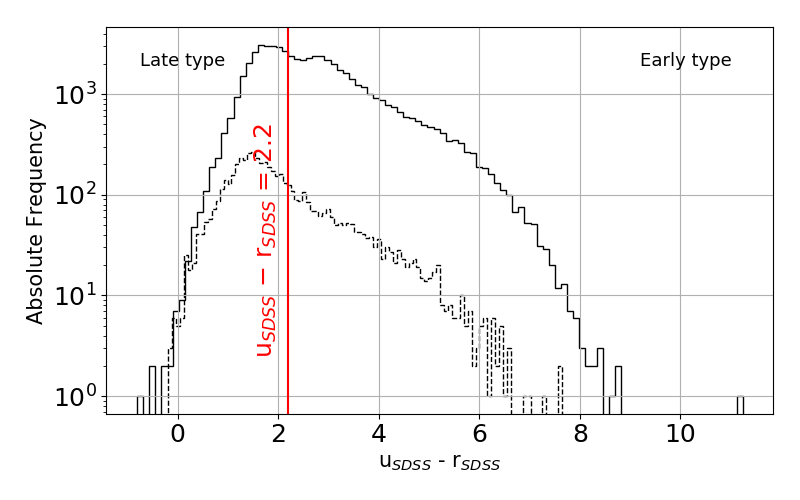

/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  import sys
/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  


In [401]:
plt.close()
plt.figure(figsize=(8,5))
cond = 'modelmag_u!=-9999 and modelmag_r!=-9999'    
plt.hist(data["gal_wise_filt"].query(cond).modelmag_u - data["gal_wise_filt"].query(cond).modelmag_r, bins=100, histtype='step', color="black")
plt.hist(data["gal_filt"].query(cond).modelmag_u - data["gal_filt"].query(cond).modelmag_r, bins=100, histtype='step', color="black", linestyle="dashed")
plt.axvline(x=2.2, color='red')
plt.annotate('Late type', (0.05,0.9), textcoords='axes fraction' , fontsize=13)
plt.annotate('Early type', (0.8,0.9), textcoords='axes fraction' , fontsize=13)
plt.annotate(r'u$_{SDSS}$ $-$ r$_{SDSS}$ = 2.2', (1.5,2), textcoords="offset points",
             color="red", xytext=(0,10), rotation = 90)
plt.yscale('log', basey=10)
plt.ylabel('Absolute Frequency', fontsize=15)
plt.xlabel(r'u$_{SDSS}$ - r$_{SDSS}$', fontsize=15)
plt.tight_layout()

# Uncomment to save figure:
# plt.savefig(img_path+'/early_late.png')
# plt.savefig(img_path+'/early_late.eps', format='eps', dpi=500)


In [404]:
print("Proportion of...")
print('Early-type galaxies (WISE):', len(data["gal_wise_filt"].query(cond)[(data["gal_wise_filt"].query(cond).modelmag_u - data["gal_wise_filt"].query(cond).modelmag_r)>2.2])/len(data["gal_wise_filt"].query(cond)))
print('Late-type galaxies (WISE):', len(data["gal_wise_filt"].query(cond)[(data["gal_wise_filt"].query(cond).modelmag_u - data["gal_wise_filt"].query(cond).modelmag_r)<=2.2])/len(data["gal_wise_filt"].query(cond)))

print('Early-type galaxies (no_WISE):', len(data["gal_filt"].query(cond)[(data["gal_filt"].query(cond).modelmag_u - data["gal_filt"].query(cond).modelmag_r)>2.2])/len(data["gal_filt"].query(cond)))
print('Late-type galaxies (no_WISE):', len(data["gal_filt"].query(cond)[(data["gal_filt"].query(cond).modelmag_u - data["gal_filt"].query(cond).modelmag_r)<=2.2])/len(data["gal_filt"].query(cond)))


Proportion of...
Early-type galaxies (WISE): 0.6068966665556629
Late-type galaxies (WISE): 0.3931033334443371
Early-type galaxies (no_WISE): 0.337295155771655
Late-type galaxies (no_WISE): 0.6627048442283451


## [Figure 5] T-SNE

In [426]:
import datashader as ds
import colorcet
# cvs = ds.Canvas(plot_width=500, plot_height = 1000)
import holoviews as hv
from holoviews.operation.datashader import datashade
from holoviews import opts, dim
import holoviews.operation.datashader as hd
from bokeh.plotting import show
hv.extension('matplotlib')


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [17]:
tsne_fig = {}

In [20]:
tsne_run  = TSNE(n_components=2, random_state=2).fit_transform(all_data[feat1]) #default is perp = 30
tsne_run = pd.DataFrame(tsne_run, columns=['first','second'])
tsne_run.index = all_data.index
tsne_fig["default"] = pd.concat([all_data,tsne_run], axis=1) 

In [428]:
hv.output(backend="bokeh")
points = hv.Points(tsne_fig["default"], kdims = ["first", "second"], vdims=["target"])
datashaded  = hd.datashade(points, aggregator=ds.count_cat('target'), color_key=['#cc77a6','#007ab2','#f0e342'])
plot_tsne = hd.dynspread(datashaded).opts(plot=dict(height=800,width=800))
plot_tsne.opts(fontscale=2, fontsize={'title': 14, 'labels': 12, 'xticks': 10, 'yticks': 10})
color_key = [(name,color) for name,color in zip(["QSO","STAR","GAL"], ['#cc77a6','#007ab2','#f0e342'])]
color_points = hv.NdOverlay({n: hv.Points([0,0], label=str(n)).opts(style=dict(color=c)) for n,c in color_key})


show(hv.render(color_points * plot_tsne))

In [22]:
tsne_run  = TSNE(n_components=2, random_state=2).fit_transform(all_data[morph+feat1])
tsne_run = pd.DataFrame(tsne_run, columns=['first','second'])
tsne_run.index = all_data.index
tsne_fig["perp_morph"] = pd.concat([all_data,tsne_run], axis=1)

In [430]:
hv.output(backend="bokeh")
points = hv.Points(tsne_fig["perp_morph"], kdims = ["first", "second"], vdims=["target"])
datashaded  = hd.datashade(points, aggregator=ds.count_cat('target'), color_key=['#cc77a6','#007ab2','#f0e342'])
plot_tsne = hd.dynspread(datashaded).opts(plot=dict(height=800,width=800))
plot_tsne.opts(fontscale=2, fontsize={'title': 14, 'labels': 12, 'xticks': 10, 'yticks': 10})
color_key = [(name,color) for name,color in zip(["QSO","STAR","GAL"], ['#cc77a6','#007ab2','#f0e342'])]
color_points = hv.NdOverlay({n: hv.Points([0,0], label=str(n)).opts(style=dict(color=c)) for n,c in color_key})
color_points * plot_tsne
show(hv.render(color_points * plot_tsne))

In [23]:
tsne_run  = TSNE(n_components=2, random_state=2).fit_transform(data_wise[morph+feat0])
tsne_run = pd.DataFrame(tsne_run, columns=['first','second'])
tsne_run.index = data_wise.index
tsne_fig["perp_morph_wise"] = pd.concat([data_wise,tsne_run], axis=1)

In [431]:
hv.output(backend="bokeh")
points = hv.Points(tsne_fig["perp_morph_wise"], kdims = ["first", "second"], vdims=["target"])
datashaded  = hd.datashade(points, aggregator=ds.count_cat('target'), color_key=['#cc77a6','#007ab2','#f0e342'])
plot_tsne = hd.dynspread(datashaded).opts(plot=dict(height=800,width=800))
plot_tsne.opts(fontscale=2, fontsize={'title': 14, 'labels': 12, 'xticks': 10, 'yticks': 10})
color_key = [(name,color) for name,color in zip(["QSO","STAR","GAL"], ['#cc77a6','#007ab2','#f0e342'])]
color_points = hv.NdOverlay({n: hv.Points([0,0], label=str(n)).opts(style=dict(color=c)) for n,c in color_key})
color_points * plot_tsne
show(hv.render(color_points * plot_tsne))

# [Section 4] Sampling

Here we create the training and testing sets for both with_WISE and no_WISE samples.  

In [464]:
# 75%/25% sampling of objetcs with WISE counterpart

X_train, X_test, y_train, y_test = train_test_split(data_wise, data_wise.target,
                                                    test_size=0.25,
                                                    random_state=2,
                                                    stratify=data_wise.target)


# 75%/25% sampling of objetcs without WISE counterpart
X_train2, X_test2, y_train2, y_test2 = train_test_split(data_nowise, data_nowise.target,
                                                        test_size=0.25,
                                                        random_state=2,
                                                        stratify=data_nowise.target)

# Join both training sets and both testing sets
full_X_train = X_train.append(X_train2, sort=False)
full_y_train = y_train.append(y_train2)

full_X_test = X_test.append(X_test2, sort=False)
full_y_test = y_test.append(y_test2)

# Stratified 5-folds
kf = StratifiedKFold(n_splits=5, random_state=2, shuffle=True) 
# kf.get_n_splits(X_train, y_train) #example

In [465]:
# Organizing indexes
X_test.reset_index(inplace=True)
y_test.index = X_test.index

full_X_test.index = np.arange(len(y_test), len(y_test)+len(full_X_test))
full_y_test.index = full_X_test.index

## Saving spectroscopic sample file

In this section we create the file that will be distributed along with the paper. If one wants to compare different models with our results, one should compare within the same cross-validation sets. Therefore, we created this file to show what objects were in the training and testing folds for each cross-validation step (cv_1, cv_2, ... cv_5). Moreover, we show what objects are in the final training and testing sample. 

- If cv_# = 1, the object was part of the training set and it is 0, otherwise. 
- If final_train = 1, the object was part of the final training set. It is 0, if it was part of the testing set.
- If wise = 1, the object has WISE counterpart with non-NULL error or signal-to-noise.




In [472]:
spec_wise_train = X_train
spec_wise_test = X_test

spec_train = X_train2
spec_test = X_test2

In [473]:
spec_wise_train = spec_wise_train.assign(cv_1 = "1")
spec_wise_train = spec_wise_train.assign(cv_2 = "1")
spec_wise_train = spec_wise_train.assign(cv_3 = "1")
spec_wise_train = spec_wise_train.assign(cv_4 = "1")
spec_wise_train = spec_wise_train.assign(cv_5 = "1")
spec_wise_train = spec_wise_train.assign(final_train = "1")
spec_wise_train = spec_wise_train.assign(wise = "1")
spec_wise_test = spec_wise_test.assign(final_train = "0")
spec_wise_test = spec_wise_test.assign(wise = "1")

spec_train = spec_train.assign(cv_1 = "1")
spec_train = spec_train.assign(cv_2 = "1")
spec_train = spec_train.assign(cv_3 = "1")
spec_train = spec_train.assign(cv_4 = "1")
spec_train = spec_train.assign(cv_5 = "1")
spec_train = spec_train.assign(final_train = "1")
spec_train = spec_train.assign(wise = "0")
spec_test = spec_test.assign(final_train = "0")
spec_test = spec_test.assign(wise = "0")

In [474]:
for [train_index, test_index],i in zip(kf.split(X_train, y_train), np.arange(1,6)):
    print("TRAIN:", train_index, "TEST:", test_index)
    spec_wise_train.iloc[test_index,-i-2]= "0"

for [train_index, test_index],i in zip(kf.split(X_train2, y_train2), np.arange(1,6)):
    print("TRAIN:", train_index, "TEST:", test_index)
    spec_train.iloc[test_index,-i-2]= "0"

TRAIN: [    0     1     2 ... 86391 86392 86393] TEST: [    5     6     7 ... 86376 86383 86385]
TRAIN: [    0     1     2 ... 86391 86392 86393] TEST: [   11    12    19 ... 86379 86380 86381]
TRAIN: [    1     2     3 ... 86390 86392 86393] TEST: [    0     4     8 ... 86387 86389 86391]
TRAIN: [    0     4     5 ... 86390 86391 86393] TEST: [    1     2     3 ... 86382 86388 86392]
TRAIN: [    0     1     2 ... 86389 86391 86392] TEST: [   14    16    33 ... 86384 86390 86393]
TRAIN: [    0     1     2 ... 17592 17593 17594] TEST: [   10    16    24 ... 17574 17584 17586]
TRAIN: [    0     1     3 ... 17592 17593 17594] TEST: [    2     6    13 ... 17587 17588 17591]
TRAIN: [    1     2     4 ... 17592 17593 17594] TEST: [    0     3     5 ... 17579 17585 17590]
TRAIN: [    0     2     3 ... 17588 17590 17591] TEST: [    1     7     8 ... 17592 17593 17594]
TRAIN: [    0     1     2 ... 17592 17593 17594] TEST: [    4     9    19 ... 17571 17580 17582]


In [475]:
spec = pd.concat([spec_wise_train, spec_wise_test, spec_train, spec_test],axis=0)

In [476]:
spec = spec[["RA","DEC"]+morph+feat0+["target","cv_1","cv_2","cv_3","cv_4","cv_5","final_train", "wise"]]

In [477]:
spec.to_csv(match_path+'/Spectroscopic_sample.csv', sep=",",index_label=False)

## [Figure 7]

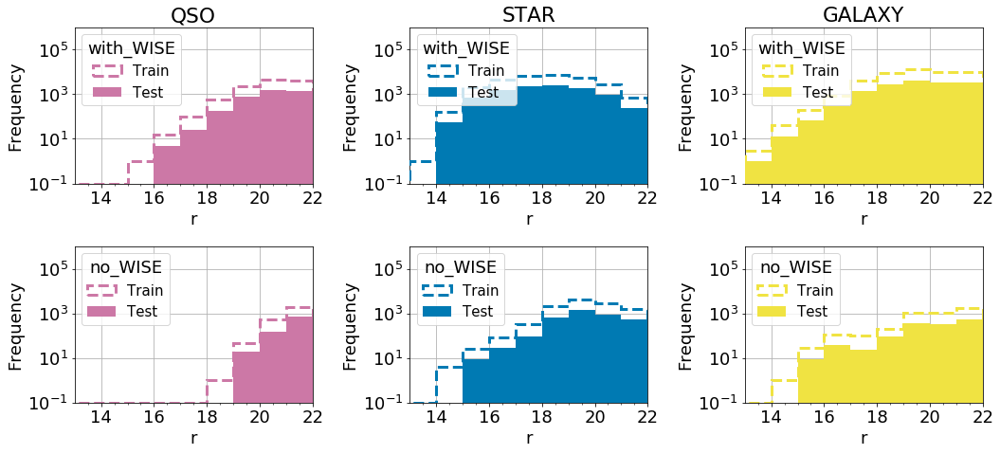

In [306]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})
fig, ax = plt.subplots(2,3, figsize=(15,7))

bins = np.arange(12,22.1,1)
log = True
density = False
ax[0,0].hist(X_train.query('target==0').R_iso, histtype="step", linewidth=3, linestyle="dashed", bins=bins,
             color=pink, log=log, density=density, label="Train", zorder=3)
ax[0,0].hist(X_test.query('target==0').R_iso, bins=bins, color=pink, log=log, density=density, label="Test", zorder=3)

ax[1,0].hist(X_train2.query('target==0').R_iso, histtype="step", linewidth=3, linestyle="dashed", bins=bins,
             color=pink, log=log, density=density, label="Train", zorder=3)
ax[1,0].hist(X_test2.query('target==0').R_iso, bins=bins, color=pink, log=log, density=density, label="Test", zorder=3)


ax[0,1].hist(X_train.query('target==1').R_iso, histtype="step", linewidth=3, linestyle="dashed", bins=bins,
             color=blue, log=log, density=density, label="Train", zorder=3)
ax[0,1].hist(X_test.query('target==1').R_iso, bins=bins, color=blue, log=log, density=density, label="Test", zorder=3)

ax[1,1].hist(X_train2.query('target==1').R_iso, histtype="step", linewidth=3, linestyle="dashed", bins=bins,
             color=blue, log=log, density=density,  label="Train", zorder=3)
ax[1,1].hist(X_test2.query('target==1').R_iso, bins=bins, color=blue, log=log, density=density, label="Test", zorder=3)


ax[0,2].hist(X_train.query('target==2').R_iso, histtype="step", linewidth=3, linestyle="dashed", bins=bins,
             color=yellow, log=log, density=density, label="Train", zorder=3)
ax[0,2].hist(X_test.query('target==2').R_iso, bins=bins, color=yellow, log=log, density=density, label="Test", zorder=3)

ax[1,2].hist(X_train2.query('target==2').R_iso, histtype="step", linewidth=3, linestyle="dashed", bins=bins,
             color=yellow, log=log, density=density, label="Train", zorder=3)
ax[1,2].hist(X_test2.query('target==2').R_iso, bins=bins, color=yellow, log=log, density=density, label="Test", zorder=3)

for j in [0,1,2]:
    if j == 0:
        title="QSO"
    elif j == 1:
        title="STAR"
    else:
        title ="GALAXY"
    for i in [0,1]:
        ax[i,j].minorticks_on()
        ax[i,j].grid(zorder=0)
        ax[i,j].set_xticks(np.arange(14,22.1,2))
        if i == 0:
            ax[i,j].set_title(title)
            leg_title = "with_WISE"
        else:
            leg_title = "no_WISE"
        ax[i,j].legend(loc="upper left", title=leg_title, prop={'size': 15}, title_fontsize=18)
        
plt.setp(ax, xlim=(13,22), ylim=(0.1,1000000) ,xlabel='r', ylabel = "Frequency")
plt.tight_layout()

# Uncomment to save figure:
# plt.savefig(img_path+'/test_dist.png')
# plt.savefig(img_path+'/test_dist.eps', format="eps", dpi=500)
plt.show()

In [432]:
print("with_wise training dataset:",len(X_train.query("target==0")), "quasars",len(X_train.query("target==1")), "stars",len(X_train.query("target==2")), "galaxies")
print("with_wise testing dataset:",len(X_test.query("target==0")), "quasars",len(X_test.query("target==1")), "stars",len(X_test.query("target==2")), "galaxies" )
print("no_wise training dataset:",len(X_train2.query("target==0")), "quasars", len(X_train2.query("target==1")), "stars", len(X_train2.query("target==2")), "galaxies")
print("no_wise testing dataset:",len(X_test2.query("target==0")), "quasars",len(X_test2.query("target==1")), "stars",len(X_test2.query("target==2")), "galaxies")

print("Total training:", len(X_train.query("target==0"))+len(X_train2.query("target==0")), "quasars", len(X_train.query("target==1"))+len(X_train2.query("target==1")), "stars", len(X_train.query("target==2"))+len(X_train2.query("target==2")), "galaxies")
print("Total testing:", len(X_test.query("target==0"))+len(X_test2.query("target==0")), "quasars", len(X_test.query("target==1"))+len(X_test2.query("target==1")), "stars", len(X_test.query("target==2"))+len(X_test2.query("target==2")), "galaxies")

with_wise training dataset: 11654 quasars 29696 stars 45044 galaxies
with_wise testing dataset: 3884 quasars 9899 stars 15015 galaxies
no_wise training dataset: 2588 quasars 10842 stars 4165 galaxies
no_wise testing dataset: 863 quasars 3614 stars 1388 galaxies
Total training: 14242 quasars 40538 stars 49209 galaxies
Total testing: 4747 quasars 13513 stars 16403 galaxies


# [Section 5] Cross validation

In [434]:
# Creating dictionary to store the cross-validation results
results={}

## [Table 3] SVM and RF results

In [573]:
for feat in list([feat1, feat0, feat3, feat2]):
    print(feat)
    print("SVM non balanced")
    clf = SVC(kernel='rbf', decision_function_shape='ovo', random_state=2) #AGORA COLOQUEI RANDOM_STATE (9 mar, tenho que rodar td de novo)
    results["SVM_"+str(len(feat))] = cross_validate(
        estimator=clf, X=X_train[feat], y=y_train, cv=kf, scoring=scoring, return_train_score=False)
    print_table_results(results["SVM_"+str(len(feat))], 'SVM')


    clf = RandomForestClassifier(
        random_state=2, n_estimators=100, bootstrap=False)
    results["RF_"+str(len(feat))] = cross_validate(
        estimator=clf, X=X_train[feat], y=y_train, cv=kf, scoring=scoring, return_train_score=False)
    print_table_results(results["RF_"+str(len(feat))], 'RF')


['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso']
SVM non balanced
\multirow{3}{*} SVM  & \multirow{3}{*}{ 210.3 $\pm$ 3.56 } & \multirow{3}{*}{ 86.25 $\pm$ 0.41 } & \multirow{3}{*}{ 76.96 $\pm$ 0.24 } & QSO & 90.89 $\pm$ 0.13 & 77.53 $\pm$ 1.17 & 83.67 $\pm$ 0.7 \\
&&&& STAR & 76.17 $\pm$ 0.39 & 61.36 $\pm$ 0.4 & 67.96 $\pm$ 0.36 \\
&&&& GAL & 73.59 $\pm$ 0.25 & 85.82 $\pm$ 0.18 & 79.24 $\pm$ 0.13 \\
\multirow{3}{*} RF  & \multirow{3}{*}{ 37.56 $\pm$ 1.91 } & \multirow{3}{*}{ 0.45 $\pm$ 0.02 } & \multirow{3}{*}{ 92.17 $\pm$ 0.3 } & QSO & 91.99 $\pm$ 0.41 & 89.31 $\pm$ 0.97 & 90.63 $\pm$ 0.52 \\
&&&& STAR & 95.55 $\pm$ 0.46 & 89.59 $\pm$ 0.44 & 92.47 $\pm$ 0.31 \\
&&&& GAL & 91.26 $\pm$ 0.41 & 95.7 $\pm$ 0.29 & 93.42 $\pm$ 0.2 \\
['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso', 'w1mpro', 'w2mpro']
SVM non balanced
\multirow{3}{

## [Table 4] 4M results and grid search

In [435]:
# morphology

# RF_12S+4M
print(feat1)
clf = RandomForestClassifier(
            random_state=2, n_estimators=100, bootstrap=False)
results["RF_"+str(4+len(feat1))]= cross_validate(
    estimator=clf, X=X_train[morph+feat1], y=y_train, cv=kf, scoring=scoring, return_train_score=False)
print_table_results(results["RF_"+str(4+len(feat1))], 'RF')

# RF_12S+2W+4M
print(feat0)
clf = RandomForestClassifier(
            random_state=2, n_estimators=100, bootstrap=False)
results["RF_"+str(4+len(feat0))] = cross_validate(
    estimator=clf, X=X_train[morph+feat0], y=y_train, cv=kf, scoring=scoring, return_train_score=False)
print_table_results(results["RF_"+str(4+len(feat0))], 'RF')
    

['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso']
\multirow{3}{*} RF  & \multirow{3}{*}{ 62.28 $\pm$ 5.01 } & \multirow{3}{*}{ 0.8 $\pm$ 0.82 } & \multirow{3}{*}{ 96.04 $\pm$ 0.1 } & QSO & 93.11 $\pm$ 0.27 & 92.29 $\pm$ 0.36 & 92.7 $\pm$ 0.27 \\
&&&& STAR & 98.45 $\pm$ 0.14 & 97.04 $\pm$ 0.08 & 97.74 $\pm$ 0.06 \\
&&&& GAL & 97.12 $\pm$ 0.14 & 98.25 $\pm$ 0.07 & 97.68 $\pm$ 0.07 \\
['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso', 'w1mpro', 'w2mpro']
\multirow{3}{*} RF  & \multirow{3}{*}{ 60.64 $\pm$ 6.12 } & \multirow{3}{*}{ 0.46 $\pm$ 0.11 } & \multirow{3}{*}{ 97.47 $\pm$ 0.12 } & QSO & 95.54 $\pm$ 0.24 & 95.45 $\pm$ 0.59 & 95.49 $\pm$ 0.29 \\
&&&& STAR & 99.32 $\pm$ 0.12 & 97.98 $\pm$ 0.04 & 98.65 $\pm$ 0.08 \\
&&&& GAL & 97.82 $\pm$ 0.12 & 98.71 $\pm$ 0.07 & 98.27 $\pm$ 0.05 \\


In [574]:
# grid search
print(feat0)
clf = RandomForestClassifier(
    random_state=2, n_estimators=300, bootstrap=False, min_samples_split = 5, min_samples_leaf=1, max_depth=30, max_features="sqrt")
results["RF_"+str(4+len(feat0))+"gs"]= cross_validate(
    estimator=clf, X=X_train[morph+feat0], y=y_train, cv=kf, scoring=scoring, return_train_score=False)
print_table_results(results["RF_"+str(4+len(feat0))+"gs"], 'RF')

print(feat1)
clf = RandomForestClassifier(
    random_state=2, n_estimators=400, bootstrap=False, min_samples_split = 5, min_samples_leaf=1, max_depth=70, max_features="sqrt")
results["RF_"+str(4+len(feat1))+"gs"] = cross_validate(
    estimator=clf, X=full_X_train[morph+feat1], y=full_y_train, cv=kf, scoring=scoring, return_train_score=False)
print_table_results(results["RF_"+str(4+len(feat1))+"gs"], 'RF')
    

['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso', 'w1mpro', 'w2mpro']
\multirow{3}{*} RF  & \multirow{3}{*}{ 150.94 $\pm$ 1.08 } & \multirow{3}{*}{ 0.78 $\pm$ 0.01 } & \multirow{3}{*}{ 97.48 $\pm$ 0.11 } & QSO & 95.58 $\pm$ 0.15 & 95.48 $\pm$ 0.47 & 95.53 $\pm$ 0.24 \\
&&&& STAR & 99.31 $\pm$ 0.11 & 97.98 $\pm$ 0.05 & 98.64 $\pm$ 0.07 \\
&&&& GAL & 97.82 $\pm$ 0.09 & 98.72 $\pm$ 0.07 & 98.27 $\pm$ 0.06 \\
['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso']
\multirow{3}{*} RF  & \multirow{3}{*}{ 255.92 $\pm$ 1.93 } & \multirow{3}{*}{ 1.64 $\pm$ 0.07 } & \multirow{3}{*}{ 91.78 $\pm$ 0.22 } & QSO & 82.65 $\pm$ 0.39 & 86.71 $\pm$ 0.92 & 84.63 $\pm$ 0.44 \\
&&&& STAR & 96.14 $\pm$ 0.14 & 92.56 $\pm$ 0.25 & 94.32 $\pm$ 0.16 \\
&&&& GAL & 95.61 $\pm$ 0.38 & 97.19 $\pm$ 0.16 & 96.39 $\pm$ 0.15 \\


In [54]:
# RF_12S+4M*
print(feat1)
clf = RandomForestClassifier(
            random_state=2, n_estimators=100, bootstrap=False)
results["RF_"+str(4+len(feat1))+"*"] = cross_validate(
    estimator=clf, X=full_X_train[morph+feat1], y=full_y_train, cv=kf, scoring=scoring, return_train_score=False)
print_table_results(results["RF_"+str(4+len(feat1))+"*"], 'RF')
    

['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso']
\multirow{3}{*} RF  & \multirow{3}{*}{ 61.17 $\pm$ 1.99 } & \multirow{3}{*}{ 91.8 $\pm$ 0.24 } & QSO & 82.58 $\pm$ 0.5 & 86.8 $\pm$ 0.85 & 84.64 $\pm$ 0.55 \\
&&& STAR & 96.15 $\pm$ 0.12 & 92.62 $\pm$ 0.25 & 94.35 $\pm$ 0.15 \\
&&& GAL & 95.68 $\pm$ 0.31 & 97.15 $\pm$ 0.15 & 96.41 $\pm$ 0.14 \\


## [Table C1] Wilcoxon tests

In [824]:
results.keys()

dict_keys(['SVM_12', 'RF_12', 'SVM_14', 'RF_14', 'SVM_5', 'RF_5', 'SVM_7', 'RF_7', 'RF_18gs', 'RF_16gs', 'RF_16', 'RF_18'])

In [436]:
clf1 = "RF_16gs"
clf2 = "RF_16"

for name in  results[clf1].keys():
    print(name)
    w, p = wilcoxon(results[clf1][name]*100, results[clf2][name]*100, mode="exact", alternative="greater")
    
    print(w,p)

## [Section 5.4] Grid Search

In [27]:
n_estimators = np.arange(100,410,100)
max_features = ['sqrt', 5, 10, 15]
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5]
min_samples_split.append(None)
min_samples_leaf = [1, 2]
min_samples_leaf.append(None)
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=2, n_jobs = -1)
rf_random.fit(X_train[feat0+morph], y=y_train)

print(feat0)
print(rf_random.best_params_)

rf_random.fit(full_X_train[feat1+morph], y=full_y_train)

print(feat1)
print(rf_random.best_params_)

{'n_estimators': array([100, 200, 300, 400]), 'max_features': ['sqrt', 5, 10, 15], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, None], 'min_samples_leaf': [1, 2, None], 'bootstrap': [True, False]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [       nan 0.97995231        nan 0.97910735        nan 0.97799616
        nan        nan 0.97938514        nan        nan        nan
        nan        nan 0.97312313        nan 0.97950089        nan
 0.97999861        nan 0.97892215        nan 0.978899          nan
        nan        nan 0.97468574 0.97851703        nan 0.97974396
        nan 0.97895687 0.97455842        nan        nan 0.97856333
 0.97922309 0.97535708        nan 0.97906105        nan        nan
        nan 0.97990601        nan        nan        nan 0.97902632
        nan 0.97902632        nan 0.97945459        nan        nan
        nan        nan 0.97865593 0.97517189        nan        nan
        nan 0.97983656        nan        nan        nan        nan
 0.97975554 0.97805403 0.97979026        nan        nan 0.97975554
        nan        nan        nan        nan        nan 0

['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso', 'w1mpro', 'w2mpro']
{'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': False}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.7/site-packages/sklearn/model_selection/_search.py:921: UserWarning: One or more of the test scores are non-finite: [       nan 0.90506688        nan 0.90310514        nan 0.90340324
        nan        nan 0.90458606        nan        nan        nan
        nan        nan 0.89974901        nan 0.90442258        nan
 0.90486494        nan 0.90306667        nan 0.9037879         nan
        nan        nan 0.89849888 0.90350902        nan 0.90448028
        nan 0.90323977 0.90019137        nan        nan 0.90324938
 0.90361481 0.89922973        nan 0.90323015        nan        nan
        nan 0.90468223        nan        nan        nan 0.90289358
        nan 0.90328785        nan 0.90353787        nan        nan
        nan        nan 0.90330708 0.89923934        nan        nan
        nan 0.90453798        nan        nan        nan        nan
 0.90464376 0.9030282  0.90451875        nan        nan 0.9044322
        nan        nan        nan        nan        nan 0.

['U_iso', 'F378_iso', 'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso', 'F660_iso', 'I_iso', 'F861_iso', 'Z_iso']
{'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 70, 'bootstrap': False}


# [Section 6] Final performance

In [466]:
# Training models 
print(r"- Model RF_12S+4M$\oplus$")
init_time = time.time()
clf_nowise = RandomForestClassifier(
            random_state=2, n_estimators=100, bootstrap=False)
clf_nowise.fit(full_X_train[morph+feat1], full_y_train)
end_time = time.time()
print("Trained in:", np.round(end_time-init_time,2), "seconds.")

print(r"- Model RF_12S+2W+4M")
init_time = time.time()
clf_wise = RandomForestClassifier(
            random_state=2, n_estimators=100, bootstrap=False)
clf_wise.fit(X_train[morph+feat0], y_train)
end_time = time.time()
print("Trained in:", np.round(end_time-init_time,2), "seconds.")

- Model RF_12S+4M$\oplus$
Trained in: 87.72 seconds.
- Model RF_12S+2W+4M
Trained in: 59.13 seconds.


## [Figure 9] Feature importances

<IPython.core.display.Javascript object>


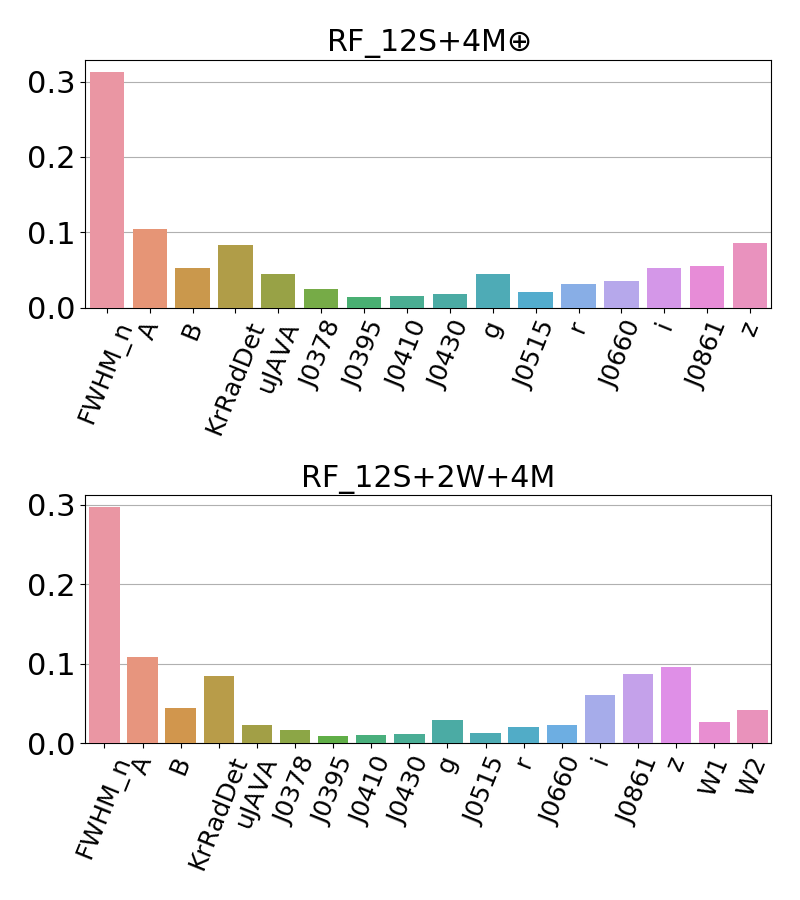

In [456]:
%matplotlib notebook
plt.close()
fig, [ax1,ax2] = plt.subplots(2,1, figsize=(8,9))
feat_n1 = ['FWHM_n', 'A', 'B', 'KrRadDet', 'uJAVA', 'J0378','J0395','J0410','J0430','g','J0515','r','J0660','i','J0861','z' ]
plot=sns.barplot(x=feat_n1, y=clf_nowise.feature_importances_, ax=ax1, zorder=3)
plot.set_xticklabels(ax1.get_xticklabels(), rotation=68)
ax1.set_title(r"RF_12S+4M$\oplus$")
feat_n1 = ['FWHM_n', 'A', 'B', 'KrRadDet', 'uJAVA', 'J0378','J0395','J0410','J0430',
           'g','J0515','r','J0660','i','J0861','z','W1','W2']

plot=sns.barplot(x=feat_n1, y=clf_wise.feature_importances_, ax=ax2, zorder=3)
plot.set_xticklabels(ax2.get_xticklabels(), rotation=68)
ax2.set_title(r"RF_12S+2W+4M")

ax1.yaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)

plt.tight_layout()
ax1.grid(zorder=0,axis='y')
ax2.grid(zorder=0,axis='y')

# Uncomment to save figure:
# plt.savefig(img_path+'/feat_importance.png')
# plt.savefig(img_path+'/feat_importance.eps', format='eps', dpi=300)

In [337]:
print("Testing set sizes")
print("N(with_WISE):", len(y_test))
print(y_test.target_test.value_counts())
print("N(no_WISE):", len(y_test2))
print(y_test2.target_test.value_counts())
print("N(with_WISE+no_WISE):", len(full_y_test))
print(full_y_test.target_test.value_counts())

Testing set sizes
N(with_WISE): 28798
2    15015
1     9899
0     3884
Name: target_test, dtype: int64
N(no_WISE): 5865
1    3614
2    1388
0     863
Name: target_test, dtype: int64
N(with_WISE+no_WISE): 34663
2    16403
1    13513
0     4747
Name: target_test, dtype: int64


In [462]:
init_time = time.time()
y_hat = clf_nowise.predict(X_test2[morph+feat1])
print(time.time() - init_time)
print(metrics.classification_report(y_test2, y_hat))
y_pred = pd.DataFrame(y_hat, columns=['target_pred'])
y_test2 = pd.DataFrame(y_test2)
y_test2.columns=['target_test']
y_test2.index = X_test2.index
y_pred.index = y_test2.index
print_stats(y_test2,y_pred)

final_y = y_test2[y_test2['target_test']==1]
final_ypred = y_pred.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
print('# Estrelas que estão sendo classificados erroneamente como quasares:',len(ids))


init_time=time.time()
y_hat = clf_nowise.predict(X_test[morph+feat1])
print(time.time() - init_time)
print(metrics.classification_report(y_test, y_hat))
y_pred = pd.DataFrame(y_hat, columns=['target_pred'])
y_test = pd.DataFrame(y_test)
y_test.columns=['target_test']
y_test.index = X_test.index
y_pred.index = y_test.index
print_stats(y_test,y_pred)

init_time = time.time()
y_hat = clf_nowise.predict(full_X_test[morph+feat1])
print(time.time() - init_time)
print(metrics.classification_report(full_y_test, y_hat))
y_pred = pd.DataFrame(y_hat, columns=['target_pred'])
full_y_test = pd.DataFrame(full_y_test)
full_y_test.columns=['target_test']
full_y_test.index = full_X_test.index
y_pred.index = full_y_test.index
print_stats(full_y_test,y_pred)

0.7812168598175049
              precision    recall  f1-score   support

           0       0.53      0.92      0.67       863
           1       0.98      0.79      0.88      3614
           2       0.82      0.85      0.84      1388

    accuracy                           0.83      5865
   macro avg       0.78      0.85      0.79      5865
weighted avg       0.88      0.83      0.84      5865

accuracy: 0.8251
P_QSO:  [0.529]
R_QSO:  [0.9189]
F1_QSO:  [0.6715]
P_STAR:  [0.9801]
R_STAR:  [0.7916]
F1_STAR:  [0.8759]
P_GAL:  [0.8189]
R_GAL:  [0.8537]
F1_GAL:  [0.836]
F:  0.7944
# of QSOs misclassifications: 706
# of QSOs being misclassified: 70
# of QSOs being misclassified as stars: 26
# of QSOs being misclassified as galaxies: 44
# of galaxies misclassifications: 262
# of galaxies being misclassified: 203
# of galaxies being misclassified as stars: 32
# of galaxies being misclassified as quasars: 171
# of star misclassifications: 58
# of stars being misclassified: 753
# of stars bein

AssertionError: There is something wrong with the dataframe indexes. Check if there is no duplicate index.

In [357]:
((13513-976)+(16403-475))/(13513+16403)

0.9514975264072737

## RF_12S+2W+4M tested on with_WISE

In [91]:
init_time = time.time()
y_hat = clf_wise.predict(X_test[morph+feat0])
print("Prediction time:", time.time() - init_time, 'seconds.')
print(metrics.classification_report(y_test, y_hat))
y_pred = pd.DataFrame(y_hat, columns=['target_pred'])
y_test = pd.DataFrame(y_test)
y_test.columns=['target_test']
y_test.index = X_test.index
y_pred.index = y_test.index
print_stats(y_test,y_pred)

Prediction time: 0.5902450084686279 seconds.
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3884
           1       0.99      0.98      0.99      9899
           2       0.98      0.99      0.98     15015

    accuracy                           0.98     28798
   macro avg       0.98      0.98      0.98     28798
weighted avg       0.98      0.98      0.98     28798

accuracy: 0.9821
P_QSO:  [0.9576]
R_QSO:  [0.9588]
F1_QSO:  [0.9582]
P_STAR:  [0.9944]
R_STAR:  [0.9822]
F1_STAR:  [0.9883]
P_GAL:  [0.9804]
R_GAL:  [0.988]
F1_GAL:  [0.9842]
F:  0.9769
# of QSOs misclassifications: 165 165
# of QSOs being misclassified: 160
# of QSOs being misclassified as stars: 13
# of QSOs being misclassified as galaxies: 147
# of galaxies misclassifications: 296
# of galaxies being misclassified: 180
# of galaxies being misclassified as stars: 42
# of galaxies being misclassified as quasars: 138
# of star misclassifications: 55
# of stars being m

In [353]:
# Star/galaxy accuracy
((9899-55)+(15015-296))/(9899+15015)

0.9859115356827487

## RF_12S+4Mplus tested on with_WISE+no_WISE

In [92]:
init_time = time.time()
y_hat = clf_nowise.predict(full_X_test[morph+feat1])
print("Prediction time:", time.time() - init_time, 'seconds.')
print(metrics.classification_report(full_y_test, y_hat))
full_y_pred = pd.DataFrame(y_hat, columns=['target_pred'])
full_y_test = pd.DataFrame(full_y_test)
full_y_test.columns=['target_test']
full_y_test.index = full_X_test.index
full_y_pred.index = full_y_test.index
print_stats(full_y_test,full_y_pred)

Prediction time: 2.4974420070648193 seconds.
              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4747
           1       0.96      0.93      0.94     13513
           2       0.96      0.97      0.96     16403

    accuracy                           0.94     34663
   macro avg       0.92      0.92      0.92     34663
weighted avg       0.94      0.94      0.94     34663

accuracy: 0.9406
P_QSO:  [0.826]
R_QSO:  [0.8721]
F1_QSO:  [0.8484]
P_STAR:  [0.9616]
R_STAR:  [0.9278]
F1_STAR:  [0.9444]
P_GAL:  [0.9587]
R_GAL:  [0.971]
F1_GAL:  [0.9648]
F:  0.9192
# of QSOs misclassifications: 872 872
# of QSOs being misclassified: 607
# of QSOs being misclassified as stars: 323
# of QSOs being misclassified as galaxies: 284
# of galaxies misclassifications: 686
# of galaxies being misclassified: 475
# of galaxies being misclassified as stars: 177
# of galaxies being misclassified as quasars: 298
# of star misclassifications: 500
# of stars being

In [93]:
init_time = time.time()
y_hat = clf_nowise.predict(X_test2[morph+feat1])
print("Prediction time:", time.time() - init_time, 'seconds.')
print(metrics.classification_report(y_test2, y_hat))
y_pred2 = pd.DataFrame(y_hat, columns=['target_pred'])
y_test2 = pd.DataFrame(y_test2)
y_test2.columns=['target_test']
y_test2.index = X_test2.index
y_pred2.index = y_test2.index
print_stats(y_test2,y_pred2)

Prediction time: 0.17162394523620605 seconds.
              precision    recall  f1-score   support

           0       0.52      0.92      0.67       863
           1       0.98      0.79      0.87      3614
           2       0.81      0.85      0.83      1388

    accuracy                           0.82      5865
   macro avg       0.77      0.85      0.79      5865
weighted avg       0.87      0.82      0.83      5865

accuracy: 0.8218
P_QSO:  [0.5247]
R_QSO:  [0.9224]
F1_QSO:  [0.6689]
P_STAR:  [0.9817]
R_STAR:  [0.7856]
F1_STAR:  [0.8727]
P_GAL:  [0.8139]
R_GAL:  [0.8537]
F1_GAL:  [0.8333]
F:  0.7917
# of QSOs misclassifications: 721 721
# of QSOs being misclassified: 67
# of QSOs being misclassified as stars: 25
# of QSOs being misclassified as galaxies: 42
# of galaxies misclassifications: 271
# of galaxies being misclassified: 203
# of galaxies being misclassified as stars: 28
# of galaxies being misclassified as quasars: 175
# of star misclassifications: 53
# of stars being m

## Investigating sources that are being misclassified

# of QSOs being misclassified: 67
# of QSOs being misclassified: 160


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


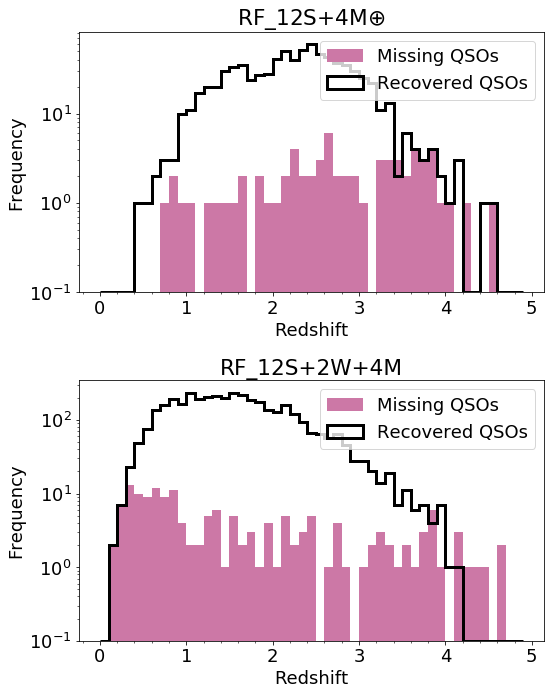

In [110]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})
fig, [ax1,ax2] = plt.subplots(2,1, figsize=(8,10))
final_y = y_test2[y_test2['target_test']==0]
final_ypred = y_pred2.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]!=0].index].index
print('# of QSOs being misclassified:',len(ids))
ax1.hist(X_test2.loc[ids].Z_1, bins=np.arange(0.,5,0.1), alpha=1, label="Missing QSOs", log=True)
ax1.minorticks_on()
ax2.minorticks_on()
ax1.set_xlabel('Redshift')
ax1.set_ylabel('Frequency')
ax2.set_xlabel('Redshift')
ax2.set_ylabel('Frequency')

final_y = y_test2[y_test2['target_test']==0]
final_ypred = y_pred2.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
ax1.hist(X_test2.loc[ids].Z_1, bins=np.arange(0.,5,0.1), histtype="step", color="black", linewidth=3, label="Recovered QSOs", log=True)

#"---"
final_y = y_test[y_test['target_test']==0]
final_ypred = y_pred.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]!=0].index].index
print('# of QSOs being misclassified:',len(ids))
ax2.hist(X_test.loc[ids].Z_1, bins=np.arange(0.,5,0.1), alpha=1, label="Missing QSOs", log=True)


final_y = y_test[y_test['target_test']==0]
final_ypred = y_pred.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
ax2.hist(X_test.loc[ids].Z_1, bins=np.arange(0.,5,0.1), histtype="step", color="black", linewidth=3, label="Recovered QSOs", log=True)

ax1.legend()
ax2.legend()
ax1.set_title(r"RF_12S+4M$\oplus$")
ax2.set_title(r"RF_12S+2W+4M")
plt.tight_layout()

# Uncomment to save figure:
# plt.savefig(img_path+'/qso_bias.png')
# plt.savefig(img_path+'/qso_bias.eps', format="eps", dpi=500)

In [317]:
# Star types that are being classified as quasars by RF_12S+4M*

final_y = y_test2[y_test2['target_test']==1]
final_ypred = y_pred2.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index

pd.set_option('display.max_rows', None)

X_test2.loc[ids].subClass.str.get(0).value_counts(normalize=True)*100

F    31.135531
A    21.062271
G    11.721612
W     8.974359
K     7.692308
C     5.860806
B     4.029304
L     2.930403
T     2.747253
M     2.380952
s     1.282051
O     0.183150
Name: subClass, dtype: float64

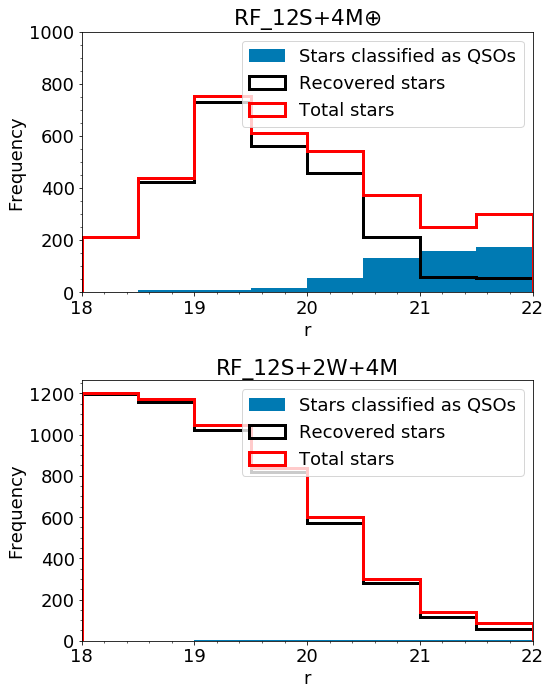

In [174]:
%matplotlib inline
plt.close()
plt.rcParams.update({'font.size': 18})
fig, [ax1,ax2] = plt.subplots(2,1, figsize=(8,10))

final_y = y_test2[y_test2['target_test']==1]
final_ypred = y_pred2.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
ax1.hist(X_test2.loc[ids].R_iso,bins=np.arange(18,22.1,0.5), color= blue, label="Stars classified as QSOs")

final_y = y_test2[y_test2['target_test']==1]
final_ypred = y_pred2.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==1].index].index

ax1.hist(X_test2.loc[ids].R_iso, bins=np.arange(18,22.1,0.5), histtype="step", color="black", linewidth=3, label="Recovered stars")
ax1.hist(X_test2.query('target==1').R_iso, bins=np.arange(18,22.1,0.5), histtype="step", color="red", linewidth=3, label="Total stars")

#-----#
final_y = y_test[y_test['target_test']==1]
final_ypred = y_pred.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==0].index].index
ax2.hist(X_test.loc[ids].R_iso,bins=np.arange(18,22.1,0.5), color= blue, label="Stars classified as QSOs")

final_y = y_test[y_test['target_test']==1]
final_ypred = y_pred.loc[final_y.index]
ids = final_y.loc[final_ypred[final_ypred.iloc[:,0]==1].index].index

ax2.hist(X_test.loc[ids].R_iso, bins=np.arange(18,22.1,0.5), histtype="step", color="black", linewidth=3, label="Recovered stars")
ax2.hist(X_test.query('target==1').R_iso, bins=np.arange(18,22.1,0.5), histtype="step", color="red", linewidth=3, label="Total stars")


ax1.set_xlim(18,22)
ax2.set_xlim(18,22)
ax1.set_ylim(0,1000)
ax1.set_xlabel('r')
ax1.set_ylabel('Frequency')
ax2.set_xlabel('r')
ax2.set_ylabel('Frequency')
ax1.set_title(r'RF_12S+4M$\oplus$')
ax2.set_title('RF_12S+2W+4M')
ax1.legend()
ax2.legend()
ax1.minorticks_on()
ax2.minorticks_on()
ax1.set_xticks(np.arange(18,22.1,1))
ax2.set_xticks(np.arange(18,22.1,1))
plt.tight_layout()

# Uncomment to save figure:
# plt.savefig(img_path+'/missing_stars.png')
# plt.savefig(img_path+'/missing_stars.eps', format="eps", dpi=500)

In [626]:
res = pd.concat([y_test, full_y_pred.head(len(y_test)).iloc[y_pred.index].reset_index()['target_pred'], y_pred], axis=1)
res.columns = ['target_test','target_pred_full', 'target_pred']


# Number of equally labelled sources
print("# of equally labelled sources from both classifiers:",  len(res.query('target_pred_full==target_pred')), '(',
      np.round(len(res.query('target_pred_full==target_pred'))/len(res)*100,2), '%)')

# Quantities for each class
a = len(res.query('target_pred_full==target_pred and target_pred == target_test and target_test == 0'))/len(res.query('target_test==0'))
print('QSO:',len(res.query('target_test==0')), '(',np.round(a*100,2), '%)')
a = len(res.query('target_pred_full==target_pred and target_pred == target_test and target_test == 1'))/len(res.query('target_test==1'))
print('STAR:',len(res.query('target_test==1')), '(', np.round(a*100,2), '%)')
a = len(res.query('target_pred_full==target_pred and target_pred == target_test and target_test == 2'))/len(res.query('target_test==2'))
print('GAL:', len(res.query('target_test==2')), '(', np.round(a*100,2), '%)')

# Number of equally and correctly labelled sources
a = np.round(len(res.query('target_pred_full==target_pred and target_pred == target_test'))/len(res.query('target_pred_full==target_pred'))*100,2)
print("# of equally and correctly labelled sources from both classifiers:",len(res.query('target_pred_full==target_pred and target_pred == target_test')),'(', a, '%)')


# Only RF_12S+2W+4M gave the right classification:
print('# of sources correctly classified by RF_12S+2W+4M only',len(res.query('target_pred_full!=target_pred and target_pred == target_test')), '(',
      np.round(len(res.query('target_pred_full!=target_pred and target_pred == target_test'))/len(res.query('target_pred_full!=target_pred'))*100,2), '%)')

# Only RF_12S+4M gave the right classification:
print('# of sources correctly classified by RF_12S+4M only',len(res.query('target_pred_full!=target_pred and target_pred_full == target_test')), '(',
      np.round(len(res.query('target_pred_full!=target_pred and target_pred_full == target_test'))/len(res.query('target_pred_full!=target_pred'))*100,2), '%)')

# Both classifiers got it wrong
print("# of sources that were misclassified by both models:", len(res.query('target_pred_full!=target_test and target_pred != target_test')), '(',
      np.round(len(res.query('target_pred_full!=target_test and target_pred != target_test'))/len(res)*100,2), ')%')
res.query('target_pred_full!=target_test and target_pred != target_test').target_test.value_counts()

# of equally labelled sources from both classifiers: 28149 ( 97.75 %)
QSO: 3884 ( 85.94 %)
STAR: 9899 ( 97.73 %)
GAL: 15015 ( 98.0 %)
# of equally and correctly labelled sources from both classifiers: 27727 ( 98.5 %)
# of sources correctly classified by RF_12S+2W+4M only 555 ( 85.52 %)
# of sources correctly classified by RF_12S+4M only 58 ( 8.94 %)
# of sources that were misclassified by both models: 458 ( 1.59 )%


0    154
2    152
1    152
Name: target_test, dtype: int64

In [95]:
r_mag = [16,17,18,19,20,21,22]

In [151]:
# This function is entirely hard-coded

def plot_value_labels(axis,x=-10, y=2, rotation = 45, color="black", lower=False):
    # Code modified from https://stackoverflow.com/questions/28931224/adding-value-labels-on-a-matplotlib-bar-chart
    rects = axis.patches

    # For each bar: Place a label
    for rect in rects:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        label = '{:.0f}'.format(y_value)

        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'
            
        if y_value<1000 or lower==False:
            y = 2
            if lower==True:
                x = -12
        else:
            y=-15

        if y_value > 1000:
            if lower:
                x = -9
            else:
                x=10
                
        if y_value == 901: #hard-coded
            y = 14
        if y_value==857:
            y = 5
        if y_value == 174:
            y = 10
            
        # Create annotation
        axis.annotate(label, (x_value, y_value), 
                      xytext=(x, y), 
                      textcoords="offset points", 
                      ha='center', 
                      rotation=rotation, 
                      va=va,
                      size=11, color=color,zorder=10000000000)  
        

<IPython.core.display.Javascript object>


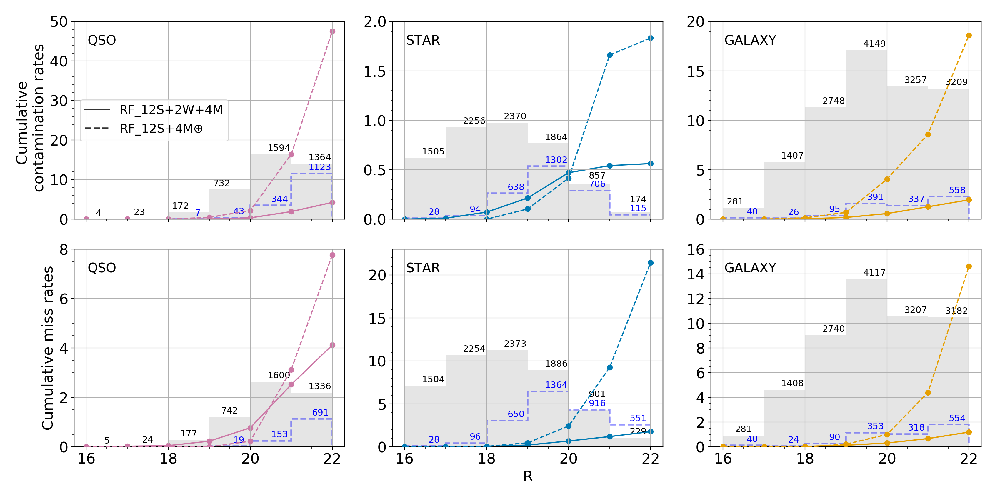

CONTAMINATION
CLF WISE
[16, 17, 18, 19, 20, 21, 22]
QSO
[0.         0.         0.         0.0514271  0.33427616 1.92851633
 4.24273592]
STAR
[0.         0.01022704 0.07158928 0.21476785 0.47044385 0.54203314
 0.56248722]
GAL
[0.         0.         0.03304474 0.17844161 0.56836957 1.25570022
 1.95624876]
CLF SPLUS
[16, 17, 18, 19, 20, 21, 22]
QSO
[ 0.          0.          0.          0.46143705  2.17534608 16.41397495
 47.52801582]
STAR
[0.         0.         0.         0.10373444 0.41493776 1.65975104
 1.83264177]
GAL
[0.         0.         0.01373626 0.06868132 0.40521978 0.85851648
 1.86126374]
FNR
CLF WISE
[16, 17, 18, 19, 20, 21, 22]
QSO
[0.         0.02574665 0.05149331 0.23171988 0.77239959 2.52317199
 4.11946447]
STAR
[0.         0.         0.04040812 0.21214264 0.68693807 1.20214163
 1.77795737]
GAL
[0.         0.         0.03996004 0.13320013 0.31302031 0.67266067
 1.1988012 ]
FNR
CLF SPLUS
[16, 17, 18, 19, 20, 21, 22]
QSO
[0.         0.         0.         0.         0.2317497

/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/ipykernel_launcher.py:149: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.


In [158]:
plt.close()
plt.rcParams['axes.grid'] = True
fig,ax  = plt.subplots(nrows = 2, ncols = 3, figsize=(17,8.5), sharex=True)

cont_qso, cont_star, cont_gal, n_qso_class, n_star_class, n_gal_class = calc_contamination(y_pred, y_test, X_test)

ax[0,0].plot(r_mag,np.array(cont_qso)/n_qso_class*100,linestyle='-',marker='o',label='QSO (clf_sw)', color=pink,zorder=0)
ax[0,1].plot(r_mag,np.array(cont_star)/n_star_class*100,linestyle='-',marker='o',label='STAR (clf_sw)', color=blue,zorder=0)
ax[0,2].plot(r_mag,np.array(cont_gal)/n_gal_class*100,linestyle='-',marker='o',label='GALAXY (clf_sw)', color=orange,zorder=0)
print("CONTAMINATION")
print("CLF WISE")
print(r_mag)
print("QSO")
print(np.array(cont_qso)/n_qso_class*100)
print("STAR")
print(np.array(cont_star)/n_star_class*100)
print("GAL")
print(np.array(cont_gal)/n_gal_class*100)
cont_qso, cont_star, cont_gal, n_qso_class, n_star_class, n_gal_class = calc_contamination(y_pred2,y_test2, X_test2)

ax[0,0].plot(r_mag,np.array(cont_qso)/n_qso_class*100,linestyle='--',marker='o',label='QSO (clf_s)',color=pink ,zorder=0)
ax[0,1].plot(r_mag,np.array(cont_star)/n_star_class*100,linestyle='--',marker='o',label='STAR (clf_s)',color=blue,zorder=0)
ax[0,2].plot(r_mag,np.array(cont_gal)/n_gal_class*100,linestyle='--',marker='o',label='GALAXY (clf_s)', color=orange,zorder=0)
print("CLF SPLUS")
print(r_mag)
print("QSO")
print(np.array(cont_qso)/n_qso_class*100)
print("STAR")
print(np.array(cont_star)/n_star_class*100)
print("GAL")
print(np.array(cont_gal)/n_gal_class*10)

# x=-0.1
x=0
ax[1,2].set_ylim(x,16)
ax[0,2].set_ylim(x,20)
# ax[0,1].set_ylim(x+0.1,2)
ax[0,1].set_ylim(x,2)
ax[1,1].set_ylim(x,23)
# ax[0,0].set_ylim(x-0.2,50)
ax[0,0].set_ylim(x,50)
ax[1,0].set_ylim(x,8)
ax[1,2].set_yticks(np.arange(0,16.1,2))

for i in np.arange(0,3):
    ax2 = ax[0,i].twinx()
    ax2.hist(X_test.loc[y_pred[y_pred['target_pred']==i].index].R_iso, bins=r_mag, color='silver', zorder=1, alpha=0.4)    
    ax2.set_ylim(4,4850)
    ax2.patch.set_visible(False)
    plot_value_labels(ax2, y=-10, rotation=0, lower=False)
    
for i in np.arange(0,3):
    ax2 = ax[0,i].twinx()
    ax2.hist(X_test2.loc[y_pred2[y_pred2['target_pred']==i].index].R_iso, bins=r_mag,
              zorder=14, alpha=0)    
    ax2.set_ylim(4,4850)
    ax2.axes.get_yaxis().set_visible(False)
    plot_value_labels(ax2,x=11, y=2, color="blue", rotation=0)
    ax2.hist(X_test2.loc[y_pred2[y_pred2['target_pred']==i].index].R_iso, bins=r_mag,
              zorder=1, alpha=0.4, color="blue", histtype='step', linestyle='dashed', linewidth=2)  
    
    
for i in np.arange(0,3):
    ax2 = ax[1,i].twinx()
    ax2.hist(X_test[X_test['target']==i].R_iso, bins=r_mag, color='silver', zorder=1, alpha=0.4)
    ax2.set_ylim(4,4850)
    ax2.axes.get_yaxis().set_visible(False)
    plot_value_labels(ax2, x=0, y=2, rotation=0, lower=False)

for i in np.arange(0,3):
    ax2 = ax[1,i].twinx()
    ax2.hist(X_test2[X_test2['target']==i].R_iso, bins=r_mag, zorder=14, alpha=0)
    ax2.set_ylim(4,4850)
    ax2.axes.get_yaxis().set_visible(False)
    plot_value_labels(ax2,x=11, y=2, color="blue", rotation=0)
    ax2.hist(X_test2[X_test2['target']==i].R_iso, bins=r_mag,
              zorder=1, alpha=0.4, color="blue", histtype='step', linestyle='dashed', linewidth=2)  
    
mis_qso, mis_star, mis_gal, n_qso_test, n_star_test, n_gal_test = calc_fnr(y_pred, y_test, X_test)

ax[1,0].plot(r_mag,np.array(mis_qso)/n_qso_test*100,linestyle='-',marker='o', label='QSO (clf_sw)', color=pink, zorder=0, alpha=1)
ax[1,1].plot(r_mag,np.array(mis_star)/n_star_test*100,linestyle='-',marker='o',label='STAR (clf_sw)', color=blue, zorder=0)
ax[1,2].plot(r_mag,np.array(mis_gal)/n_gal_test*100,linestyle='-',marker='o',label='GALAXY (clf_sw)', color=orange, zorder=0)

print("FNR")
print("CLF WISE")
print(r_mag)
print("QSO")
print(np.array(mis_qso)/n_qso_test*100)
print("STAR")
print(np.array(mis_star)/n_star_test*100)
print("GAL")
print(np.array(mis_gal)/n_gal_test*100)

cont_qso, cont_star, cont_gal, n_qso_class, n_star_class, n_gal_class = calc_fnr(y_pred2, y_test2, X_test2)

ax[1,0].plot(r_mag,np.array(cont_qso)/n_qso_class*100,linestyle='--',marker='o',label='QSO (clf_s)', color=pink, zorder=17)
ax[1,1].plot(r_mag,np.array(cont_star)/n_star_class*100,linestyle='--',marker='o',label='STAR (clf_s)', color=blue, zorder=17)
ax[1,2].plot(r_mag,np.array(cont_gal)/n_gal_class*100,linestyle='--',marker='o',label='GALAXY (clf_s)', color=orange, zorder=17)

print("FNR")
print("CLF SPLUS")
print(r_mag)
print("QSO")
print(np.array(cont_qso)/n_qso_class*100)
print("STAR")
print(np.array(cont_star)/n_star_class*100)
print("GAL")
print(np.array(cont_gal)/n_gal_class*100)

for j in np.arange(0,3):
    for i in np.arange(0,2):
        ax[i,j].set_zorder(ax2.get_zorder()+1)
        ax[i,j].patch.set_visible(False)

for i in np.arange(0,2):
    for j in np.arange(0,3):
        if j == 0:
            ax[i,j].text(0.05, 0.9, 'QSO', horizontalalignment='left', 
                         verticalalignment='center', transform=ax[i,j].transAxes, fontsize=16)
        elif j == 1:
            ax[i,j].text(0.05, 0.9, 'STAR', horizontalalignment='left', 
                         verticalalignment='center', transform=ax[i,j].transAxes, fontsize=16)
        else:
            ax[i,j].text(0.05, 0.9, 'GALAXY', horizontalalignment='left', 
                         verticalalignment='center', transform=ax[i,j].transAxes, fontsize=16) 
ax[1,1].set_xlabel('R')
ax[0,0].set_ylabel('Cumulative \n contamination rates')
ax[1,0].set_ylabel('Cumulative miss rates')
plt.tight_layout()

line1 = mlines.Line2D([], [], color='#333333', linewidth=2,
                      markersize=15, label='(ii-b*)')
line2 = mlines.Line2D([], [], color='#333333', linestyle='--', linewidth=2,
                      markersize=15, label='(i-b*)')

ax[0,0].legend(ax, handles=[line1,line2], labels=['RF_12S+2W+4M', r'RF_12S+4M$\oplus$'], loc='center left', frameon=True, fontsize=15)

for j in np.arange(0,3):
    for i in np.arange(0,2):
        ax[i][j].minorticks_on()


# Uncomment to save figure:
# plt.savefig(img_path+'/mis_cont_rate_new.png')
# plt.savefig(img_path+'/mis_cont_rate.eps',  format='eps', dpi=500)

## [Figure 12]

<IPython.core.display.Javascript object>


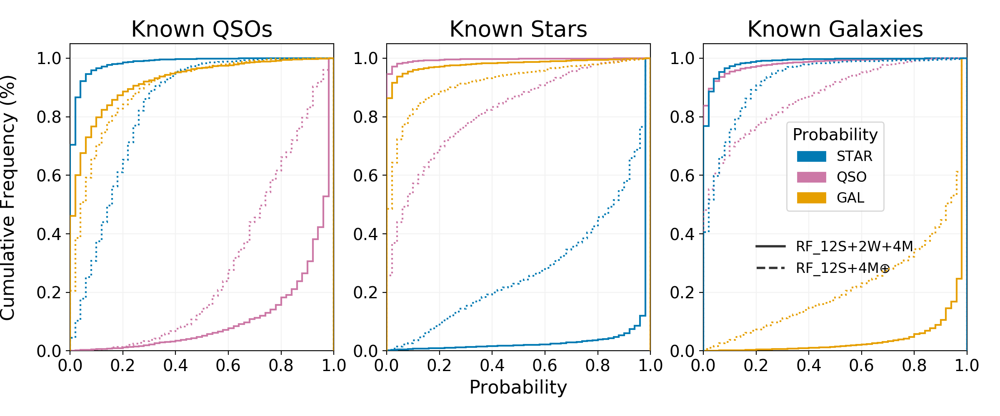

In [568]:
plt.close()
fig, ax = plt.subplots(1,3, figsize=(12,5), sharex=True)

WISE=False
stat = True
targ = [0, 1, 2]
bin= np.arange(0,1.02,0.02)
for t in targ:
    prob = clf_wise.predict_proba(X_test[X_test['target']==t][morph+feat0])
    prob = pd.DataFrame(prob)
    prob2 = clf_nowise.predict_proba(X_test2[X_test2['target']==t][morph+feat1])
    prob2 = pd.DataFrame(prob2)
    if(t==0):
        cor = pink
        i=0
        tit='Known QSOs'
        ax[i].hist(prob[0], bins=bin, zorder=10,label='P(Y = QSO)', alpha=1,histtype='step',linewidth=1.5, color=pink, cumulative=True,density=True)
        ax[i].hist(prob2[0], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5,linestyle='dotted', color=pink, cumulative=True,density=True)
        ax[i].hist(prob[1], bins=bin, zorder=10, label=None, alpha=1,histtype='step', linewidth=1.5, color=blue, cumulative=True,density=True) 
        ax[i].hist(prob[2], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=orange, cumulative=True,density=True)
        ax[i].hist(prob2[1], bins=bin, zorder=10, label=None, alpha=1,histtype='step', linewidth=1.5, color=blue, linestyle='dotted', cumulative=True,density=True) 
        ax[i].hist(prob2[2], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=orange, linestyle='dotted', cumulative=True,density=True)

    elif(t==1):
        cor = blue
        i=1
        tit= 'Known Stars'
        ax[i].hist(prob[1], bins=bin, zorder=10, label='P(Y = Star)', alpha=1,histtype='step', linewidth=1.5, color=blue,  cumulative=True,density=True) 
        ax[i].hist(prob2[1], bins=bin, zorder=10, label=None, alpha=1,histtype='step', linewidth=1.5, color=blue, linestyle='dotted', cumulative=True,density=True) 
        ax[i].hist(prob[0], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=pink, cumulative=True,density=True)
        ax[i].hist(prob[2], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=orange, cumulative=True,density=True)
        ax[i].hist(prob2[0], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=pink,linestyle='dotted', cumulative=True,density=True)
        ax[i].hist(prob2[2], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=orange, linestyle='dotted', cumulative=True,density=True)

    else:
        cor = yellow
        i=2
        tit='Known Galaxies'
        ax[i].hist(prob[2], bins=bin, zorder=10,label='P(Y = Galaxy)', alpha=1,histtype='step',linewidth=1.5, color=orange, cumulative=True,density=True)
        ax[i].hist(prob2[2], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=orange, linestyle='dotted', cumulative=True,density=True)
        ax[i].hist(prob[0], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=pink, cumulative=True,density=True)
        ax[i].hist(prob[1], bins=bin, zorder=10, label=None, alpha=1,histtype='step', linewidth=1.5, color=blue, cumulative=True,density=True) 
        ax[i].hist(prob2[0], bins=bin, zorder=10,label=None, alpha=1,histtype='step',linewidth=1.5, color=pink, linestyle='dotted',cumulative=True,density=True)
        ax[i].hist(prob2[1], bins=bin, zorder=10, label=None, alpha=1,histtype='step', linewidth=1.5, color=blue, linestyle='dotted', cumulative=True,density=True) 


    bin= np.arange(0,1.02,0.02)
    ax[i].grid(True, color='222222', zorder=0)
    ax[i].set_title(tit)
    ax[i].set_xlim(0,1)
    ax[i].grid(True)
    ax[i].xaxis.set_tick_params(labelsize=14)
    ax[i].yaxis.set_tick_params(labelsize=14)
    ax[i].xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    ax[i].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

ax[1].set_xlabel('Probability')
plt.tight_layout()


patch2 = mpatches.Patch(color=pink, label=r'QSO')
patch1 = mpatches.Patch(color=blue, label=r'STAR')
patch3 = mpatches.Patch(color=orange, label=r'GAL')

line1 = mlines.Line2D([], [], color='#333333', linewidth=2,
                      markersize=15, label='(ii-b*)')
line2 = mlines.Line2D([], [], color='#333333', linestyle='--', linewidth=2,
                      markersize=15, label='(i-b*)')

fig.subplots_adjust(hspace=0.1, wspace=0.2, left=0.07)

ax[2].legend(handles=[patch1,patch2,patch3], loc ='center', frameon=True, title='Probability',
             fontsize=12, title_fontsize=14, bbox_to_anchor=(0.5, 0.6)) 


leg = Legend(ax[2], handles=[line1,line2], labels=['RF_12S+2W+4M', r'RF_12S+4M$\oplus$'], loc='center',
             frameon=False, fontsize=12, bbox_to_anchor=(0.5, 0.3))
ax[2].add_artist(leg);


fig = ax[0].get_figure()  # getting the figure
ax0 = fig.add_subplot(111, frame_on=False)   # creating a single axes
ax0.set_xticks([])
ax0.set_yticks([])
ax0.set_ylabel('Cumulative Frequency (%)', labelpad=45)


plt.show()

# Uncomment to save figure:
# plt.savefig(img_path+'/probabilities_cumulative_new.png')
# plt.savefig(img_path+'/probabilities_cumulative_new.eps', format='eps', dpi=500)


## [Figure 13]

<IPython.core.display.Javascript object>


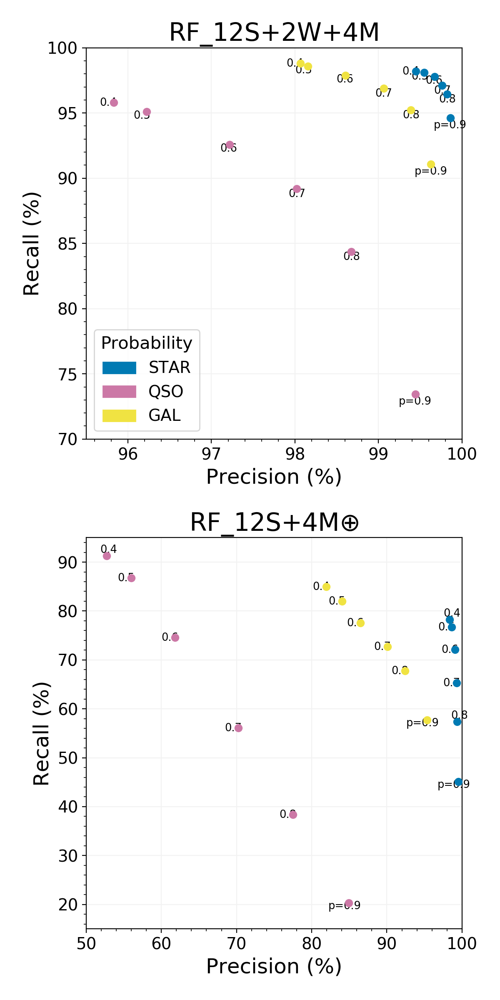

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [84]:
def denominator_completeness(prob, labels):
    tp = len(prob[(prob['target'] == labels) & (prob['pred'] == labels)])
    fn = len(prob[(prob['target'] == labels) & (prob['pred'] != labels)])
    return tp+fn

plt.close()

fig, ax = plt.subplots(2,1, figsize=(6,12))

WISE=False
stat = True
targ = [0, 1, 2]

for t in np.arange(0,2):
    y_test_aux=pd.DataFrame()
    if(t==0):
        prob = clf_wise.predict_proba(X_test[morph+feat0])
        y_pred = clf_wise.predict(X_test[morph+feat0])
        y_pred = pd.DataFrame(y_pred, columns=['target_pred'])
        y_test_aux = pd.DataFrame(y_test)
        y_test_aux.columns = ['target_test']
        y_pred.index = y_test_aux.index
    else:
        prob = clf_nowise.predict_proba(X_test2[morph+feat1])
        y_pred = clf_nowise.predict(X_test2[morph+feat1])
        y_pred = pd.DataFrame(y_pred, columns=['target_pred'])
        y_test_aux = pd.DataFrame(y_test2)
        y_test_aux.columns = ['target_test']
        y_pred.index = y_test_aux.index
    
    prob = pd.DataFrame(prob)
    prob['target'] = np.array(y_test_aux.target_test)
    prob['pred'] = np.array(y_pred)
    prob.index = y_pred.index
    
    for i in targ:
        if(i==0):
            cor = pink
        elif(i==1):
            cor = blue
        else:
            cor = yellow

        x = np.arange(0.4,1,0.1)
        p=[]
        r=[]
        for value in x:
            prob_teste = prob[prob[i]>value]
            p = np.append(p,metrics.precision_score(prob_teste['target'], prob_teste['pred'], average=None, labels=[i]))
            r = np.append(r,len(prob_teste[(prob_teste['target']==i)&(prob_teste['pred']==i)])/denominator_completeness(prob, i))

        ax[t].grid(True, color='222222', zorder=0)
        ax[t].scatter(p*100,r*100, color=cor, zorder=100, marker=marker)
        
        for value,j in zip(x,np.arange(0,len(x))):
            value=np.round(value,2)
            # Values below were hard-coded!
            if t == 0:
                if value == 0.4:
                    x,y = -33,-8
                elif value == 0.5:
                    x,y = -31,-17
                elif value == 0.6:
                    x,y = -22,-17
                else:
                    x,y=-20,-20

                if value==0.9:
                    x,y=-40,-25
                    ax[t].annotate("p="+str(value), xy=[p[j]*100, r[j]*100], fontsize=9.3, xycoords='data',
                          textcoords = 'offset pixels', xytext=[x,y])
                else:
                    ax[t].annotate( str(value), xy=[p[j]*100, r[j]*100], fontsize=9.3, xycoords='data',
                      textcoords = 'offset pixels', xytext=[x,y])
                
            if t==1: 
                if i!=1:
                    if value == 0.4 and i==0:
                        x,y = -15,7
                    else:
                        x,y = -33,-8
                else:
                    if value == 0.4 or value == 0.8:
                        x,y = -15,7
                    else:
                        x,y = -33,-8
                if value == 0.9:
                    x,y = -50, -15
                    ax[t].annotate("p="+str(value), xy=[p[j]*100, r[j]*100], fontsize=9.3, xycoords='data',
                          textcoords = 'offset pixels', xytext=[x,y])
                else:
                    ax[t].annotate( str(value), xy=[p[j]*100, r[j]*100], fontsize=9.3, xycoords='data',
                  textcoords = 'offset pixels', xytext=[x,y])
        
        ax[t].xaxis.set_tick_params(labelsize=14)
        ax[t].yaxis.set_tick_params(labelsize=14)
        ax[t].set_ylabel('Recall (%)')
        ax[t].set_xlabel('Precision (%)')
        
        if t==0:
            ax[t].set_xlim(95.5,100)
            ax[t].set_ylim(70,100)
            ax[t].minorticks_on()
            tit = 'RF_12S+2W+4M'
        elif t==1: 
            ax[t].set_ylim(15,95)
            ax[t].set_xlim(50,100)
            ax[t].minorticks_on()
            tit = r'RF_12S+4M$\oplus$'
        ax[t].set_title(tit)
        
patch2 = mpatches.Patch(color=pink, label=r'QSO')
patch1 = mpatches.Patch(color=blue, label=r'STAR')
patch3 = mpatches.Patch(color=yellow, label=r'GAL')
ax[0].legend(handles=[patch1,patch2,patch3], loc ='lower left', frameon=True, title='Probability',
             fontsize=14, title_fontsize=15) 
                   
plt.tight_layout()

# Uncomment to save figure:
# plt.savefig(img_path+'/probabilities_threshold_new.png')
# plt.savefig(img_path+'/probabilities_threshold_new.eps', format='eps', dpi=500)


# [Sec 7] Catalogue construction

Uncomment the cell below to save the models in a pickle file.

In [289]:
# init_time = time.time()
# clf_wise_final = RandomForestClassifier(
#             random_state=2, n_estimators=100, bootstrap=False)
# clf_wise_final.fit(data_wise[morph+feat0], data_wise.target)
# end_time = time.time()
# print(end_time-init_time)

# init_time = time.time()
# clf_nowise_final = RandomForestClassifier(
#             random_state=2, n_estimators=100, bootstrap=False)
# clf_nowise_final.fit(all_data[morph+feat1], all_data.target)
# end_time = time.time()
# print(end_time-init_time)

# pickle.dump(clf_wise_final, open("iDR3n4_RF_12S2W4M", 'wb'))
# pickle.dump(clf_nowise_final, open("iDR3n4_RF_12S4M", 'wb'))


100.37273716926575


Reading S-PLUS DR2 Stripe82 data already cross-matched with DR14Q (1"), DR16 (1") and ALLWISE (2"). This file only contains objects with PhotoFlag_r = 0 and $13<r\leq$22.

In [163]:
dr2_data = pd.read_table(match_path+"/STRIPE82_SDDS_DR14Q1a_DR161a_ALLWISE2a_cleaned.csv", sep=",")


/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3166: DtypeWarning: Columns (283,288,291,370,371,397,398,400,401,402,426,427,428) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [164]:
# Change column names accordingly:

w1snr = "w1snr_2"
w2snr = "w2snr_2"
w1sigmpro = "w1sigmpro"
w2sigmpro = "w2sigmpro"

# These are the WISE features that we use to determine if the source has WISE counterpart. 
# If these are null, then we do not consider the source able to be classified by RF_12S+2W+4M
# even if the source has information on both W1 and W2 bands. 

error_wise = [w1snr, w2snr,w1sigmpro, w2sigmpro]

In [165]:
s82 = dr2_data[["RA","DEC"]+morph+feat0+error_wise+['class']] 

In [174]:
# results without merging CLASS and probabilities columns from both models (will create 8 columns)
# In this dataframe, classification from RF_12S+4M* for all sources is available
result = classification(s82, prob=True, merge=False, append=True)
result = result.rename(columns={"class":"CLASS_SPEC"})

# merge CLASS and probabilities columns from both models (will create 4 columns)
# In this dataframe, classification from RF_12S+4M* is only available for sources with no WISE counterpart
result_merge = classification(s82, prob=True, append=True, merge=True)
result_merge.rename(columns={"class":"CLASS_SPEC"}, inplace=True)

In [175]:
# Saving the final catalogue:

result["spec_flag"] = np.where(result["CLASS_SPEC"].isnull(), 1, 0)
# 0 if has spectroscopic classification, 1 otherwise

result = result[['RA', 'DEC', 'FWHM_n', 'A', 'B', 'KRON_RADIUS', 'U_iso', 'F378_iso',
       'F395_iso', 'F410_iso', 'F430_iso', 'G_iso', 'F515_iso', 'R_iso',
       'F660_iso', 'I_iso', 'F861_iso', 'Z_iso', 'w1mpro', 'w2mpro', 'w1snr_2',
       'w2snr_2', 'w1sigmpro', 'w2sigmpro', 'CLASS_SPEC','spec_flag', 'CLASS', 'PROB_QSO',
       'PROB_STAR', 'PROB_GAL', 'CLASS_WISE', 'PROB_QSO_WISE',
       'PROB_STAR_WISE', 'PROB_GAL_WISE']]
result.to_csv(
    result_path+'/SPLUS_SQGTool_DR2_S82_v1.0.0.csv',index_label=False, sep=",")

In [704]:
# Some useful statistics:

result_splus_spec = result[result["CLASS_WISE"].isnull()].query('spec_flag==0')
result_wise_spec = result.query('CLASS_WISE>=0 and spec_flag==0')

print('OBJECTS THAT ARE IN OUR SPECTROSCOPIC SAMPLE')
print("Proportion of sources with WISE counterpart in S-PLUS DR2 Stripe 82 \n regardless having spectroscopic classification:", 
      np.round(len(result_wise_spec)/len(result)*100,2), '% (', len(result_wise_spec), ')')
print("Total:", len(result.query('spec_flag==1')))
print('# QSOs:', len(result_splus_spec.query('CLASS==0'))+len(result_wise_spec.query('CLASS_WISE==0')))
print('# stars:', len(result_splus_spec.query('CLASS==1'))+len(result_wise_spec.query('CLASS_WISE==1')))
print('# galaxies:', len(result_splus_spec.query('CLASS==2'))+len(result_wise_spec.query('CLASS_WISE==2')))

print("-> # of sources with very confident probabilities (>0.8)")
print(r"-- RF_12S+4M$\oplus$ - sources with no WISE counterpart")
print("QSOs:", len(result_splus_spec.query('CLASS==0 and PROB_QSO>0.8')))
print("Stars:", len(result_splus_spec.query('CLASS==1 and PROB_STAR>0.8')))
print("Galaxies:", len(result_splus_spec.query('CLASS==2 and PROB_GAL>0.8')))

print(r"-- RF_12S+2W+4M - sources with WISE counterpart")
print("QSOs:", len(result_wise_spec.query('CLASS_WISE==0 and PROB_QSO_WISE>0.8')))
print("Stars:", len(result_wise_spec.query('CLASS_WISE==1 and PROB_STAR_WISE>0.8')))
print("Galaxies:", len(result_wise_spec.query('CLASS_WISE==2 and PROB_GAL_WISE>0.8')))

print(r"-- RF_12S+4M - sources with WISE counterpart")

print("QSOs:", len(result_wise_spec.query('CLASS==0 and PROB_QSO>0.8')))
print("Stars:", len(result_wise_spec.query('CLASS==1 and PROB_STAR>0.8')))
print("Galaxies:", len(result_wise_spec.query('CLASS==2 and PROB_GAL>0.8')))

print(r"-> # of sources with low probability (<0.3) and would be missed by RF_12S+4M$\oplus$ compared to RF_12S+2W+4M:")
print("QSOs:", len(result_wise_spec.query('CLASS_WISE==0 and PROB_QSO_WISE>0.8 and PROB_QSO<0.3')))
print("Stars:", len(result_wise_spec.query('CLASS_WISE==1 and PROB_STAR_WISE>0.8 and PROB_STAR<0.3' )))
print("Galaxies:", len(result_wise_spec.query('CLASS_WISE==2 and PROB_GAL_WISE>0.8  and PROB_GAL<0.3')))

print('\n\n\nOBJECTS THAT WERE NOT IN OUR SPECTROSCOPIC SAMPLE')
result_splus = result[result["CLASS_WISE"].isnull()].query('spec_flag==1')
result_wise = result.query('CLASS_WISE>=0 and spec_flag == 1')
assert len(result_splus)+len(result_wise) == len(result.query('spec_flag==1'))

print('Total:')
print('# QSOs:', len(result_splus.query('CLASS==0'))+len(result_wise.query('CLASS_WISE==0')))
print('# stars:', len(result_splus.query('CLASS==1'))+len(result_wise.query('CLASS_WISE==1')))
print('# galaxies:', len(result_splus.query('CLASS==2'))+len(result_wise.query('CLASS_WISE==2')))


print('# of sources with WISE counterpart:')
print('QSOs:', len(result_wise.query('CLASS_WISE==0')))
print('stars:', len(result_wise.query('CLASS_WISE==1')))
print('galaxies:',len(result_wise.query('CLASS_WISE==2')))

print("Proportion of sources with WISE counterpart in S-PLUS DR2 Stripe 82 \n without spectroscopic classification:", 
      np.round(len(result_wise)/len(result)*100,2), '% (', len(result_wise), ')')


print("-> # of sources with very confident probabilities (>0.8)")
print(r"-- RF_12S+4M$\oplus$ - sources with no WISE counterpart")
print("QSOs:", len(result_splus.query('CLASS==0 and PROB_QSO>0.8')))
print("Stars:", len(result_splus.query('CLASS==1 and PROB_STAR>0.8')))
print("Galaxies:", len(result_splus.query('CLASS==2 and PROB_GAL>0.8')))

print(r"-- RF_12S+2W+4M - sources with WISE counterpart")
print("QSOs:", len(result_wise.query('CLASS_WISE==0 and PROB_QSO_WISE>0.8')))
print("Stars:", len(result_wise.query('CLASS_WISE==1 and PROB_STAR_WISE>0.8')))
print("Galaxies:", len(result_wise.query('CLASS_WISE==2 and PROB_GAL_WISE>0.8')))

print(r"-- RF_12S+4M - sources with WISE counterpart")
print("QSOs:", len(result_wise.query('CLASS==0 and PROB_QSO>0.8')))
print("Stars:", len(result_wise.query('CLASS==1 and PROB_STAR>0.8')))
print("Galaxies:", len(result_wise.query('CLASS==2 and PROB_GAL>0.8')))

print(r"-> # of sources with low probability (<0.3) and would be missed by RF_12S+4M$\oplus$ compared to RF_12S+2W+4M")
print("QSOs:", len(result_wise.query('CLASS_WISE==0 and PROB_QSO_WISE>0.8 and PROB_QSO<0.3')))
print("Stars:", len(result_wise.query('CLASS_WISE==1 and PROB_STAR_WISE>0.8 and PROB_STAR<0.3' )))
print("Galaxies:", len(result_wise.query('CLASS_WISE==2 and PROB_GAL_WISE>0.8  and PROB_GAL<0.3')))

OBJECTS THAT ARE IN OUR SPECTROSCOPIC SAMPLE
Proportion of sources with WISE counterpart in S-PLUS DR2 Stripe 82 
 regardless having spectroscopic classification: 3.99 % ( 122686 )
Total: 2926787
# QSOs: 23435
# stars: 56043
# galaxies: 69926
-> # of sources with very confident probabilities (>0.8)
-- RF_12S+4M$\oplus$ - sources with no WISE counterpart
QSOs: 4107
Stars: 14703
Galaxies: 5911
-- RF_12S+2W+4M - sources with WISE counterpart
QSOs: 17119
Stars: 40668
Galaxies: 62849
-- RF_12S+4M - sources with WISE counterpart
QSOs: 15975
Stars: 40591
Galaxies: 63023
-> # of sources with low probability (<0.3) and would be missed by RF_12S+4M$\oplus$ compared to RF_12S+2W+4M:
QSOs: 45
Stars: 1
Galaxies: 1



OBJECTS THAT WERE NOT IN OUR SPECTROSCOPIC SAMPLE
Total:
# QSOs: 335956
# stars: 1347340
# galaxies: 1243491
# of sources with WISE counterpart:
QSOs: 24299
stars: 669759
galaxies: 530893
Proportion of sources with WISE counterpart in S-PLUS DR2 Stripe 82 
 without spectroscopic classi

## [Figure 15]

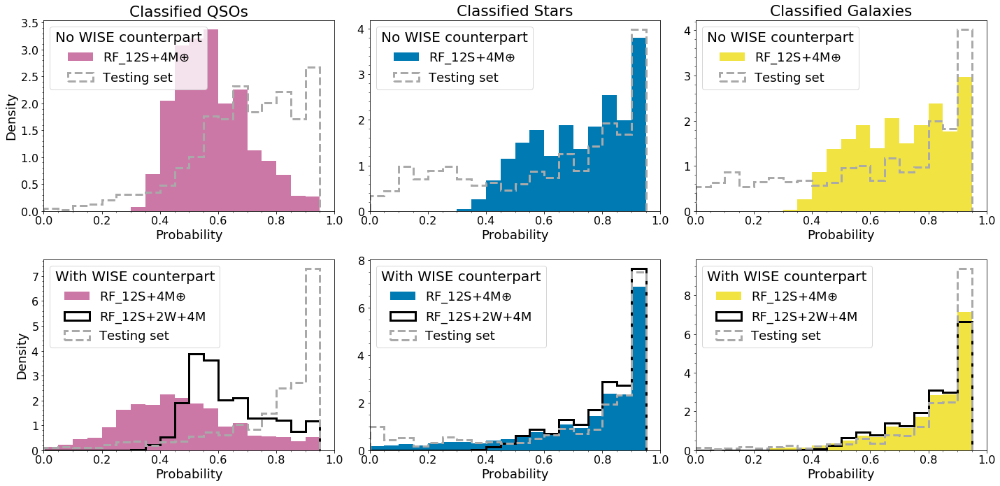

In [802]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})
plt.close()
fig, ax = plt.subplots(2,3, figsize=(20,10))

alpha = 1
bins = np.arange(0,1,0.05)

formatter = ScalarFormatter(useMathText=True) #scientific notation
formatter.set_scientific(True) 
formatter.set_powerlimits((-1,1)) 

density=True

ax[0,0].hist(result_splus.query('CLASS==0').PROB_QSO, label=r"RF_12S+4M$\oplus$", alpha = alpha, bins = bins, color=pink, density=density)

ax[0,1].hist(result_splus.query('CLASS==1').PROB_STAR, label=r"RF_12S+4M$\oplus$", alpha = alpha, bins = bins, color=blue, density=density)
ax[0,2].hist(result_splus.query('CLASS==2').PROB_GAL, label=r"RF_12S+4M$\oplus$", alpha = alpha, bins = bins, color=yellow, density=density)
ax[0,0].set_title("Classified QSOs")
ax[0,1].set_title("Classified Stars")
ax[0,2].set_title("Classified Galaxies")

for i in [0,1,2]:
    prob_test = clf_nowise.predict_proba(X_test2[X_test2['target']==i][morph+feat1])
    prob_test = pd.DataFrame(prob_test)
    ax[0,i].hist(prob_test.iloc[:,i], density=True, histtype="step", color="darkgray", linewidth=3, bins=bins, linestyle="dashed", label="Testing set")


ax[1,0].hist(result_wise.query('CLASS_WISE==0').PROB_QSO, label=r'RF_12S+4M$\oplus$', alpha = alpha, bins = bins, color=pink, density=density)
ax[1,0].hist(result_wise.query('CLASS_WISE==0').PROB_QSO_WISE, label='RF_12S+2W+4M', alpha = alpha, bins = bins, histtype="step", color="black", density=density, linewidth=3)
ax[1,1].hist(result_wise.query('CLASS_WISE==1').PROB_STAR, label=r'RF_12S+4M$\oplus$', alpha = alpha, bins = bins, color=blue, density=density)
ax[1,1].hist(result_wise.query('CLASS_WISE==1').PROB_STAR_WISE, label='RF_12S+2W+4M', alpha = alpha, bins = bins,  histtype="step", color="black", density=density, linewidth=3)
ax[1,2].hist(result_wise.query('CLASS_WISE==2').PROB_GAL, label=r'RF_12S+4M$\oplus$', alpha = alpha, bins = bins, color=yellow, density=density)
ax[1,2].hist(result_wise.query('CLASS_WISE==2').PROB_GAL_WISE, label='RF_12S+2W+4M', alpha = alpha, bins = bins,  histtype="step", color="black", density=density, linewidth=3)

for i in [0,1,2]:
    prob_test = clf_wise.predict_proba(X_test[X_test['target']==i][morph+feat0])
    prob_test = pd.DataFrame(prob_test)
    ax[1,i].hist(prob_test.iloc[:,i], density=True, histtype="step", color="darkgray", linewidth=3, linestyle="dashed", bins=bins, label="Testing set")

ax[1,0].set_ylabel("Density")

ax[0,0].set_ylabel("Density")

custom_xlim = (0, 1)
plt.setp(ax, xlim=custom_xlim)
for j, name in zip(np.arange(0,3),["QSO Probability", "Star probability", "Galaxy probability"]):
    for i, count in zip(np.arange(0,2),["No WISE counterpart", "With WISE counterpart"]):
        ax[i][j].minorticks_on()
        ax[i][j].set_xlabel(name)
        ax[i][j].set_xlabel("Probability")
        ax[i][j].yaxis.set_major_formatter(formatter)
        ax[i][j].legend(loc="upper left", title=count, prop={'size':18}, title_fontsize=20)

plt.tight_layout()

# Uncomment to save figure:
# plt.savefig(img_path+'/probabilities_catalogue.png')
# plt.savefig(img_path+'/probabilities_catalogue.eps', format='eps', dpi=500)


## [Figure 16] and extras

In [813]:
%matplotlib inline
def plot_comparisons(info, xlabel, xmin = 9999 , xmax = -9999,  step=1, save=True, loc="upper left", top=True):
    plt.close()
    plt.rcParams.update({'font.size': 24})
    if top:
        fig, ax = plt.subplots(2,3, figsize=(24,9))
    else:
        fig, ax = plt.subplots(1,3, figsize=(24,4.5))
    alpha = 1
    
    if xmin == 9999 and xmax == -9999:
        vmin = np.min(result[info])
        vmax = np.max(result[info])
    else:
        vmin = xmin
        vmax = xmax
    bins = np.arange(vmin,vmax,step)
    density=True
    
    if top:
        ax[0,0].hist(result_splus.query('CLASS==0')[info], label=r"RF_12S+4M$\oplus$", alpha = alpha, bins = bins, color=pink, density=density)
        ax[0,0].set_title("Classified QSOs")
        ax[0,1].hist(result_splus.query('CLASS==1')[info], label=r"RF_12S+4M$\oplus$", alpha = alpha, bins = bins, color=blue, density=density)
        ax[0,1].set_title("Classified Stars")
        ax[0,2].set_title("Classified Galaxies")
        ax[0,2].hist(result_splus.query('CLASS==2')[info], label="RF_12S+4M", alpha = alpha, bins = bins, color=yellow, density=density)

        ax[1,0].hist(result_wise.query('CLASS_WISE==0')[info], label='RF_12S+2W+4M', alpha = alpha, bins = bins, color=pink, density=density)
        ax[1,1].hist(result_wise.query('CLASS_WISE==1')[info], label='RF_12S+2W+4M', alpha = alpha, bins = bins, color=blue, density=density)
        ax[1,2].hist(result_wise.query('CLASS_WISE==2')[info], label='RF_12S+2W+4M', alpha = alpha, bins = bins, color=yellow, density=density)

        ax[0,0].hist(result_splus_spec[result_splus_spec["CLASS_SPEC"]=="QSO"][info], label='Spectroscopic sample', alpha = alpha, bins = bins, histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[0,1].hist(result_splus_spec[result_splus_spec["CLASS_SPEC"]=="STAR"][info], label='Spectroscopic sample', alpha = alpha, bins = bins,  histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[0,2].hist(result_splus_spec[result_splus_spec["CLASS_SPEC"]=="GALAXY"][info], label='Spectroscopic sample', alpha = alpha, bins = bins,  histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")

        ax[1,0].hist(result_wise_spec[result_wise_spec["CLASS_SPEC"]=="QSO"][info], label='Spectroscopic sample', alpha = alpha, bins = bins, histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[1,1].hist(result_wise_spec[result_wise_spec["CLASS_SPEC"]=="STAR"][info], label='Spectroscopic sample', alpha = alpha, bins = bins,  histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[1,2].hist(result_wise_spec[result_wise_spec["CLASS_SPEC"]=="GALAXY"][info], label='Spectroscopic sample', alpha = alpha, bins = bins,  histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")


        ax[1,0].set_ylabel("Density")
        ax[0,0].set_ylabel("Density")


        for j, name in zip(np.arange(0,3),["QSO Probability", "Star probability", "Galaxy probability"]):
            for i, count in zip(np.arange(0,2),["No WISE counterpart", "With WISE counterpart"]):
                ax[i][j].minorticks_on()
                ax[i][j].set_xlabel(name)
                ax[i][j].set_xlabel(xlabel)
    #             ax[i][j].yaxis.set_major_formatter(formatter)
                ax[i][j].legend(loc=loc, title=count, prop={'size':18}, title_fontsize=20)
    else:
        ax[0].hist(result_wise.query('CLASS_WISE==0')[info], label='RF_12S+2W+4M', alpha = alpha, bins = bins, color=pink, density=density)
        ax[1].hist(result_wise.query('CLASS_WISE==1')[info], label='RF_12S+2W+4M', alpha = alpha, bins = bins, color=blue, density=density)
        ax[2].hist(result_wise.query('CLASS_WISE==2')[info], label='RF_12S+2W+4M', alpha = alpha, bins = bins, color=yellow, density=density)
        ax[0].hist(result_wise_spec[result_wise_spec["CLASS_SPEC"]=="QSO"][info], label='Spectroscopic sample', alpha = alpha, bins = bins, histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[1].hist(result_wise_spec[result_wise_spec["CLASS_SPEC"]=="STAR"][info], label='Spectroscopic sample', alpha = alpha, bins = bins,  histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[2].hist(result_wise_spec[result_wise_spec["CLASS_SPEC"]=="GALAXY"][info], label='Spectroscopic sample', alpha = alpha, bins = bins,  histtype="step", color="darkgray", density=density, linewidth=3, linestyle="dashed")
        ax[0].set_ylabel("Density")
        for j, name in zip(np.arange(0,3),["QSO Probability", "Star probability", "Galaxy probability"]):
            ax[j].minorticks_on()
            ax[j].set_xlabel(name)
            ax[j].set_xlabel(xlabel)
            ax[j].legend(loc=loc, title="With WISE counterpart", prop={'size':18}, title_fontsize=20)
    custom_xlim = (vmin, vmax)
    plt.setp(ax, xlim=custom_xlim)
    plt.tight_layout()

    if save:
        plt.savefig(img_path+'/compare_dist_'+info+'.png')
        plt.savefig(img_path+'/compare_dist_'+info+'.eps', format='eps', dpi=500)
    

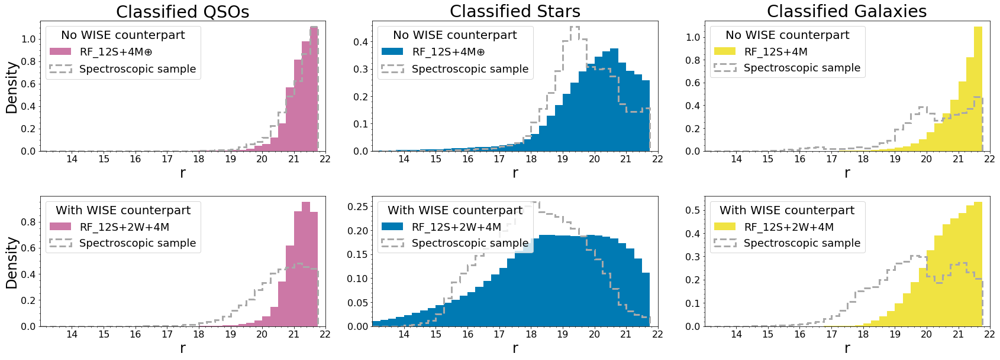

In [797]:
plot_comparisons("R_iso", "r", step=0.25, save=False)

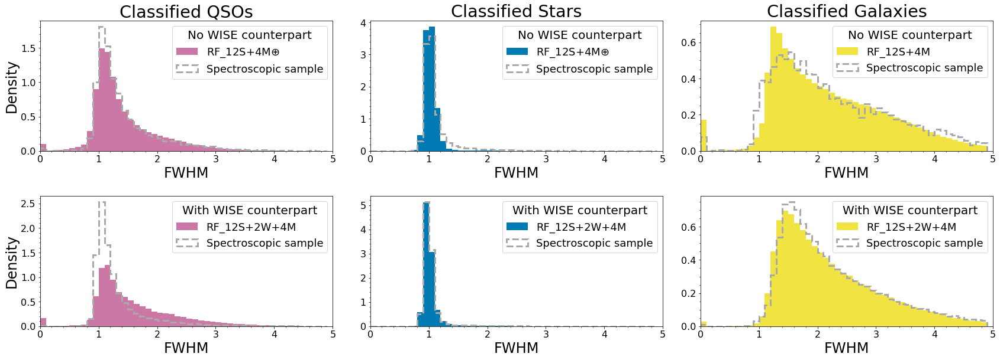

In [788]:
plot_comparisons("FWHM_n", "FWHM", step=0.1, xmin=0, xmax=5, loc="upper right")

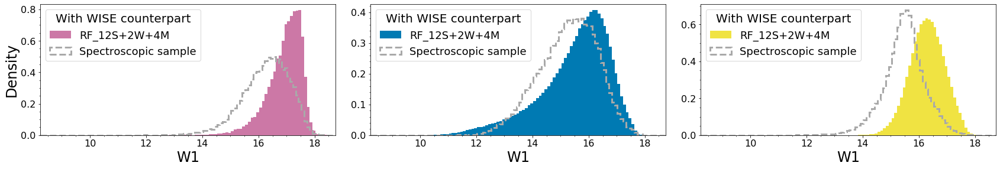

In [814]:
plot_comparisons("w1mpro", "W1", step=0.1, save=True, top=False)

## [Figure 17] T-SNE

This part takes a very long time to run (depending on your computer settings)! 

In [ ]:
cond = "(PROB_QSO>0.8 and CLASS == 0) or (PROB_STAR>0.8 and CLASS==1) or (PROB_GAL>0.8 and CLASS==2)"
len(result_merge[(result_merge["model_flag"]==str(1)) & (result_merge["class_spec"].isnull())].query(cond))

In [849]:
# saving the merged dataframe:
# result_merge.to_csv(
#     result_path+'/SPLUS_SQGTool_DR2_S82_merge_v1.0.0.csv',index_label=False, sep=",")

In [440]:
# Running t-SNE for objects classified with RF_12S+4M* with probabilities > 80%:
# Uncomment below:


# tsne_run  = TSNE(n_components=2, random_state=2).fit_transform(result_merge[(result_merge["model_flag"]==str(1)) & (result_merge["class_spec"].isnull())].query(cond)[morph+feat1])
# tsne_run = pd.DataFrame(tsne_run, columns=['first','second'])
# tsne_run.index = result_merge[(result_merge["model_flag"]==str(1)) & (result_merge["class_spec"].isnull())].query(cond).index
# tsne_fig["result_merge_morph_feat1_prob80_all"] = pd.concat([result_merge[(result_merge["model_flag"]==str(1)) & (result_merge["class_spec"].isnull())].query(cond),tsne_run], axis=1)
# tsne_fig["result_merge_morph_feat1_prob80_all"].CLASS = tsne_fig["result_merge_morph_feat1_prob80_all"].CLASS.astype("int64")
# tsne_fig["result_merge_morph_feat1_prob80_all"].CLASS = tsne_fig["result_merge_morph_feat1_prob80_all"].CLASS.astype("object")


In [502]:
# Plotting
# Uncomment below:

# hv.output(backend="bokeh")
# points = hv.Points(tsne_fig["result_merge_morph_feat1_prob80_all"].loc[dr2_data.loc[tsne_fig["result_merge_morph_feat1_prob80_all"].index].query('nDet_iso==12').index], kdims = ["first", "second"], vdims=["CLASS"])
# datashaded  = hd.datashade(points, aggregator=ds.count_cat('CLASS'), color_key=['#cc77a6','#007ab2','#f0e342'])
# plot_tsne = hd.dynspread(datashaded).opts(plot=dict(height=800,width=800))
# plot_tsne.opts(fontscale=2, fontsize={'title': 14, 'labels': 12, 'xticks': 10, 'yticks': 10})
# color_key = [(name,color) for name,color in zip(["QSO","STAR","GAL"], ['#cc77a6','#007ab2','#f0e342'])]
# color_points = hv.NdOverlay({n: hv.Points([0,0], label=str(n)).opts(style=dict(color=c)) for n,c in color_key})
# color_points * plot_tsne

:DynamicMap   []
   :Overlay
      .NdOverlay.GAL :NdOverlay   [Element]
         :Points   [x,y]
      .RGB.I         :RGB   [first,second]   (R,G,B,A)

## [Figure 18]  Galactic coordinates

In [817]:
# Calculate galactic coordinates only for objects that were not in our spetroscopic sample (spec_flag == 1)

data_lb_radec = SkyCoord(ra=result.query('spec_flag==1').RA.values.ravel()*u.degree, dec=result.query('spec_flag==1').DEC.values.ravel()*u.degree)
data_lb = pd.DataFrame([i.split(' ', 1) for i in data_lb_radec.galactic.to_string()],
                         columns = ['l','b'])
data_lb.index = result.query('spec_flag==1').index
data_lb = pd.concat([data_lb, result], axis=1)

# Uncomment to save table:
# data_lb.to_csv(result_path+'/SPLUS_SQGTool_DR2_S82_v1.0.0_galactic.csv', index=False, sep=',', na_rep='NaN')

In [818]:
data_lb = pd.concat([data_lb[['l','b']], result], axis=1)

In [819]:
data_lb.l = data_lb.l.astype("float64")
data_lb.b = data_lb.b.astype("float64")
qso_s = data_lb[(data_lb['CLASS']==0) & (data_lb["CLASS_WISE"].isnull())]
qso_sw = data_lb[data_lb['CLASS_WISE']==0]
star_s = data_lb[(data_lb['CLASS']==1) & (data_lb["CLASS_WISE"].isnull())]
star_sw = data_lb[data_lb['CLASS_WISE']==1]
gal_s = data_lb[(data_lb['CLASS']==2) & (data_lb["CLASS_WISE"].isnull())]
gal_sw = data_lb[data_lb['CLASS_WISE']==2]

assert len(qso_s)+len(star_s)+len(gal_s) + len(qso_sw)+len(star_sw)+len(gal_sw) == len(data_lb)

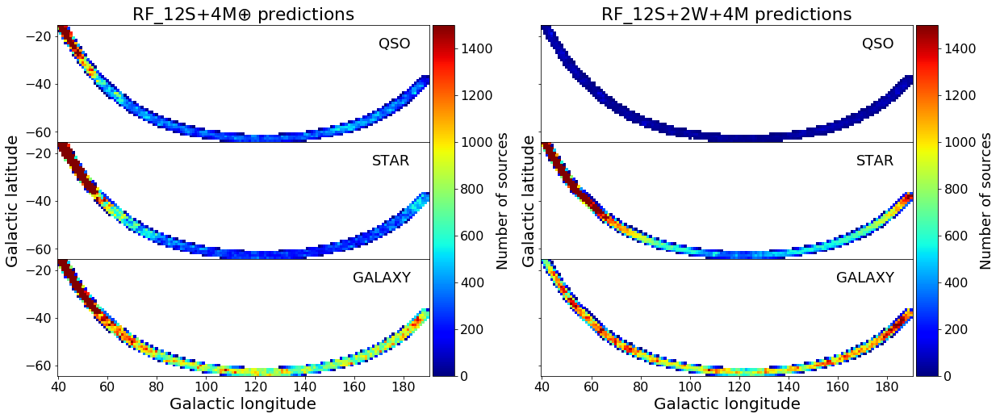

In [820]:
%matplotlib inline
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
plt.rcParams.update({'font.size': 18})
      
plt.close()
fig, ax = plt.subplots(nrows = 3, ncols = 2, figsize=(19,8), sharey=True, sharex=True)
fig.subplots_adjust(hspace=0, wspace=0.3)
palette = plt.get_cmap('jet')
palette.set_bad('white')
palette.set_under('white', 0.0000000001)
# palette.set_vmax()

vmax_sw=1500
vmax_s=1500

bins = [np.arange(np.min(qso_s.l), np.max(qso_s.l), 1), np.arange(np.min(qso_s.b), np.max(qso_s.b), 1)]
im1 = ax[0][0].hist2d(qso_s.l,qso_s.b, bins=bins, cmap= palette, vmin=0.0000001, vmax=vmax_s)
ax[0][1].hist2d(qso_sw.l,qso_sw.b, bins=bins, cmap= palette, vmin=0.0000001, vmax=vmax_sw)
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.465, 0.125, 0.02, 0.755])
norm = mpl.colors.Normalize(vmin=0.0000001, vmax=vmax_s)

cb1 = mpl.colorbar.ColorbarBase(cbar_ax, cmap=palette,
                                norm=norm,
                                orientation='vertical')
cb1.set_label('Number of sources')
ax[1][0].hist2d(star_s.l,star_s.b, bins=bins, cmap= palette, vmin=0.0000001, vmax=vmax_s)
ax[1][1].hist2d(star_sw.l,star_sw.b, bins=bins, cmap= palette, vmin=0.0000001, vmax=vmax_sw)

ax[2][0].hist2d(gal_s.l,gal_s.b, bins=bins, cmap= palette, vmin=0.0000001, vmax=vmax_s)
ax[2][1].hist2d(gal_sw.l,gal_sw.b, bins=bins, cmap= palette, vmin=0.0000001, vmax=vmax_sw)

cbar_ax2 = fig.add_axes([0.903, 0.125, 0.02, 0.755])
norm = mpl.colors.Normalize(vmin=0.0000001, vmax=vmax_sw)
cb1 = mpl.colorbar.ColorbarBase(cbar_ax2, cmap=palette,
                                norm=norm,
                                orientation='vertical')

cb1.set_label('Number of sources')
ax[2][0].set_xlabel('Galactic longitude', fontsize=20)
ax[2][1].set_xlabel('Galactic longitude', fontsize=20)
ax[1][0].set_ylabel('Galactic latitude', fontsize=20)
ax[1][1].set_ylabel('Galactic latitude', fontsize=20)

ax[0][0].text(0.95,0.9,'QSO', transform=ax[0][0].transAxes, fontsize=18, horizontalalignment='right',
        verticalalignment='top')

ax[1][0].text(0.95,0.9,'STAR', transform=ax[1][0].transAxes, fontsize=18, horizontalalignment='right',
        verticalalignment='top')
ax[2][0].text(0.95,0.9,'GALAXY', transform=ax[2][0].transAxes, fontsize=18, horizontalalignment='right',
        verticalalignment='top')
ax[0][1].text(0.95,0.9,'QSO', transform=ax[0][1].transAxes, fontsize=18, horizontalalignment='right',
        verticalalignment='top')
ax[1][1].text(0.95,0.9,'STAR', transform=ax[1][1].transAxes, fontsize=18, horizontalalignment='right',
        verticalalignment='top')
ax[2][1].text(0.95,0.9,'GALAXY', transform=ax[2][1].transAxes, fontsize=18, horizontalalignment='right',
        verticalalignment='top')

ax[0][0].set_title(r'RF_12S+4M$\oplus$ predictions')
ax[0][1].set_title('RF_12S+2W+4M predictions')

# Uncoment to save figure:
# plt.savefig(img_path+'/bxl_new.png')
# plt.savefig(img_path+'/bxl_new.eps', format='eps', dpi=500)


## [Figure 19]

For this figure we need to do a cross-match between S-PLUS and PhotoObj table from SDSS DR16 (query is shown in the beginning of this file, Section 4).

In [446]:
match_type = pd.read_table(result_path+'/SPLUS_SQGTool_DR2_S82_merge_photoobj_v1.0.0.csv', sep=',')

/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3166: DtypeWarning: Columns (24) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [448]:
# I am only running this because the first 31 columns were saved without a column name... :)
match_type.columns = list(result_merge)+list(match_type)[-7:]

In [449]:
# Create lists in order to plot stacked histograms

gal_splus = [match_type.query('type==3 and (CLASS==1) and model_flag == 1 ')[mag_splus],
             match_type.query('type==3 and CLASS==0 and model_flag == 1')[mag_splus],
             match_type.query('type==3 and (CLASS==2) and model_flag == 1')[mag_splus]]
star_splus = [match_type.query('type==6 and (CLASS==1) and model_flag == 1')[mag_splus],
              match_type.query('type==6 and CLASS==0 and model_flag == 1')[mag_splus],
              match_type.query('type==6 and (CLASS==2) and model_flag == 1')[mag_splus]]

gal_sw = [match_type.query('type==3 and (CLASS==1) and model_flag == 0')[mag_splus],
          match_type.query('type==3 and CLASS==0 and model_flag == 0')[mag_splus],
          match_type.query('type==3 and (CLASS==2) and model_flag == 0')[mag_splus]]
star_sw = [match_type.query('type==6 and (CLASS==1) and model_flag == 0')[mag_splus],
           match_type.query('type==6 and CLASS==0 and model_flag == 0')[mag_splus],
           match_type.query('type==6 and (CLASS==2) and model_flag == 0')[mag_splus]]


In [450]:
# We need the first information of each histogram for the following plot...

plt.close()
bins=np.arange(13,22.5,0.5)
n_s, bins_s, patches_s = plt.hist(gal_splus[0],bins=bins)
n_q, bins_q, patches_q= plt.hist(gal_splus[1],bins=bins)
n_g, bins_g, patches_g = plt.hist(gal_splus[2],bins=bins)
n_s_2, bins_s, patches_s = plt.hist(star_splus[0],bins=bins)
n_q_2, bins_q, patches_q= plt.hist(star_splus[1],bins=bins)
n_g_2, bins_g, patches_g = plt.hist(star_splus[2],bins=bins)
n_sw, bins_s, patches_s = plt.hist(gal_sw[0],bins=bins)
n_qw, bins_q, patches_q= plt.hist(gal_sw[1],bins=bins)
n_gw, bins_g, patches_g = plt.hist(gal_sw[2],bins=bins)
n_s_2w, bins_s, patches_s = plt.hist(star_sw[0],bins=bins)
n_q_2w, bins_q, patches_q= plt.hist(star_sw[1],bins=bins)
n_g_2w, bins_g, patches_g = plt.hist(star_sw[2],bins=bins)

plt.close()

<IPython.core.display.Javascript object>


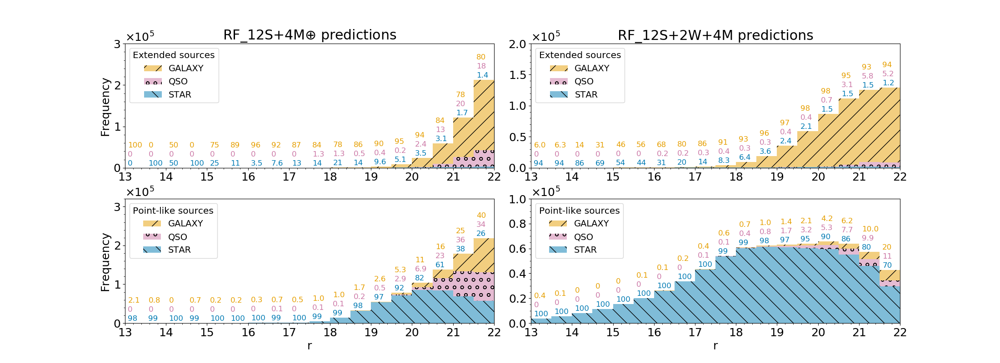

/Users/Mariko/opt/anaconda3/envs/qso/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [59]:

plt.rcParams['axes.prop_cycle'] = cycler('color', [blue,pink,orange])
plt.rcParams['legend.title_fontsize'] = 14.5
plt.close()
log=False
fig, ax = plt.subplots(2,2, figsize=(22,8))
fig.subplots_adjust(hspace=0.25, wspace=0.1)
bins=np.arange(13,22.4,0.5)

n, bins, patches = ax[0][0].hist(gal_splus,bins=bins, log=log, alpha=0.5,zorder=0, label=['STAR','QSO','GALAXY'], stacked=True)
ax[0][0].set_title('Classifier: i-b*')

y1 = 5
y2 = 25
y3 = 45
s = 12

# Plotting the % of each class per bin above the histogram bar (I should have created a function for this, sorry!)
for xpos, ys,yq,yg in zip(bins+0.07, n_s, n_q, n_g):
    len_extended = ys+yq+yg
    if len_extended == 0:
        continue
    if ys*100/len_extended<10 and np.round(ys*100/len_extended,1)>0.0:
        ax[0][0].annotate("%.1f"%np.round(ys*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    else:
        ax[0][0].annotate("%.0f"%np.round(ys*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    if yq*100/len_extended<10 and np.round(yq*100/len_extended,1)>0.0:
        ax[0][0].annotate("%.1f"%np.round(yq*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    else:
        ax[0][0].annotate("%.0f"%np.round(yq*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    if yg*100/len_extended<10 and np.round(yg*100/len_extended,1)>0.0:
        ax[0][0].annotate("%.1f"%np.round(yg*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)
    else:
        ax[0][0].annotate("%.0f"%np.round(yg*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)  
hatches = ['\\', 'o', '/']
for patch_set, hatch in zip(patches, hatches):
    for patch in patch_set.patches:
        patch.set_hatch(hatch)

circ1 = mpatches.Patch( facecolor=blue,alpha=0.5,hatch=hatches[0],label='STAR')
circ2= mpatches.Patch( facecolor=pink,alpha=0.5,hatch=hatches[1],label='QSO')
circ3 = mpatches.Patch(facecolor=orange,alpha=0.5,hatch=hatches[2],label='GALAXY')
ax[0][0].legend(handles = [circ3,circ2,circ1],loc=2, fontsize=14, title="Extended sources")

n, bins, patches =  ax[1][0].hist(star_splus,bins=bins, log=log, alpha=0.5,zorder=0, label=['STAR','QSO','GALAXY'], stacked=True)

ax[1][0].set_xlabel('r')
ax[1][0].legend(fontsize=12, loc='upper left')
hatches = ['\\', 'o', '/']
for patch_set, hatch in zip(patches, hatches):
    for patch in patch_set.patches:
        patch.set_hatch(hatch)

# Plotting the % of each class per bin above the histogram bar
for xpos, ys,yq,yg in zip(bins+0.07, n_s_2, n_q_2, n_g_2):
    len_extended = ys+yq+yg
    if len_extended == 0:
        continue
    if ys*100/len_extended<10 and np.round(ys*100/len_extended,1)>0.0:
        ax[1][0].annotate("%.1f"%np.round(ys*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    else:
        ax[1][0].annotate("%.0f"%np.round(ys*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    if yq*100/len_extended<10 and np.round(yq*100/len_extended,1)>0.0:
        ax[1][0].annotate("%.1f"%np.round(yq*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    else:
        ax[1][0].annotate("%.0f"%np.round(yq*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    if yg*100/len_extended<10 and np.round(yg*100/len_extended,1)>0.0:
        ax[1][0].annotate("%.1f"%np.round(yg*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)
    else:
        ax[1][0].annotate("%.0f"%np.round(yg*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)  
circ1 = mpatches.Patch( facecolor=blue,alpha=0.5,hatch=hatches[0],label='STAR')
circ2= mpatches.Patch( facecolor=pink,alpha=0.5,hatch=hatches[1],label='QSO')
circ3 = mpatches.Patch(facecolor=orange,alpha=0.5,hatch=hatches[2],label='GALAXY')
ax[1][0].legend(handles = [circ3,circ2,circ1],loc=2, fontsize=14, title="Point-like sources")

n, bins, patches =  ax[1][1].hist(star_sw,bins=bins, log=log, alpha=0.5,zorder=0, label=['STAR','QSO','GALAXY'], stacked=True)

ax[1][1].set_xlabel('r')
ax[1][1].legend(fontsize=12, loc='upper left')
hatches = ['\\', 'o', '/']
for patch_set, hatch in zip(patches, hatches):
    for patch in patch_set.patches:
        patch.set_hatch(hatch)
        
# Plotting the % of each class per bin above the histogram bar
for xpos, ys,yq,yg in zip(bins+0.07, n_s_2w, n_q_2w, n_g_2w):
    len_extended = ys+yq+yg
    if len_extended == 0:
        continue
    if ys*100/len_extended<10 and np.round(ys*100/len_extended,1)>0.0:
        ax[1][1].annotate("%.1f"%np.round(ys*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    else:
        ax[1][1].annotate("%.0f"%np.round(ys*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    if yq*100/len_extended<10 and np.round(yq*100/len_extended,1)>0.0:
        ax[1][1].annotate("%.1f"%np.round(yq*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    else:
        ax[1][1].annotate("%.0f"%np.round(yq*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    if yg*100/len_extended<10 and np.round(yg*100/len_extended,1)>0.0:
        ax[1][1].annotate("%.1f"%np.round(yg*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)
    else:
        ax[1][1].annotate("%.0f"%np.round(yg*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)  
circ1 = mpatches.Patch( facecolor=blue,alpha=0.5,hatch=hatches[0],label='STAR')
circ2= mpatches.Patch( facecolor=pink,alpha=0.5,hatch=hatches[1],label='QSO')
circ3 = mpatches.Patch(facecolor=orange,alpha=0.5,hatch=hatches[2],label='GALAXY')
ax[1][1].legend(handles = [circ3,circ2,circ1],loc=2,  fontsize=14, title="Point-like sources")


n, bins, patches = ax[0][1].hist(gal_sw,bins=bins, log=log, alpha=0.5, zorder=0,label=['STAR','QSO','GALAXY'], stacked=True)

# Plotting the % of each class per bin above the histogram bar
for xpos, ys,yq,yg in zip(bins+0.07, n_sw, n_qw, n_gw):
    len_extended = ys+yq+yg
    if len_extended == 0:
        continue
    if ys*100/len_extended<10 and np.round(ys*100/len_extended,1)>0.0:
        ax[0][1].annotate("%.1f"%np.round(ys*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    else:
        ax[0][1].annotate("%.0f"%np.round(ys*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y1], color = blue)
    if yq*100/len_extended<10 and np.round(yq*100/len_extended,1)>0.0:
        ax[0][1].annotate("%.1f"%np.round(yq*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    else:
        ax[0][1].annotate("%.0f"%np.round(yq*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y2], color = pink)
    if yg*100/len_extended<10 and np.round(yg*100/len_extended,1)>0.0:
        ax[0][1].annotate("%.1f"%np.round(yg*100/len_extended,1), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)
    else:
        ax[0][1].annotate("%.0f"%np.round(yg*100/len_extended,0), xy=[xpos, len_extended], fontsize=s, xycoords='data',
                              textcoords = 'offset pixels', xytext=[0,y3], color = orange)   
hatches = ['\\', 'o', '/']
for patch_set, hatch in zip(patches, hatches):
    for patch in patch_set.patches:
        patch.set_hatch(hatch)
circ1 = mpatches.Patch( facecolor=blue,alpha=0.5,hatch=hatches[0],label='STAR')
circ2= mpatches.Patch( facecolor=pink,alpha=0.5,hatch=hatches[1],label='QSO')
circ3 = mpatches.Patch(facecolor=orange,alpha=0.5,hatch=hatches[2],label='GALAXY')
ax[0][1].legend(handles = [circ3,circ2,circ1],loc=2, fontsize=14, title="Extended sources")

ax[0][0].set_title(r'RF_12S+4M$\oplus$ predictions')
ax[0][1].set_title('RF_12S+2W+4M predictions')

ax[1][0].set_ylabel('Frequency')
ax[0][0].set_ylabel('Frequency')
ax[1][0].set_ylim(0,320000)
ax[1][1].set_ylim(0,100000)
ax[0][0].set_ylim(0,300000)
ax[0][1].set_ylim(0,200000) 

formatter = ScalarFormatter(useMathText=True) #scientific notation
formatter.set_scientific(True) 
formatter.set_powerlimits((-1,1)) 
for i in [0,1]:
    for j in [0,1]:
        ax[j][i].yaxis.set_major_formatter(formatter)
        ax[j][i].minorticks_on()
        ax[j][i].set_xlim(13,22)

# Uncomment to save figure:
# plt.savefig(img_path+'/morph_class.pdf', format='pdf', dpi=500)  
# plt.savefig(img_path+'/morph_class.png', bbox_inches='tight')



plt.show()


In [66]:
# Calculating some numbers per bin of magnitude

bins = np.arange(0, 22, 1)
# MODEL RF_12S+2W+4M
cond = 'R_iso <=22 and type==3 and model_flag==0' # EXTENDED
extended_qso_sw = match_type[match_type['CLASS']==0].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==0].query(cond)[mag_splus], bins))[mag_splus].count()
extended_notqso_sw = match_type[match_type['CLASS']!=0].query(cond).groupby(pd.cut(match_type[match_type['CLASS']!=0].query(cond)[mag_splus], bins))[mag_splus].count()
extended_star_sw = match_type[match_type['CLASS']==1].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==1].query(cond)[mag_splus], bins))[mag_splus].count()
len_extended_sw = len(match_type.query(cond))

cond = 'R_iso <=22 and type==6 and model_flag==0' # EXTENDED
ps_gal_sw = match_type[match_type['CLASS']==2].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==2].query(cond)[mag_splus], bins))[mag_splus].count()
ps_notgal_sw = match_type[match_type['CLASS']!=2].query(cond).groupby(pd.cut(match_type[match_type['CLASS']!=2].query(cond)[mag_splus], bins))[mag_splus].count()
ps_qso_sw = match_type[match_type['CLASS']==0].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==0].query(cond)[mag_splus], bins))[mag_splus].count()
len_ps_sw = len(match_type.query(cond))

# MODEL RF_!2S+4M
cond = 'R_iso<=22 and type==3 and model_flag==1' # POINT-LIKE
extended_qso = match_type[match_type['CLASS']==0].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==0].query(cond)[mag_splus], bins))[mag_splus].count()
extended_notqso = match_type[match_type['CLASS']!=0].query(cond).groupby(pd.cut(match_type[match_type['CLASS']!=0].query(cond)[mag_splus], bins))[mag_splus].count()
extended_star = match_type[match_type['CLASS']==1].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==1].query(cond)[mag_splus], bins))[mag_splus].count()
len_extended = len(match_type.query(cond))

cond = 'R_iso <=22 and type==6 and model_flag==1' # EXTENDED
ps_gal = match_type[match_type['CLASS']==2].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==2].query(cond)[mag_splus], bins))[mag_splus].count()
ps_notgal = match_type[match_type['CLASS']!=2].query(cond).groupby(pd.cut(match_type[match_type['CLASS']!=2].query(cond)[mag_splus], bins))[mag_splus].count()
ps_qso = match_type[match_type['CLASS']==0].query(cond).groupby(pd.cut(match_type[match_type['CLASS']==0].query(cond)[mag_splus], bins))[mag_splus].count()
len_ps = len(match_type.query(cond))




In [67]:
# Some useful statistics:

print(r'RF_12S+4M$\oplus$')
print('Fraction of QSOs in the extended sources sample 20<r<21:', np.round(np.array(extended_qso/len_extended)[-1]*100,2), '%')
print('Total fraction of QSOs in the extended sources sample:', np.round(np.array(extended_qso.sum()/len_extended)*100,2), '%')
print('Fraction of stars in the extended sources sample 20<r<21:', np.round(np.array(extended_star/len_extended)[-1]*100,2), '%')
print('Total fraction of stars in the extended sources sample:', np.round(np.array(extended_star.sum()/len_extended)*100,2), '%')
print('Fraction of galaxies in the point-like sources sample 20<r<21:', np.round(np.array(ps_gal/len_ps)[-1]*100,2), '%')
print('Total fraction of galaxies in the point-like sources sample:', np.round(np.array(ps_gal.sum()/len_ps)*100,2), '%')
print('Total fraction of quasars in the point-like sources sample:', np.round(np.array(ps_qso.sum()/len_ps)*100,2), '%')
print('Fraction of quasars that are point-like sources:', np.round(np.array(ps_qso.sum()/len_ps)*100,2), '%')

print('RF_12S+2W+4M')
print('Fraction of QSOs in the extended sources sample 20<r<21:', np.round(np.array(extended_qso_sw/len_extended_sw)[-1]*100,2), '%')
print('Total fraction of QSOs in the extended sources sample:', np.round(np.array(extended_qso_sw.sum()/len_extended_sw)*100,2), '%')
print('Fraction of stars in the extended sources sample 20<r<21:', np.round(np.array(extended_star_sw/len_extended_sw)[-1]*100,2), '%')
print('Total fraction of stars in the extended sources sample:', np.round(np.array(extended_star_sw.sum()/len_extended_sw)*100,2), '%')
print('Fraction of galaxies in the point-like sources sample 20<r<21:', np.round(np.array(ps_gal_sw/len_ps_sw)[-1]*100,2), '%')
print('Total fraction of galaxies in the point-like sources sample:', np.round(np.array(ps_gal_sw.sum()/len_ps_sw)*100,2), '%')
print('Total fraction of quasars in the point-like sources sample:', np.round(np.array(ps_qso_sw.sum()/len_ps_sw)*100,2), '%')
print('Fraction of quasars that are point-like sources:', np.round(np.array(ps_qso_sw.sum()/len_ps_sw)*100,2), '%')


RF_12S+4M$\oplus$
Fraction of QSOs in the extended sources sample 20<r<21: 1.96 %
Total fraction of QSOs in the extended sources sample: 1.97 %
Fraction of stars in the extended sources sample 20<r<21: 0.62 %
Total fraction of stars in the extended sources sample: 0.83 %
Fraction of galaxies in the point-like sources sample 20<r<21: 4.15 %
Total fraction of galaxies in the point-like sources sample: 4.91 %
Total fraction of quasars in the point-like sources sample: 5.01 %
Fraction of quasars that are point-like sources: 5.01 %
RF_12S+2W+4M
Fraction of QSOs in the extended sources sample 20<r<21: 0.7 %
Total fraction of QSOs in the extended sources sample: 0.78 %
Fraction of stars in the extended sources sample 20<r<21: 0.51 %
Total fraction of stars in the extended sources sample: 1.35 %
Fraction of galaxies in the point-like sources sample 20<r<21: 0.95 %
Total fraction of galaxies in the point-like sources sample: 1.52 %
Total fraction of quasars in the point-like sources sample: 1.7

# Appendix

## Bias analyses

In [451]:
# Objects with WISE counterpart

# ...that have no missing-band values
data_wise_no_mv = data_wise.query('nDet_iso==12')
# ... that have missing-band values
data_wise_with_mv = data_wise.query('nDet_iso!=12')

# Objects without WISE counterpart

# ... that have no missing-band values
data_no_mv = all_data.query('nDet_iso==12')
# ... that have missing-band values
data_with_mv = all_data.query('nDet_iso!=12')


### [Figure B1]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


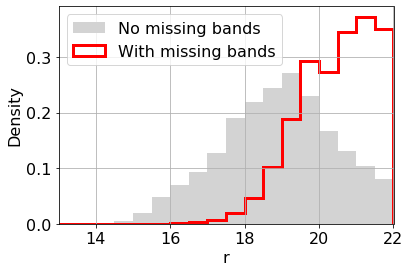

In [28]:
data_no_mv.R_iso.hist(bins=np.arange(13,22.1,0.5), density=True, alpha=1, label="No missing bands", color="lightgray")
data_with_mv.R_iso.hist(bins=np.arange(13,22.1,0.5), density=True, alpha=1, label="With missing bands", color="red", histtype="step", linewidth=3)

plt.legend(loc="upper left")
plt.xlabel('r')
plt.xlim(13,22)
plt.ylabel('Density')

# Uncomment to save figure:
# plt.savefig(img_path+"/mb_dist.png")
# plt.savefig(img_path+"/mb_dist.eps", format='eps', dpi=500)

### Sampling

In [353]:
# Sampling data without missing-band values:
X_train_nomv, X_test_nomv, y_train_nomv, y_test_nomv = train_test_split(data_wise_no_mv, data_wise_no_mv.target,
                                                    test_size=0.25,
                                                    random_state=2,
                                                    stratify=data_wise_no_mv.target)


full_X_train_nomv, full_X_test_nomv, full_y_train_nomv, full_y_test_nomv = train_test_split(data_no_mv, data_no_mv.target,
                                                    test_size=0.25,
                                                    random_state=2,
                                                    stratify=data_no_mv.target)


kf = StratifiedKFold(n_splits=5, random_state=2, shuffle=True) 

### CV on data without missing band values

In [509]:
print("RF_12S+2W+4M")
init_time = time.time()
clf_cv = RandomForestClassifier(
        random_state=2, bootstrap=False)
results["NOMV_12S+2W+4M"] = cross_validate(
        estimator=clf_cv, X=X_train_nomv[feat0+morph], y=y_train_nomv, cv=kf, scoring=scoring, return_train_score=False)
end_time = time.time()
print("CV time:", end_time-init_time)
print_metrics(results["NOMV_12S+2W+4M"])

RF_12S+2W+4M
CV time: 137.24745082855225
Fit time: 27.2084 $\pm$ 1.2933
P_QSO: 96.12 $\pm$ 0.58
R_QSO: 97.38 $\pm$ 0.15
F1_QSO: 96.75 $\pm$ 0.3
P_STAR: 99.41 $\pm$ 0.1
R_STAR: 98.53 $\pm$ 0.11
F1_STAR: 98.97 $\pm$ 0.07
P_GAL: 98.01 $\pm$ 0.12
R_GAL: 98.23 $\pm$ 0.22
F1_GAL: 98.12 $\pm$ 0.14
Macro-averaged F-measure: 97.95 $\pm$ 0.15


In [510]:
print(r"RF_12S+4M$\oplus$")
init_time = time.time()
clf_cv = RandomForestClassifier(
        random_state=2, bootstrap=False)
results["NOMV_12S+4M"] = cross_validate(
        estimator=clf_cv, X=full_X_train_nomv[feat1+morph], y=full_y_train_nomv, cv=kf, scoring=scoring, return_train_score=False)
end_time = time.time()
print("CV time:", end_time-init_time)
print_metrics(results["NOMV_12S+4M"])

RF_12S+4M$\oplus$
CV time: 179.42749214172363
Fit time: 35.6089 $\pm$ 0.3113
P_QSO: 85.57 $\pm$ 0.78
R_QSO: 89.68 $\pm$ 0.53
F1_QSO: 87.57 $\pm$ 0.46
P_STAR: 96.21 $\pm$ 0.3
R_STAR: 94.31 $\pm$ 0.32
F1_STAR: 95.25 $\pm$ 0.21
P_GAL: 96.42 $\pm$ 0.19
R_GAL: 96.48 $\pm$ 0.08
F1_GAL: 96.45 $\pm$ 0.11
Macro-averaged F-measure: 93.09 $\pm$ 0.2


### Simulating missing-band values

In [320]:
# Objects with WISE counterpart:


mb = {}

teste = data_wise_no_mv.copy(deep=True)
data_miss = pd.DataFrame()

nqso = len(data_wise.query('target==0'))
nstar = len(data_wise.query('target==1'))
ngal = len(data_wise.query('target==2'))
nqso_no = len(data_wise_no_mv.query('target==0'))
nstar_no = len(data_wise_no_mv.query('target==1'))
ngal_no = len(data_wise_no_mv.query('target==2'))

for L in range(1, 12):
    print("Combination: "+str(L)+" bands")
    for subset in itertools.combinations(feat1, L):
        name_qso = "QSO"
        name_star = "STAR"
        name_gal = "GAL"
        cond = "nDet_iso == "+str(12-L)
        for sub in subset:
            name_qso = name_qso+"_"
            name_star = name_star+"_"
            name_gal = name_gal+"_"
            cond = cond+" and "+sub+"==99"
            name_qso = name_qso+sub
            name_star = name_star+sub
            name_gal = name_gal+sub
        mb[name_qso] = int(round(nqso_no*len(data_wise_with_mv.query(cond+' and target == 0'))/nqso,0))
        mb[name_star]= int(round(nstar_no*len(data_wise_with_mv.query(cond+' and target == 1'))/nstar,0))
        mb[name_gal]= int(round(ngal_no*len(data_wise_with_mv.query(cond+' and target == 2'))/ngal,0))
        aux_qso = teste.query('target == 0').sample(n=mb[name_qso])
        aux_star = teste.query('target == 1').sample(n=mb[name_star])
        aux_gal = teste.query('target == 2').sample(n=mb[name_gal])
        aux_qso["nDet_simulated"] = 12-L
        aux_star["nDet_simulated"] = 12-L
        aux_gal["nDet_simulated"] = 12-L
        
        for sub in subset:
            aux_qso[sub] = 99
            aux_star[sub] = 99
            aux_gal[sub] = 99
            
        teste.drop(aux_qso.index,inplace=True)
        teste.drop(aux_star.index,inplace=True)
        teste.drop(aux_gal.index,inplace=True)
        data_miss = pd.concat([data_miss, aux_qso, aux_star, aux_gal], axis=0)
simulated_data = pd.concat([data_miss,teste], axis=0)

Combination: 1 bands
Combination: 2 bands
Combination: 3 bands
Combination: 4 bands
Combination: 5 bands
Combination: 6 bands
Combination: 7 bands
Combination: 8 bands
Combination: 9 bands
Combination: 10 bands
Combination: 11 bands


In [321]:
# Objects without WISE counterpart:

mb = {}

teste = data_no_mv.copy(deep=True)
data_miss = pd.DataFrame()

nqso = len(all_data.query('target==0'))
nstar = len(all_data.query('target==1'))
ngal = len(all_data.query('target==2'))
nqso_no = len(data_no_mv.query('target==0'))
nstar_no = len(data_no_mv.query('target==1'))
ngal_no = len(data_no_mv.query('target==2'))

for L in range(1, 12):
    print("Combination: "+str(L)+" bands")
    for subset in itertools.combinations(feat1, L):
        name_qso = "QSO"
        name_star = "STAR"
        name_gal = "GAL"
        cond = "nDet_iso == "+str(12-L)
        for sub in subset:
            name_qso = name_qso+"_"
            name_star = name_star+"_"
            name_gal = name_gal+"_"
            cond = cond+" and "+sub+"==99"
            name_qso = name_qso+sub
            name_star = name_star+sub
            name_gal = name_gal+sub
        mb[name_qso] = int(round(nqso_no*len(data_with_mv.query(cond+' and target == 0'))/nqso,0))
        mb[name_star]= int(round(nstar_no*len(data_with_mv.query(cond+' and target == 1'))/nstar,0))
        mb[name_gal]= int(round(ngal_no*len(data_with_mv.query(cond+' and target == 2'))/ngal,0))
        aux_qso = teste.query('target == 0').sample(n=mb[name_qso])
        aux_star = teste.query('target == 1').sample(n=mb[name_star])
        aux_gal = teste.query('target == 2').sample(n=mb[name_gal])
        aux_qso["nDet_simulated"] = 12-L
        aux_star["nDet_simulated"] = 12-L
        aux_gal["nDet_simulated"] = 12-L
        
        for sub in subset:
            aux_qso[sub] = 99
            aux_star[sub] = 99
            aux_gal[sub] = 99
            
        teste.drop(aux_qso.index,inplace=True)
        teste.drop(aux_star.index,inplace=True)
        teste.drop(aux_gal.index,inplace=True)
        data_miss = pd.concat([data_miss, aux_qso, aux_star, aux_gal], axis=0)
simulated_data_nowise = pd.concat([data_miss,teste], axis=0)

Combination: 1 bands
Combination: 2 bands
Combination: 3 bands
Combination: 4 bands
Combination: 5 bands
Combination: 6 bands
Combination: 7 bands
Combination: 8 bands
Combination: 9 bands
Combination: 10 bands
Combination: 11 bands


In [354]:
# Creating training and testing dataframes with the same objects from 10.1.3
X_train_allmb = simulated_data.loc[X_train_nomv.index]
y_train_allmb = simulated_data.loc[X_train_nomv.index]["target"]
X_test_allmb = simulated_data.loc[X_test_nomv.index]
y_test_allmb = simulated_data.loc[X_test_nomv.index]["target"]

X_test_allmb_withmb = X_test_allmb.query('nDet_simulated>0')
y_test_allmb_withmb = simulated_data.loc[X_test_nomv.index,].query('nDet_simulated>0')["target"]

X_test_allmb_nomb = X_test_allmb.drop(X_test_allmb_withmb.index)
y_test_allmb_nomb = X_test_allmb.drop(X_test_allmb_withmb.index)["target"]

full_X_train_allmb = simulated_data_nowise.loc[full_X_train_nomv.index]
full_y_train_allmb = simulated_data_nowise.loc[full_X_train_nomv.index]["target"]
full_X_test_allmb = simulated_data_nowise.loc[full_X_test_nomv.index]
full_y_test_allmb = simulated_data_nowise.loc[full_X_test_nomv.index]["target"]

full_X_test_allmb_withmb = full_X_test_allmb.query('nDet_simulated>0')
full_y_test_allmb_withmb = simulated_data_nowise.loc[full_X_test_nomv.index].query('nDet_simulated>0')["target"]

full_X_test_allmb_nomb = full_X_test_allmb.drop(full_X_test_allmb_withmb.index)
full_y_test_allmb_nomb = full_X_test_allmb.drop(full_X_test_allmb_withmb.index)["target"]

### CV on data with simulated missing-band values

In [511]:
print("RF_12S+2W+4M")
init_time = time.time()
clf_cv = RandomForestClassifier(
        random_state=2, bootstrap=False)
results["SIMMV_12S+2W+4M"] = cross_validate(
        estimator=clf_cv, X=X_train_allmb[feat0+morph], y=y_train_allmb, cv=kf, scoring=scoring, return_train_score=False)
end_time = time.time()
print("CV time:", end_time-init_time)
print_metrics(results["SIMMV_12S+2W+4M"])

RF_12S+2W+4M
CV time: 130.2751169204712
Fit time: 25.8325 $\pm$ 0.2609
P_QSO: 96.2 $\pm$ 0.61
R_QSO: 97.54 $\pm$ 0.34
F1_QSO: 96.87 $\pm$ 0.43
P_STAR: 99.39 $\pm$ 0.06
R_STAR: 98.55 $\pm$ 0.11
F1_STAR: 98.97 $\pm$ 0.05
P_GAL: 98.11 $\pm$ 0.18
R_GAL: 98.26 $\pm$ 0.2
F1_GAL: 98.18 $\pm$ 0.17
Macro-averaged F-measure: 98.01 $\pm$ 0.2


In [512]:
print(r"RF_12S+4M$\oplus$")
init_time = time.time()
clf_cv = RandomForestClassifier(
        random_state=2, bootstrap=False)
results["SIMMV_12S+4M"] = cross_validate(
        estimator=clf_cv, X=full_X_train_allmb[feat1+morph], y=full_y_train_allmb, cv=kf, scoring=scoring, return_train_score=False)
end_time = time.time()
print("CV time:", end_time-init_time)
print_metrics(results["SIMMV_12S+4M"])

RF_12S+4M$\oplus$
CV time: 172.26641297340393
Fit time: 34.1613 $\pm$ 1.0694
P_QSO: 85.53 $\pm$ 0.62
R_QSO: 89.03 $\pm$ 0.63
F1_QSO: 87.24 $\pm$ 0.38
P_STAR: 95.87 $\pm$ 0.38
R_STAR: 94.12 $\pm$ 0.34
F1_STAR: 94.99 $\pm$ 0.21
P_GAL: 96.42 $\pm$ 0.24
R_GAL: 96.62 $\pm$ 0.07
F1_GAL: 96.52 $\pm$ 0.15
Macro-averaged F-measure: 92.92 $\pm$ 0.19


### Results on the testing samples

In [372]:
print(r"RF_12S+4M$\oplus$")
print("> Classifier with missing bands")
clf_with_mb = RandomForestClassifier(
        random_state=2, bootstrap=False)
clf_with_mb.fit(X = full_X_train_allmb[feat1+morph], y=full_y_train_allmb)
print('Test on sample with missing bands')
print(metrics.classification_report(data_with_mv.target, clf_with_mb.predict(data_with_mv[feat1+morph]), digits=4))

# print_stats(data_with_mv.target, clf_with_mb.predict(data_with_mv[feat1+morph]))
print("> Classifier without missing bands")
clf_no_mb = RandomForestClassifier(
        random_state=2, bootstrap=False)
clf_no_mb.fit(X = full_X_train_nomv[feat1+morph], y=full_y_train_nomv)
print('Test on sample with missing bands')
print(metrics.classification_report(data_with_mv.target, clf_no_mb.predict(data_with_mv[feat1+morph]), digits=4))

print('---------------')
print("RF_12S+2W+4M")
print("> Classifier with missing bands")
clf_with_mb_wise = RandomForestClassifier(
        random_state=2, bootstrap=False)
clf_with_mb_wise.fit(X = X_train_allmb[feat0+morph], y=y_train_allmb)
print('Test on sample with missing bands')
print(metrics.classification_report(data_wise_with_mv.target, clf_with_mb_wise.predict(data_wise_with_mv[feat0+morph]), digits=4))

print("> Classifier no missing bands")
clf_no_mb_wise = RandomForestClassifier(
        random_state=2, bootstrap=False)
clf_no_mb_wise.fit(X = X_train_nomv[feat0+morph], y=y_train_nomv)
print('Test on sample with missing bands')
print(metrics.classification_report(data_wise_with_mv.target, clf_no_mb_wise.predict(data_wise_with_mv[feat0+morph]), digits=4))


RF_12S+4M$\oplus$
> Classifier with missing bands
Test on sample with missing bands
              precision    recall  f1-score   support

           0     0.6576    0.7100    0.6828      3221
           1     0.9582    0.8714    0.9127     14566
           2     0.9441    0.9766    0.9601     30879

    accuracy                         0.9275     48666
   macro avg     0.8533    0.8527    0.8519     48666
weighted avg     0.9294    0.9275    0.9276     48666

> Classifier without missing bands
Test on sample with missing bands
              precision    recall  f1-score   support

           0     0.6470    0.7271    0.6847      3221
           1     0.9513    0.8788    0.9136     14566
           2     0.9500    0.9719    0.9608     30879

    accuracy                         0.9278     48666
   macro avg     0.8494    0.8593    0.8531     48666
weighted avg     0.9303    0.9278    0.9284     48666

---------------
RF_12S+2W+4M
> Classifier with missing bands
Test on sample with miss